In [1]:
import os
import sys
import torch
from transformers import BertTokenizer,squad_convert_examples_to_features, AutoConfig, AutoModelForQuestionAnswering
from transformers.data.processors.squad import SquadV2Processor
from torch.utils.data import DataLoader, RandomSampler
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
#from ProbeAttention import *

In [2]:
model_dir = 'bert-base-uncased'
model_prefix = 'bert-base-uncased'
data_dir = ''
data_file = 'train-v2.0.json'
max_seq_length = 384
res_size = 3
non_linear = "gelu"
project_dim = 200
layers = 12
hidden_dim = 768
epochs = 5
batch_size = 8
adam_epsilon = 1e-8
max_grad_norm = 0.1
dropout_r = 0.3
lr = 3e-5

In [3]:
# GPU
if torch.cuda.is_available():       
    device = 'cuda'
    print('We will use the GPU:', torch.cuda.get_device_name(0))
else:
    print('No GPU available, using the CPU instead.')
    device = 'cpu'

# Tokenizer
tokenizer = BertTokenizer.from_pretrained(model_prefix)

# Extract examples
processor = SquadV2Processor()
train_examples = processor.get_train_examples(data_dir=data_dir, filename=data_file)

We will use the GPU: GeForce GTX 1050 Ti with Max-Q Design


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 442/442 [00:46<00:00,  9.51it/s]


In [4]:
# Extract train features
print("Loading train features")
train_features, train_dataset = squad_convert_examples_to_features(
    examples=train_examples[0:50000],
    tokenizer=tokenizer,
    max_seq_length=max_seq_length,
    doc_stride=128,
    max_query_length=64,
    is_training=True,
    return_dataset="pt",
    threads=1,
)

Loading train features


add example index and unique id: 100%|████████████████████████████████████████████████████████████████████████████████| 50000/50000 [00:00<00:00, 1114155.17it/s]


In [5]:
# Initialize model
#from ProbeAttention import *

config = AutoConfig.from_pretrained(model_prefix, output_hidden_states = True)
model = AutoModelForQuestionAnswering.from_pretrained(model_prefix, config = config)

# multi-gpu evaluate one at here
model = model.to(device)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForQuestionAnswering: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForQuestionAnswering were not initialized from the model checkpoint at bert-base-uncased a

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from transformers import AdamW
import numpy as np

class MultiHeadAttention(nn.Module):
    def __init__(self, in_dim, n_heads=4):
        super(MultiHeadAttention, self).__init__()   
        assert in_dim % n_heads == 0
        self.d = in_dim//n_heads
        self.n_heads = n_heads
        
        self.WQ = nn.Linear(in_dim, self.d * self.n_heads)
        self.WK = nn.Linear(in_dim, self.d * self.n_heads)
        self.WV = nn.Linear(in_dim, self.d * self.n_heads)
        
        self.linear = nn.Linear(self.n_heads * self.d, in_dim)
        self.layer_norm = nn.LayerNorm(in_dim)
        
    def forward(self, h): # (8, 384, 200)
        batch_size = h.shape[0]
        q_s = self.WQ(h).view(batch_size, -1, self.n_heads, self.d).transpose(1, 2) # (8, 4, 384, 50)
        k_s = self.WK(h).view(batch_size, -1, self.n_heads, self.d).transpose(1, 2)
        v_s = self.WV(h).view(batch_size, -1, self.n_heads, self.d).transpose(1, 2) 

        scores = torch.matmul(q_s, k_s.transpose(-1, -2)) / np.sqrt(self.d) #(8, 4, 384, 384)
        attn = F.softmax(scores, dim=-1) 
        context = torch.matmul(attn, v_s) #(8, 4, 384, 50)

        context = context.transpose(1, 2).contiguous().view(batch_size, -1, self.n_heads * self.d)
        output = self.linear(context)
        return self.layer_norm(output + h)
        

class Adapter(nn.Module):
    def __init__(self, in_dim, project_dim, non_linear, p = dropout_r, max_seq = max_seq_length):
        super(Adapter, self).__init__()        
        assert non_linear in ["relu","gelu","tanh"]
        
        if (non_linear == "relu"):
            self.non_linear = nn.ReLU()
        elif (non_linear == "gelu"):
            self.non_linear = nn.GELU()
        elif (non_linear == "tanh"):
            self.non_linear = nn.Tanh()
                
        self.project_down = nn.Linear(in_dim, project_dim)
        self.project_up = nn.Linear(project_dim, in_dim)
        self.dropout = nn.Dropout(p=p)
        self.batchnorm = nn.BatchNorm1d(max_seq)
        self.layernorm = nn.LayerNorm(in_dim, max_seq)
        self.attention = MultiHeadAttention(project_dim)
        
    def forward(self, h):
        h = self.project_down(h)
        h = self.batchnorm(h)
        h = self.attention(h)
        h = self.dropout(h)
        h = self.project_up(h)
        h = self.layernorm(h)
        
        return h

class ResAdapter(nn.Module):
    def __init__(self, in_dim, project_dim, non_linear, res_size, max_seq=max_seq_length):
        super(ResAdapter, self).__init__()
        
        self.res_size = res_size
        self.adapter_list = nn.ModuleList([Adapter(in_dim, project_dim, non_linear) for i in range(res_size)])
        
    def forward(self, h_list, h_last=None):
        h = torch.zeros(h_list[0].size()).to(device)
        
        if (h_last != None):
            h = h_last
            
        for i in range(res_size):
            if (i == 0):
                h = self.adapter_list[i](h_list[i]+h) + h_list[i+1]
            elif (i==res_size-1):
                h = self.adapter_list[i](h) + h_list[0]
            else:
                h = self.adapter_list[i](h) + h_list[i+1]
        
        return h

class ResAdapterModel(nn.Module):
    def __init__(self, in_dim, project_dim, non_linear, res_size, max_seq):
        super(ResAdapterModel, self).__init__()
        assert (12 % res_size == 0)
        
        self.res_size = res_size
        self.res_list = nn.ModuleList([ResAdapter(in_dim, project_dim, non_linear, res_size) for i in range(12//res_size)])
        self.linear = nn.Linear(in_dim, 1)
    
    def forward(self, all_h):
        h = torch.zeros(all_h[0].size()).to(device)
        
        h_list = []
        for i in range(12):
            h_list.append(all_h[i])
            if (i%res_size==res_size-1):
                h = self.res_list[i//res_size](h_list, h)
                h_list = []
        return self.linear(h).unsqueeze(0)

In [7]:
# Initialize adaptors
print("Initializing adaptors")
adaptor_s = ResAdapterModel(hidden_dim, project_dim, non_linear, res_size, max_seq_length)
adaptor_e = ResAdapterModel(hidden_dim, project_dim, non_linear, res_size, max_seq_length)

adaptor_s.to(device)
adaptor_e.to(device)

start_optimizer = AdamW(adaptor_s.parameters(), lr=lr, eps=adam_epsilon, correct_bias=False)
end_optimizer = AdamW(adaptor_e.parameters(), lr=lr, eps=adam_epsilon, correct_bias=False)

Initializing adaptors


In [8]:
# minimum loss
min_loss = 1000000000
    
# start & end hidden state
start_hidden={}
end_hidden={}

# create results folder
if not os.path.exists('results'):
        os.mkdir('results')
        
if not os.path.exists('results'+'/'+ model_prefix):
        os.mkdir('results'+'/'+ model_prefix)

Iteration:   0%|                                                                                                                        | 0/6317 [00:00<?, ?it/s]

Training epoch: 1


Iteration:   2%|█▋                                                                                                          | 100/6317 [02:32<1:51:13,  1.07s/it]

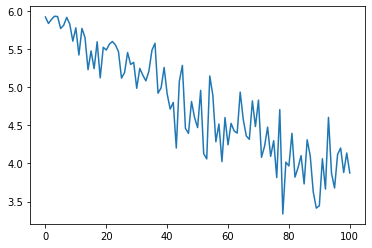

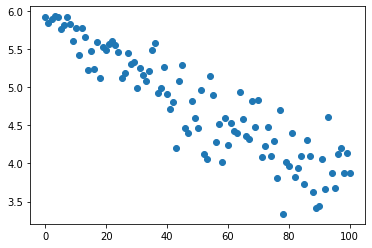

Iteration:   3%|███▍                                                                                                        | 200/6317 [04:31<2:12:37,  1.30s/it]

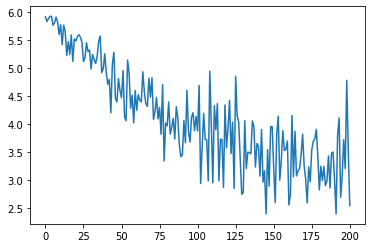

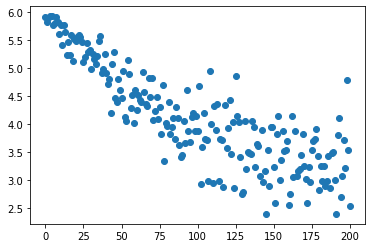

Iteration:   5%|█████▏                                                                                                      | 300/6317 [06:28<1:52:37,  1.12s/it]

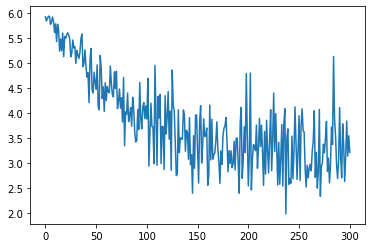

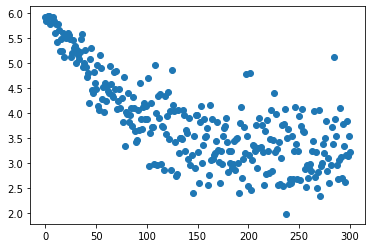

Iteration:   6%|██████▊                                                                                                     | 400/6317 [08:29<1:49:43,  1.11s/it]

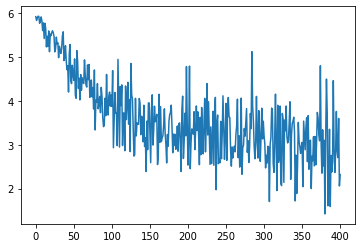

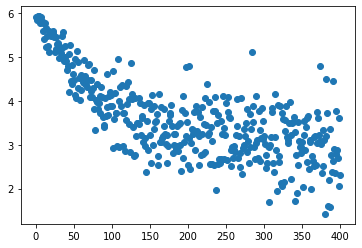

Iteration:   8%|████████▌                                                                                                   | 500/6317 [10:28<2:19:15,  1.44s/it]

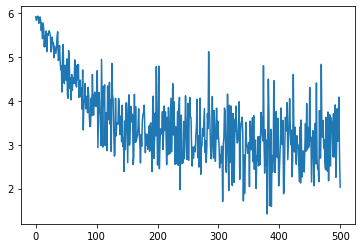

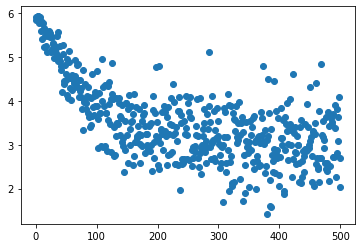

Iteration:   9%|██████████▎                                                                                                 | 600/6317 [12:26<1:40:00,  1.05s/it]

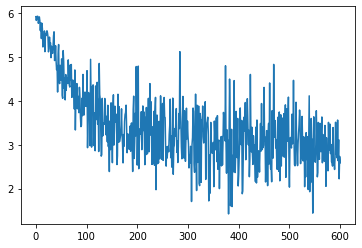

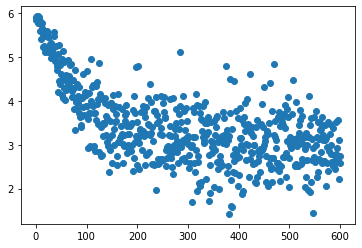

Iteration:  11%|███████████▉                                                                                                | 700/6317 [14:27<2:08:30,  1.37s/it]

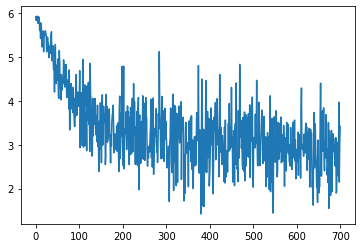

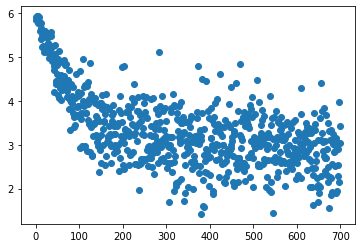

Iteration:  13%|█████████████▋                                                                                              | 800/6317 [16:28<1:37:16,  1.06s/it]

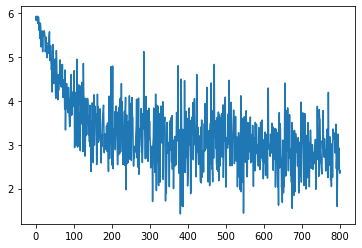

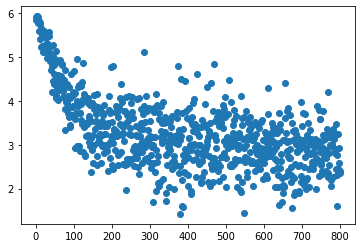

Iteration:  14%|███████████████▍                                                                                            | 900/6317 [18:32<2:03:19,  1.37s/it]

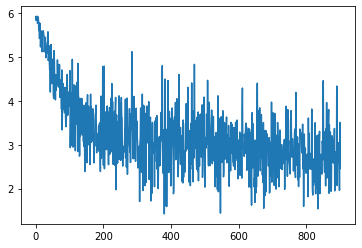

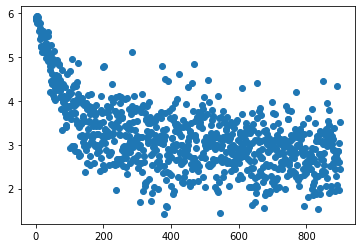

Iteration:  16%|████████████████▉                                                                                          | 1000/6317 [20:23<1:35:14,  1.07s/it]

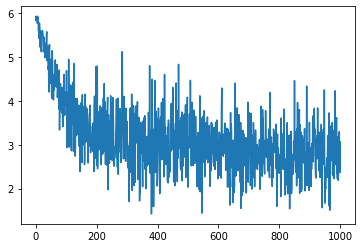

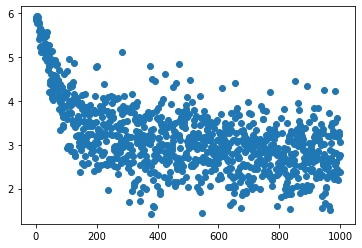

Iteration:  17%|██████████████████▋                                                                                        | 1100/6317 [22:17<2:01:03,  1.39s/it]

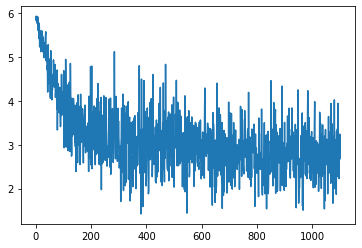

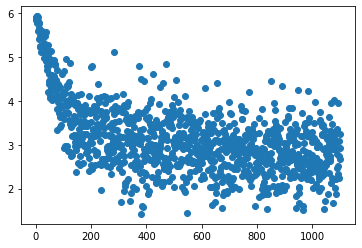

Iteration:  19%|████████████████████▎                                                                                      | 1200/6317 [24:23<2:07:28,  1.49s/it]

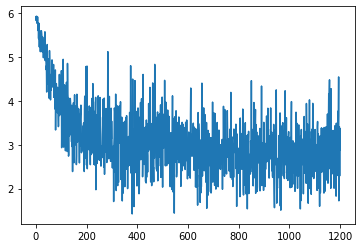

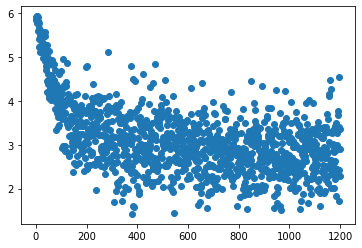

Iteration:  21%|██████████████████████                                                                                     | 1300/6317 [26:20<1:43:54,  1.24s/it]

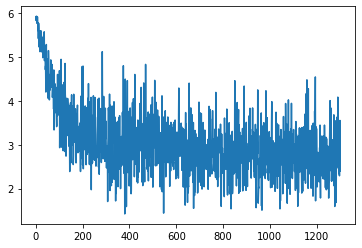

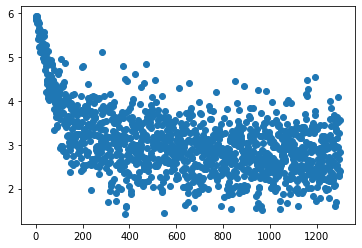

Iteration:  22%|███████████████████████▋                                                                                   | 1400/6317 [28:29<2:00:24,  1.47s/it]

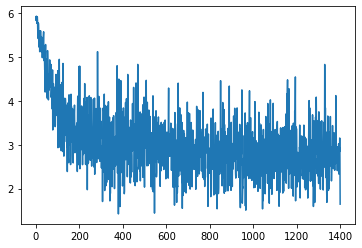

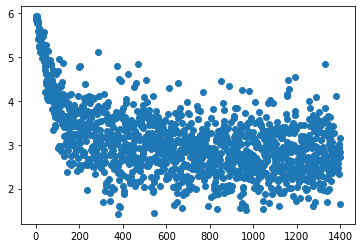

Iteration:  24%|█████████████████████████▍                                                                                 | 1500/6317 [30:29<1:28:07,  1.10s/it]

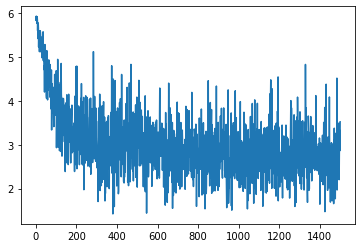

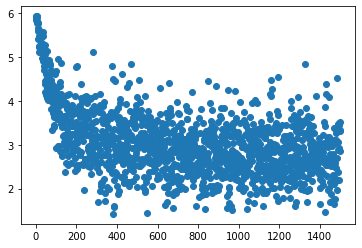

Iteration:  25%|███████████████████████████                                                                                | 1600/6317 [32:26<1:24:19,  1.07s/it]

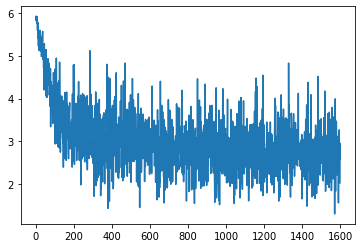

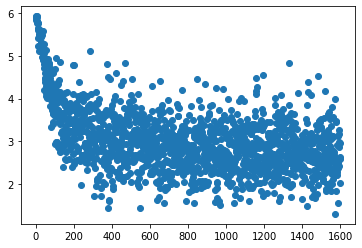

Iteration:  27%|████████████████████████████▊                                                                              | 1700/6317 [34:29<1:20:34,  1.05s/it]

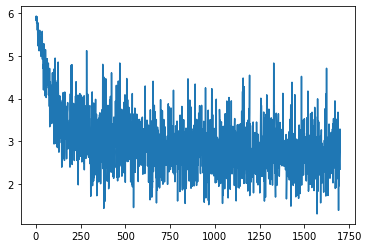

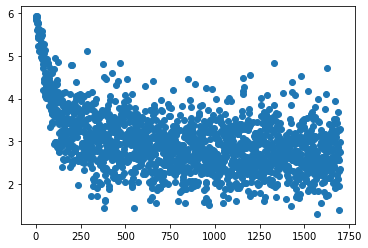

Iteration:  28%|██████████████████████████████▍                                                                            | 1800/6317 [36:40<1:36:42,  1.28s/it]

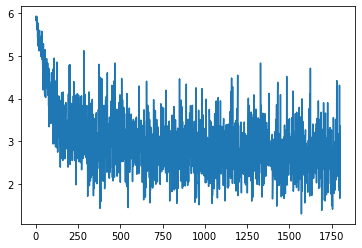

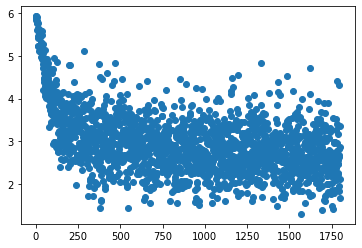

Iteration:  30%|████████████████████████████████▏                                                                          | 1900/6317 [38:47<1:42:53,  1.40s/it]

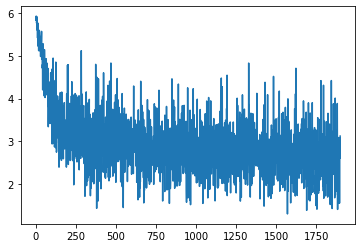

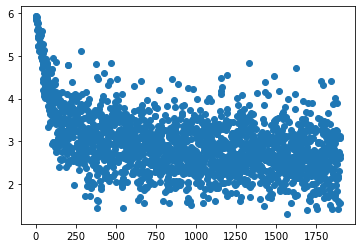

Iteration:  32%|█████████████████████████████████▉                                                                         | 2000/6317 [40:48<1:47:50,  1.50s/it]

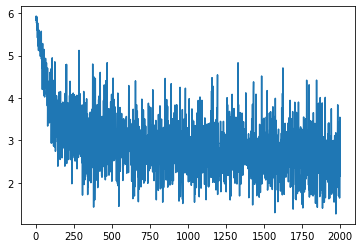

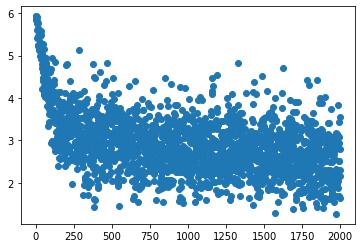

Iteration:  33%|███████████████████████████████████▌                                                                       | 2100/6317 [42:52<1:38:52,  1.41s/it]

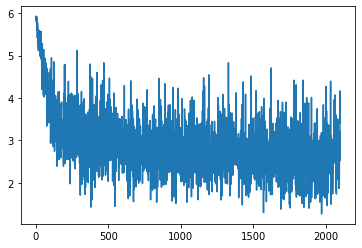

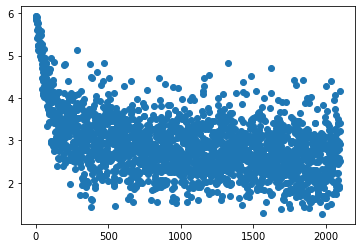

Iteration:  35%|█████████████████████████████████████▎                                                                     | 2200/6317 [44:58<1:37:10,  1.42s/it]

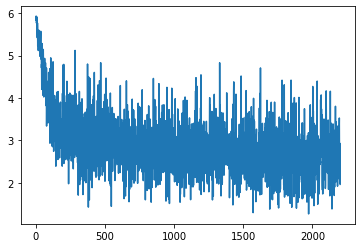

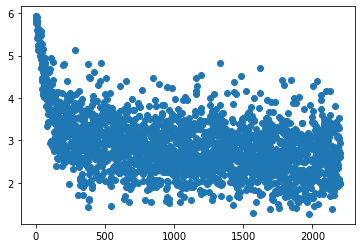

Iteration:  36%|██████████████████████████████████████▉                                                                    | 2300/6317 [47:04<1:27:40,  1.31s/it]

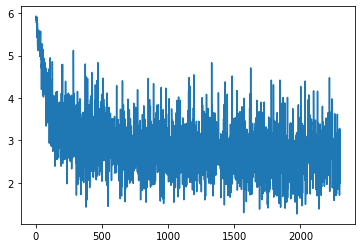

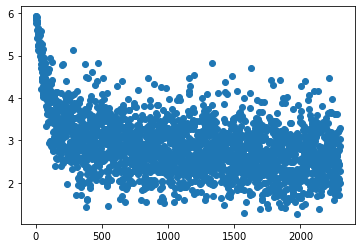

Iteration:  38%|████████████████████████████████████████▋                                                                  | 2400/6317 [49:07<1:08:05,  1.04s/it]

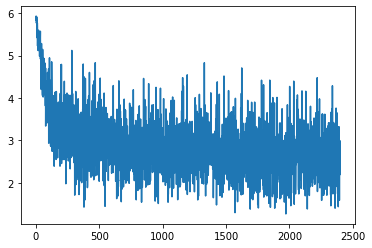

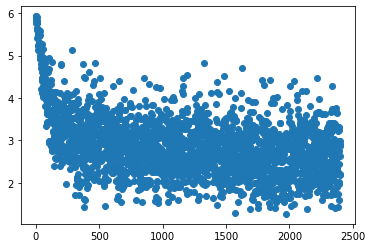

Iteration:  40%|██████████████████████████████████████████▎                                                                | 2500/6317 [51:11<1:30:38,  1.42s/it]

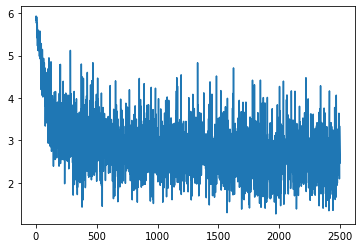

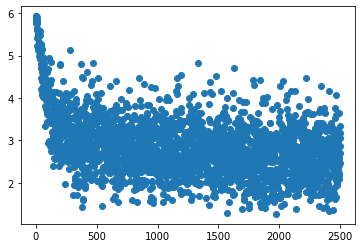

Iteration:  41%|████████████████████████████████████████████                                                               | 2600/6317 [53:17<1:06:17,  1.07s/it]

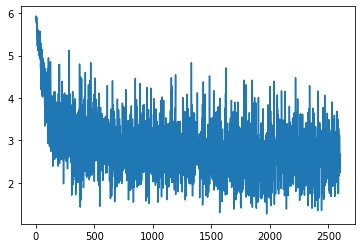

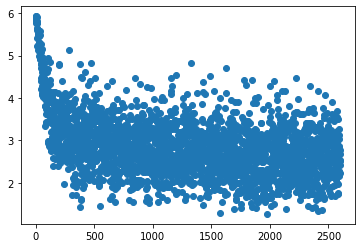

Iteration:  43%|█████████████████████████████████████████████▋                                                             | 2700/6317 [55:19<1:04:01,  1.06s/it]

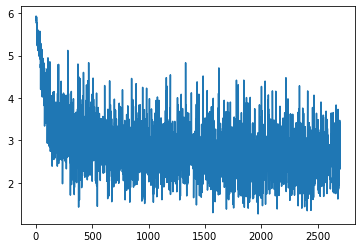

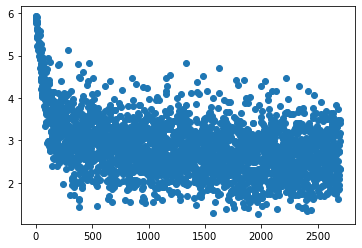

Iteration:  44%|███████████████████████████████████████████████▍                                                           | 2800/6317 [57:15<1:02:40,  1.07s/it]

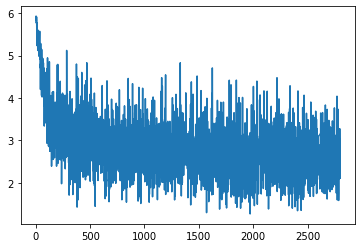

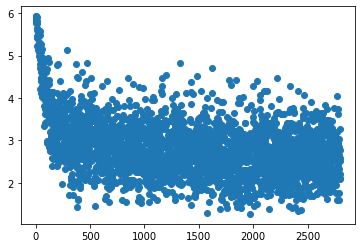

Iteration:  46%|█████████████████████████████████████████████████                                                          | 2900/6317 [59:18<1:16:59,  1.35s/it]

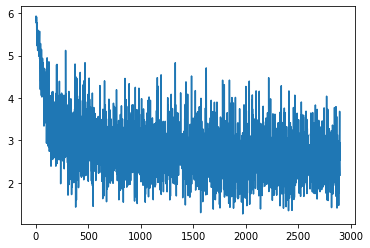

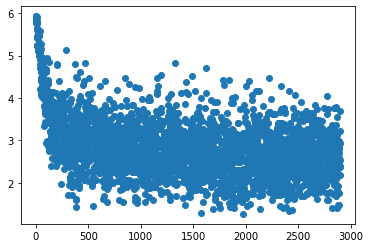

Iteration:  47%|█████████████████████████████████████████████████▊                                                       | 3000/6317 [1:01:16<1:20:38,  1.46s/it]

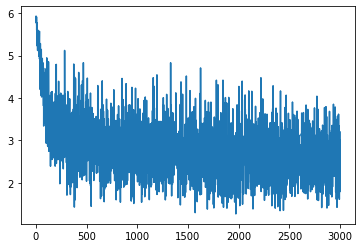

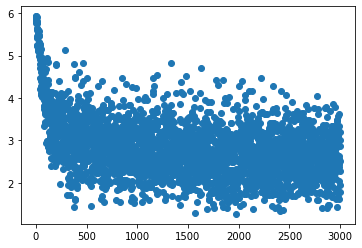

Iteration:  49%|████████████████████████████████████████████████████▌                                                      | 3100/6317 [1:03:26<59:07,  1.10s/it]

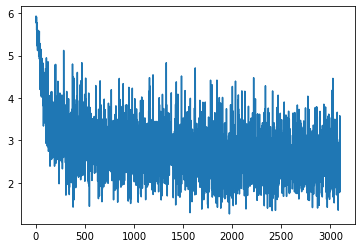

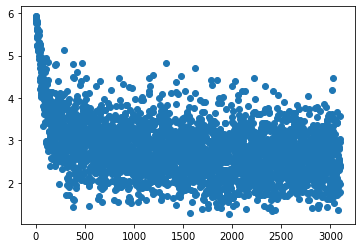

Iteration:  51%|█████████████████████████████████████████████████████▏                                                   | 3200/6317 [1:05:28<1:02:49,  1.21s/it]

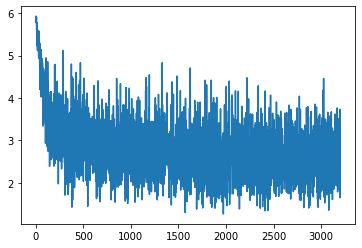

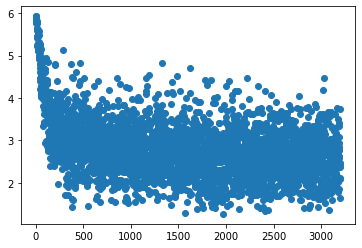

Iteration:  52%|███████████████████████████████████████████████████████▉                                                   | 3300/6317 [1:07:29<58:54,  1.17s/it]

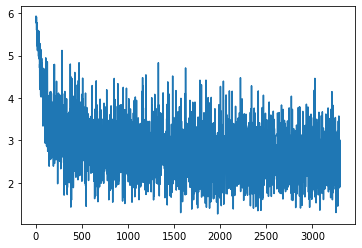

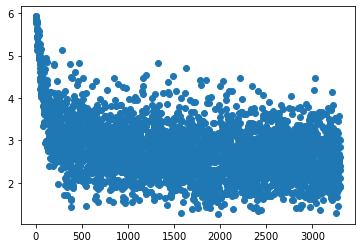

Iteration:  54%|████████████████████████████████████████████████████████▌                                                | 3400/6317 [1:09:30<1:01:34,  1.27s/it]

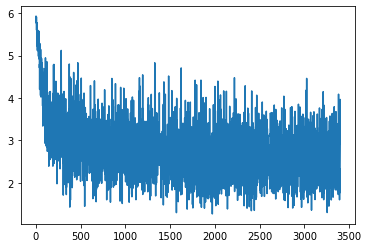

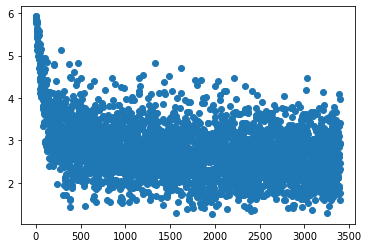

Iteration:  55%|███████████████████████████████████████████████████████████▎                                               | 3500/6317 [1:11:31<56:42,  1.21s/it]

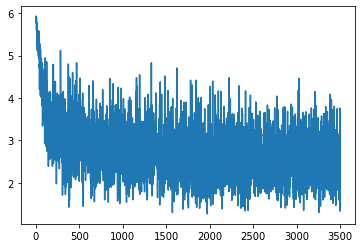

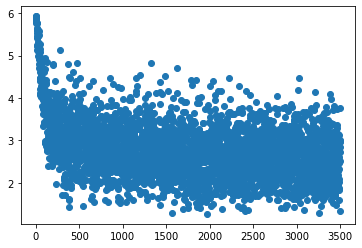

Iteration:  57%|███████████████████████████████████████████████████████████▊                                             | 3600/6317 [1:13:36<1:03:40,  1.41s/it]

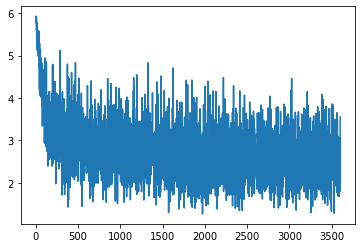

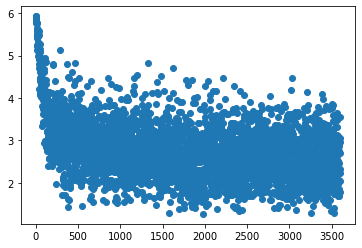

Iteration:  59%|█████████████████████████████████████████████████████████████▌                                           | 3700/6317 [1:15:39<1:01:13,  1.40s/it]

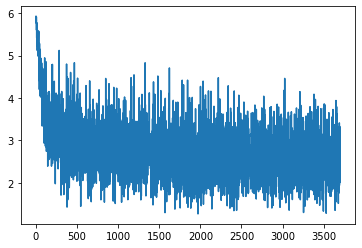

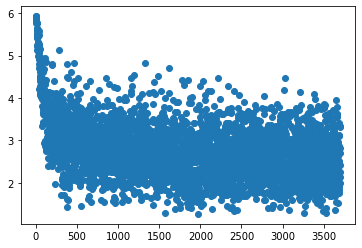

Iteration:  60%|████████████████████████████████████████████████████████████████▎                                          | 3800/6317 [1:17:36<47:53,  1.14s/it]

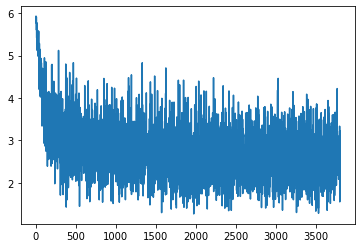

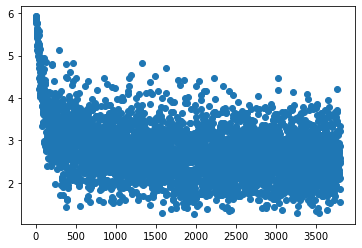

Iteration:  62%|██████████████████████████████████████████████████████████████████                                         | 3900/6317 [1:19:42<42:32,  1.06s/it]

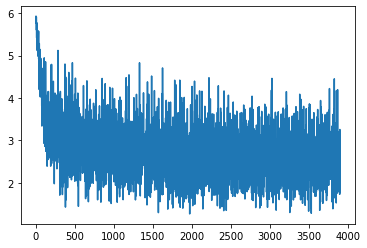

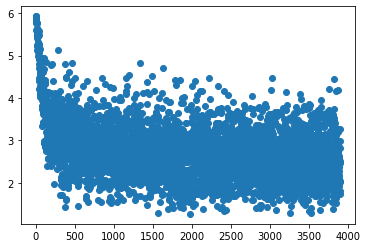

Iteration:  63%|███████████████████████████████████████████████████████████████████▊                                       | 4000/6317 [1:21:42<53:14,  1.38s/it]

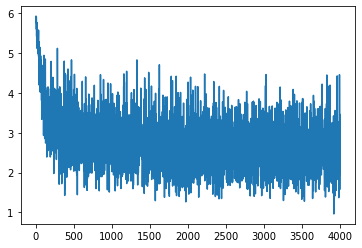

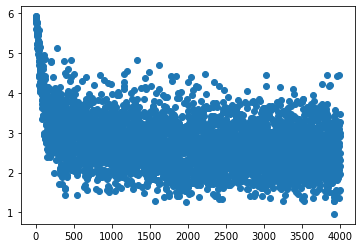

Iteration:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 4100/6317 [1:23:37<46:02,  1.25s/it]

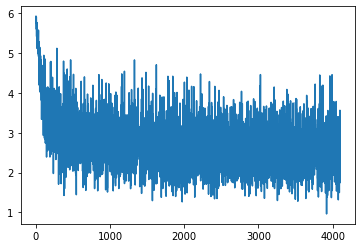

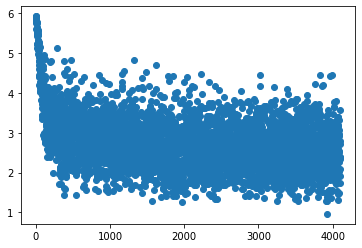

Iteration:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 4200/6317 [1:25:41<48:08,  1.36s/it]

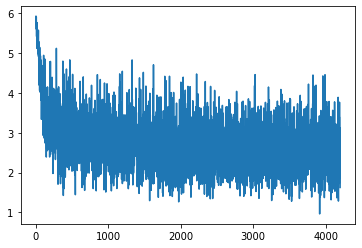

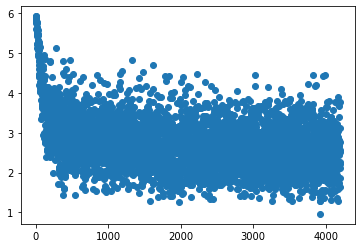

Iteration:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 4300/6317 [1:27:44<44:36,  1.33s/it]

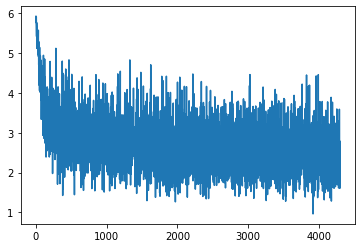

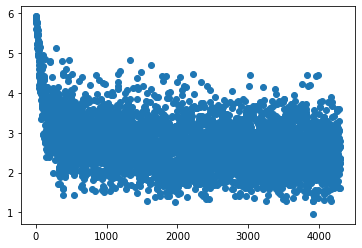

Iteration:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 4400/6317 [1:29:46<39:17,  1.23s/it]

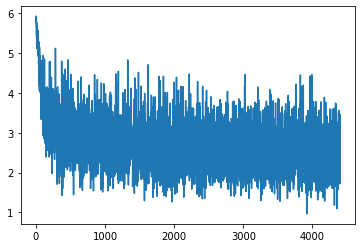

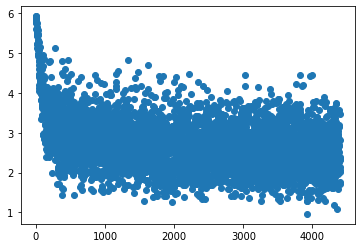

Iteration:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 4500/6317 [1:31:42<33:57,  1.12s/it]

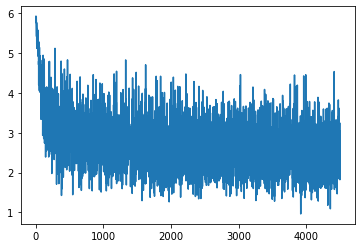

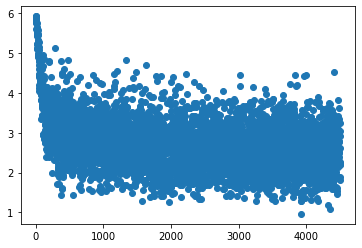

Iteration:  73%|█████████████████████████████████████████████████████████████████████████████▉                             | 4600/6317 [1:33:37<32:28,  1.13s/it]

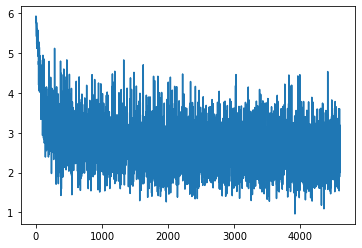

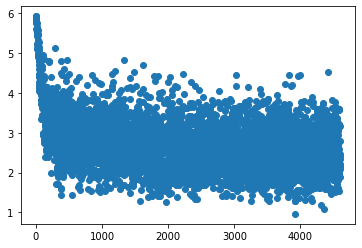

Iteration:  74%|███████████████████████████████████████████████████████████████████████████████▌                           | 4700/6317 [1:35:39<27:28,  1.02s/it]

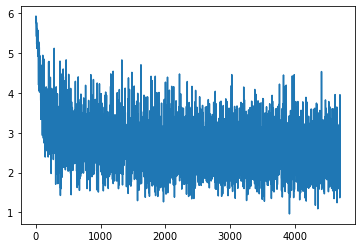

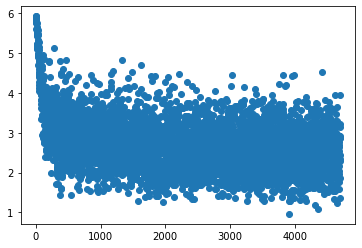

Iteration:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 4800/6317 [1:37:46<35:37,  1.41s/it]

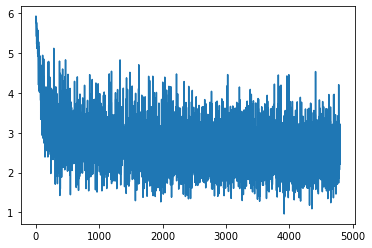

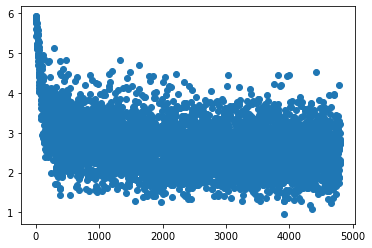

Iteration:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 4900/6317 [1:39:45<35:24,  1.50s/it]

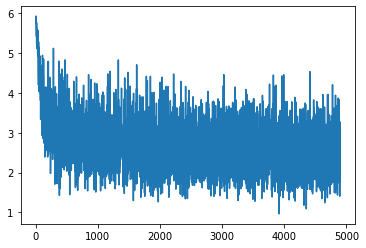

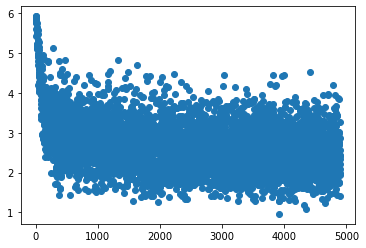

Iteration:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 5000/6317 [1:41:49<23:29,  1.07s/it]

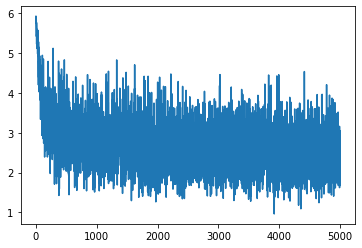

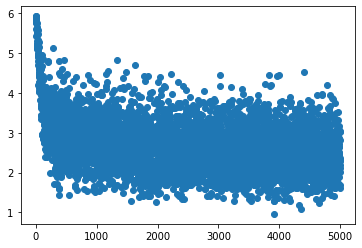

Iteration:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 5100/6317 [1:43:52<27:06,  1.34s/it]

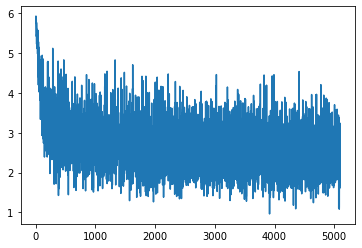

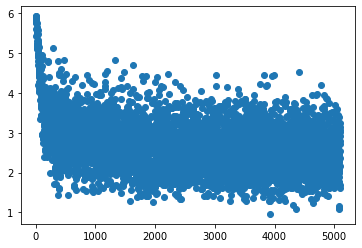

Iteration:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 5200/6317 [1:45:55<19:47,  1.06s/it]

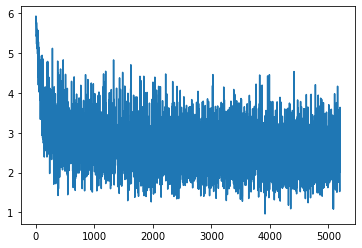

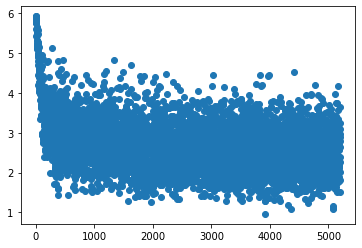

Iteration:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 5300/6317 [1:47:54<22:44,  1.34s/it]

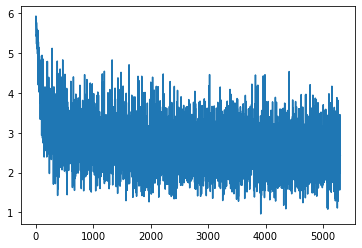

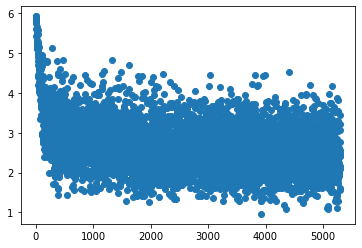

Iteration:  85%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 5400/6317 [1:49:53<19:47,  1.29s/it]

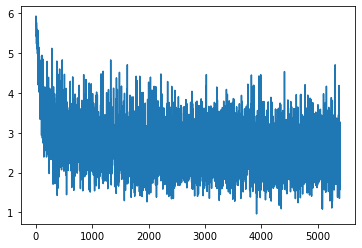

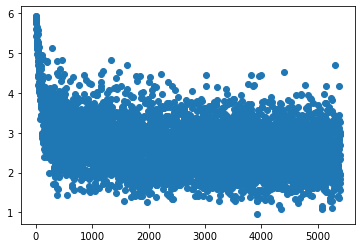

Iteration:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▏             | 5500/6317 [1:51:53<16:50,  1.24s/it]

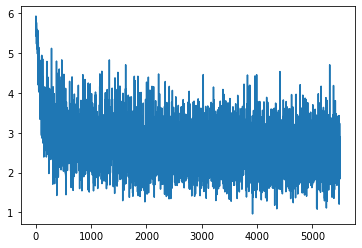

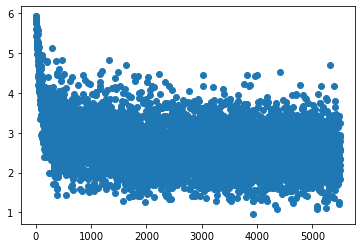

Iteration:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 5600/6317 [1:53:55<15:09,  1.27s/it]

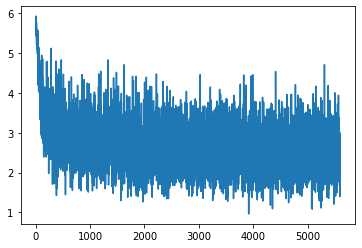

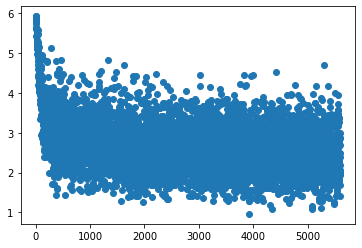

Iteration:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5700/6317 [1:55:54<15:14,  1.48s/it]

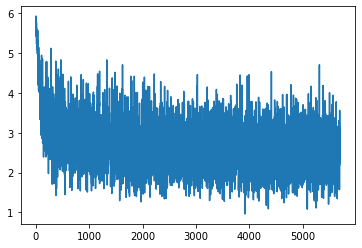

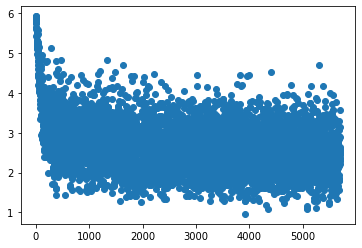

Iteration:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▏        | 5800/6317 [1:57:49<09:21,  1.09s/it]

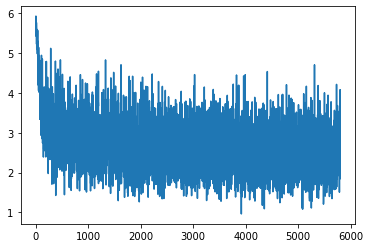

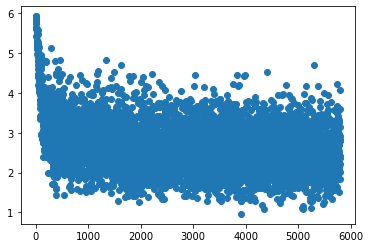

Iteration:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉       | 5900/6317 [1:59:48<10:52,  1.56s/it]

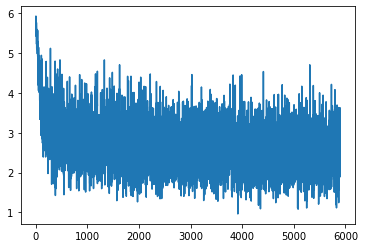

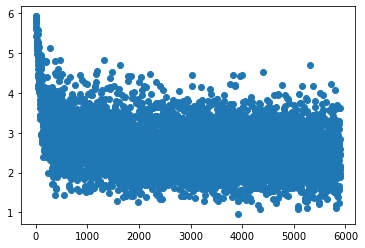

Iteration:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6000/6317 [2:01:55<07:26,  1.41s/it]

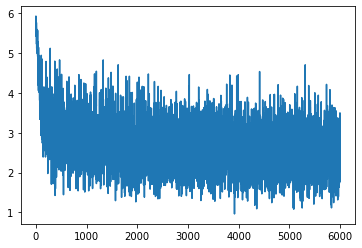

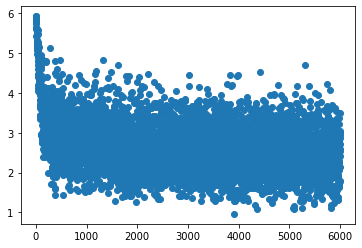

Iteration:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6100/6317 [2:04:00<04:53,  1.35s/it]

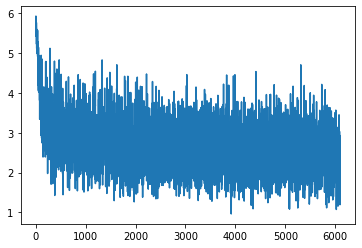

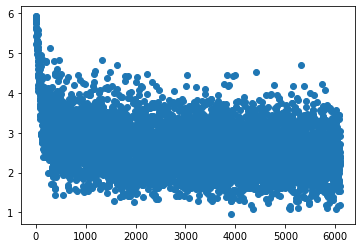

Iteration:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6200/6317 [2:05:56<02:16,  1.17s/it]

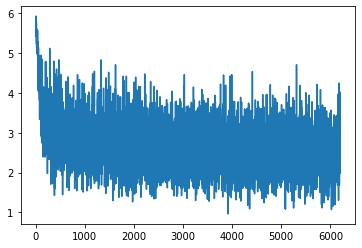

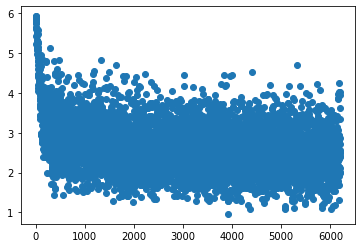

Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6300/6317 [2:07:58<00:22,  1.33s/it]

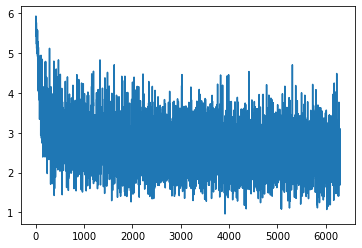

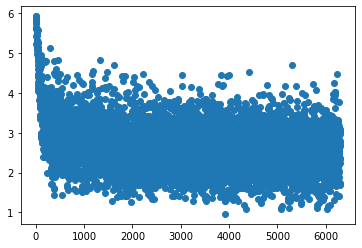

Iteration:   0%|                                                                                                                        | 0/6317 [00:00<?, ?it/s]

Epoch loss 16823.369022667408
Epoch 1 complete, saving probes
Training epoch: 2


Iteration:   2%|█▋                                                                                                          | 100/6317 [02:02<1:45:54,  1.02s/it]

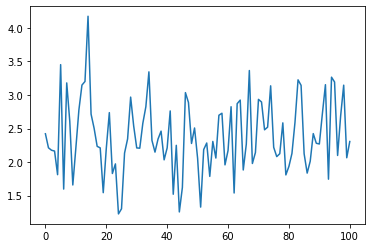

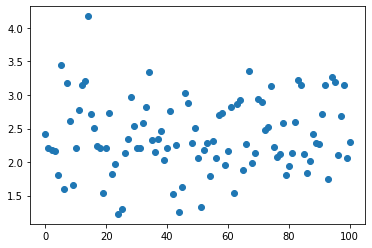

Iteration:   3%|███▍                                                                                                        | 200/6317 [04:03<1:45:33,  1.04s/it]

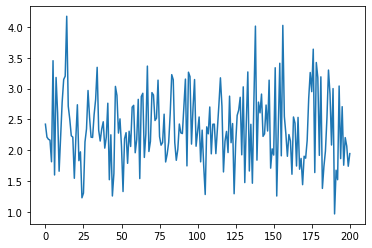

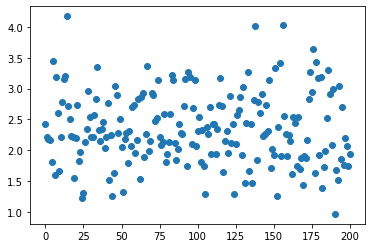

Iteration:   5%|█████▏                                                                                                      | 300/6317 [06:06<1:42:38,  1.02s/it]

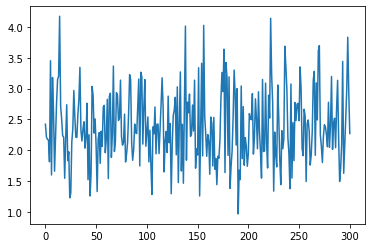

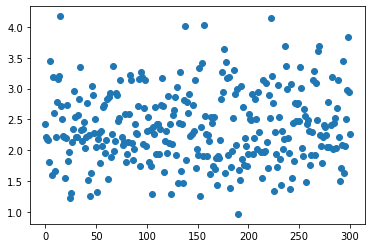

Iteration:   6%|██████▊                                                                                                     | 400/6317 [08:00<1:46:24,  1.08s/it]

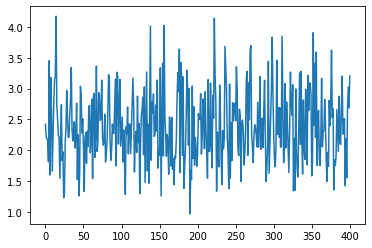

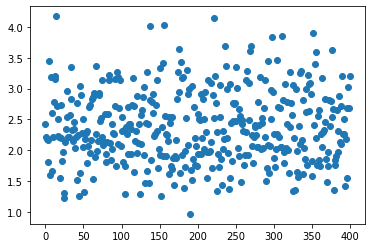

Iteration:   8%|████████▌                                                                                                   | 500/6317 [10:02<1:40:32,  1.04s/it]

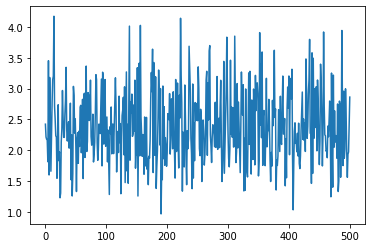

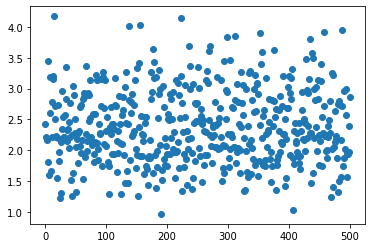

Iteration:   9%|██████████▎                                                                                                 | 600/6317 [12:02<2:09:20,  1.36s/it]

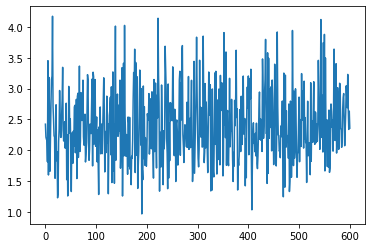

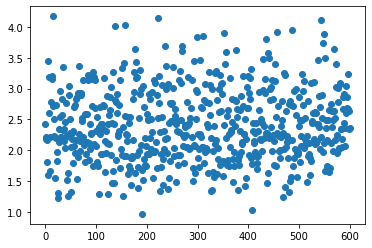

Iteration:  11%|███████████▉                                                                                                | 700/6317 [14:03<1:39:03,  1.06s/it]

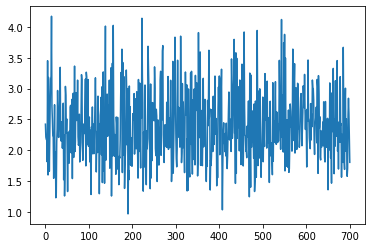

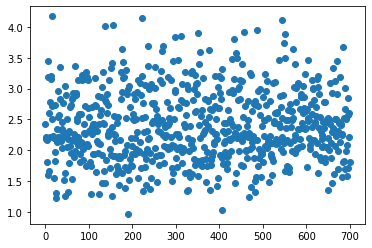

Iteration:  13%|█████████████▋                                                                                              | 800/6317 [16:02<2:19:39,  1.52s/it]

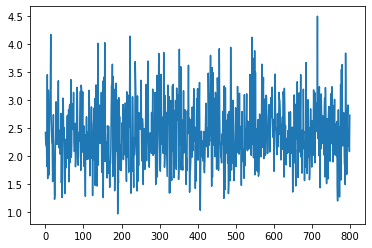

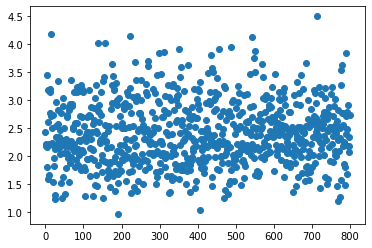

Iteration:  14%|███████████████▍                                                                                            | 900/6317 [18:03<2:07:30,  1.41s/it]

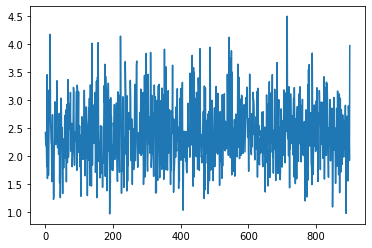

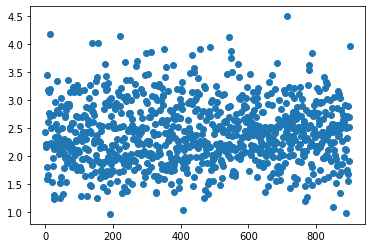

Iteration:  16%|████████████████▉                                                                                          | 1000/6317 [20:07<1:47:24,  1.21s/it]

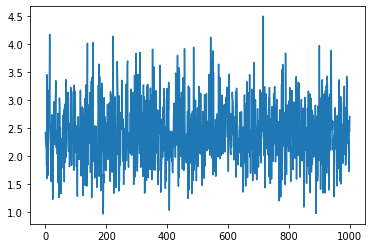

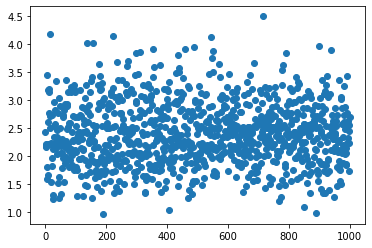

Iteration:  17%|██████████████████▋                                                                                        | 1100/6317 [22:10<2:06:18,  1.45s/it]

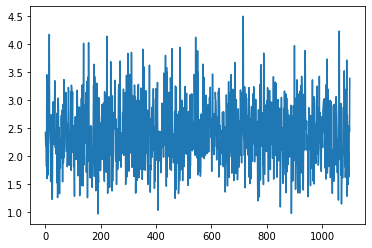

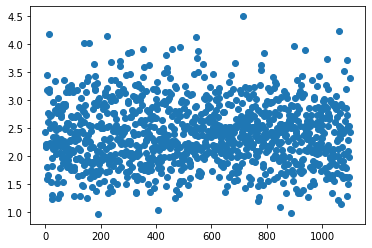

Iteration:  19%|████████████████████▎                                                                                      | 1200/6317 [24:16<1:34:42,  1.11s/it]

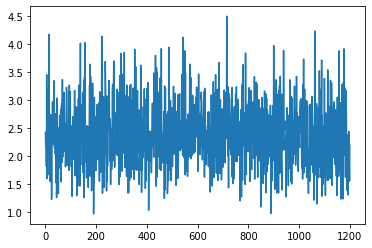

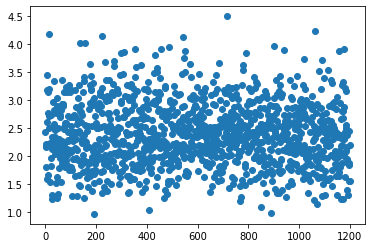

Iteration:  21%|██████████████████████                                                                                     | 1300/6317 [26:26<1:37:47,  1.17s/it]

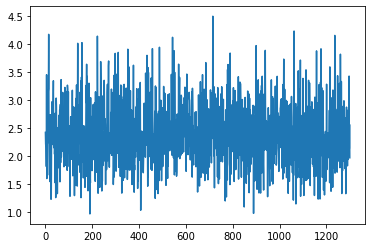

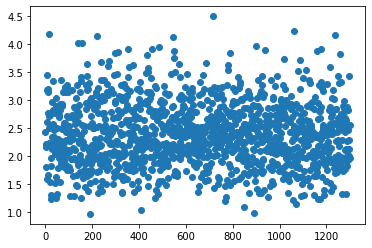

Iteration:  22%|███████████████████████▋                                                                                   | 1400/6317 [28:28<1:29:02,  1.09s/it]

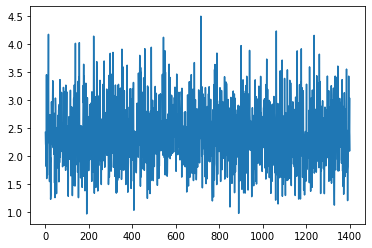

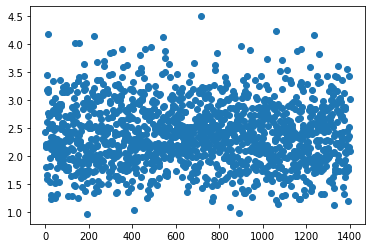

Iteration:  24%|█████████████████████████▍                                                                                 | 1500/6317 [30:30<1:42:37,  1.28s/it]

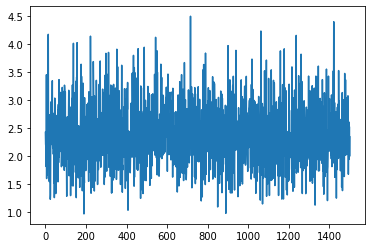

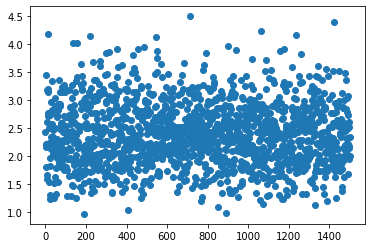

Iteration:  25%|███████████████████████████                                                                                | 1600/6317 [32:30<1:46:57,  1.36s/it]

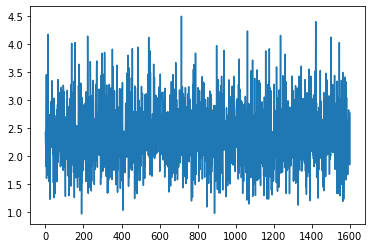

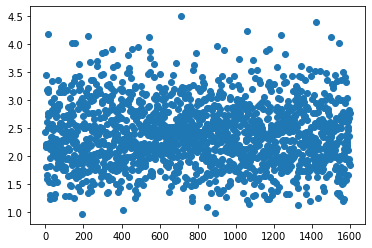

Iteration:  27%|████████████████████████████▊                                                                              | 1700/6317 [34:38<1:25:06,  1.11s/it]

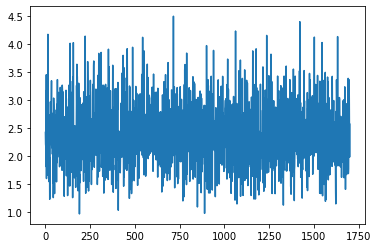

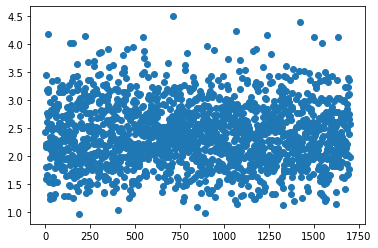

Iteration:  28%|██████████████████████████████▍                                                                            | 1800/6317 [36:33<1:39:11,  1.32s/it]

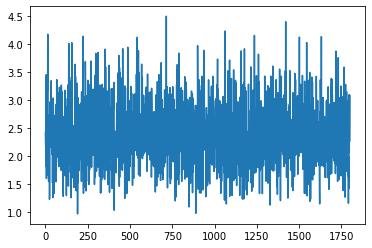

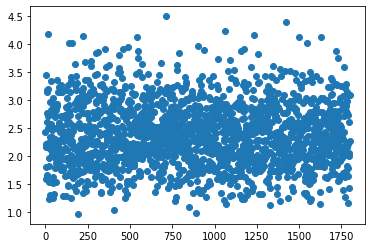

Iteration:  30%|████████████████████████████████▏                                                                          | 1900/6317 [38:41<1:35:46,  1.30s/it]

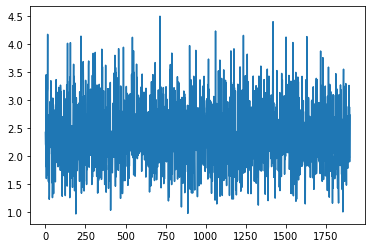

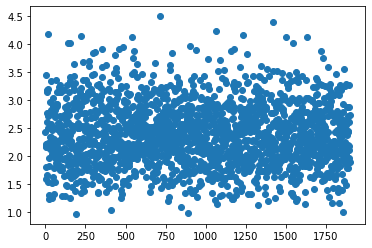

Iteration:  32%|█████████████████████████████████▉                                                                         | 2000/6317 [40:39<1:32:42,  1.29s/it]

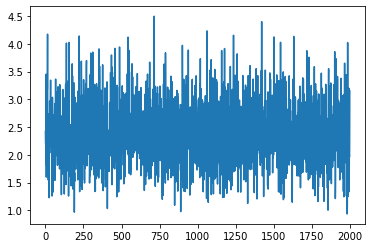

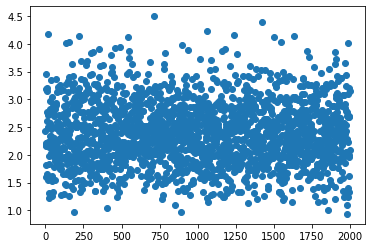

Iteration:  33%|███████████████████████████████████▌                                                                       | 2100/6317 [42:44<1:41:01,  1.44s/it]

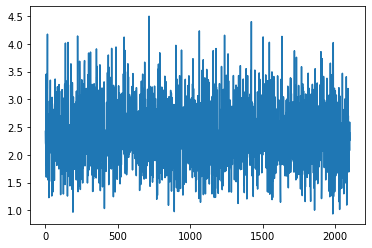

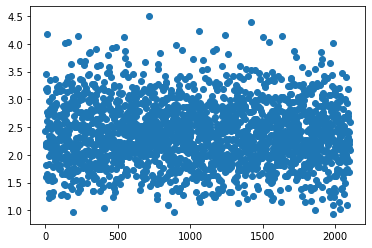

Iteration:  35%|█████████████████████████████████████▎                                                                     | 2200/6317 [44:49<1:31:12,  1.33s/it]

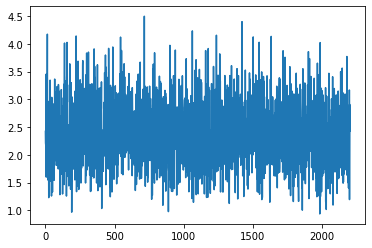

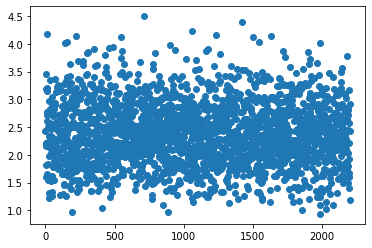

Iteration:  36%|██████████████████████████████████████▉                                                                    | 2300/6317 [46:45<1:14:53,  1.12s/it]

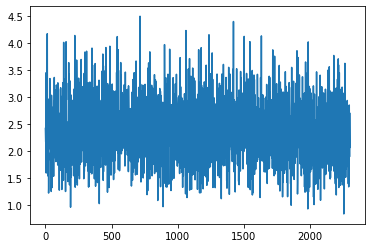

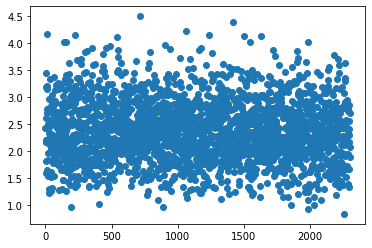

Iteration:  38%|████████████████████████████████████████▋                                                                  | 2400/6317 [48:46<1:28:57,  1.36s/it]

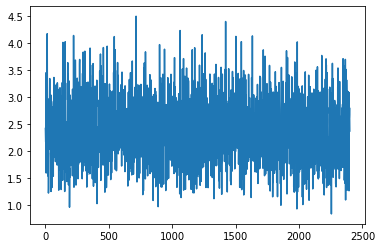

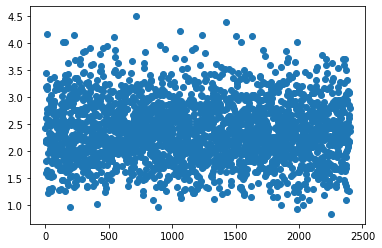

Iteration:  40%|██████████████████████████████████████████▎                                                                | 2500/6317 [50:58<1:34:14,  1.48s/it]

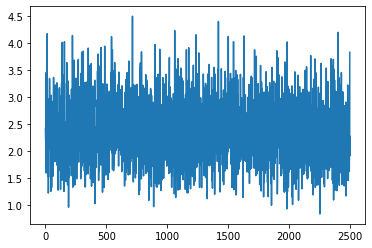

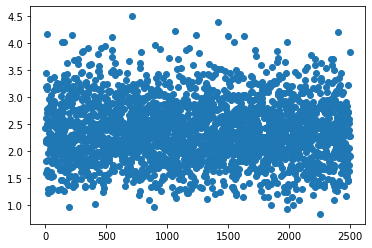

Iteration:  41%|████████████████████████████████████████████                                                               | 2600/6317 [53:03<1:32:17,  1.49s/it]

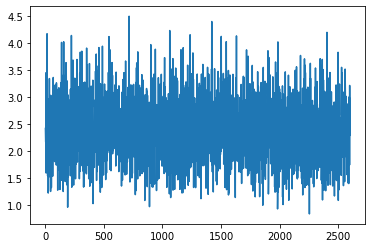

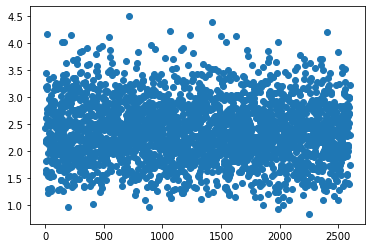

Iteration:  43%|█████████████████████████████████████████████▋                                                             | 2700/6317 [55:07<1:27:02,  1.44s/it]

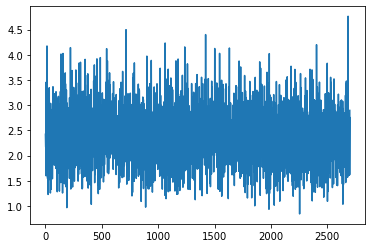

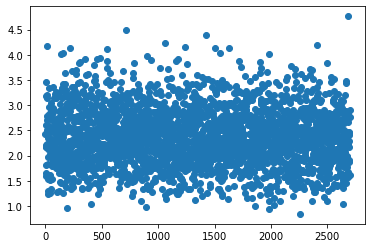

Iteration:  44%|███████████████████████████████████████████████▍                                                           | 2800/6317 [57:07<1:03:07,  1.08s/it]

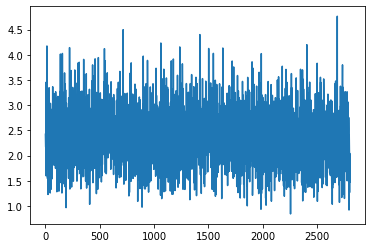

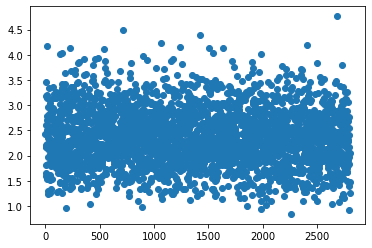

Iteration:  46%|█████████████████████████████████████████████████                                                          | 2900/6317 [59:11<1:02:32,  1.10s/it]

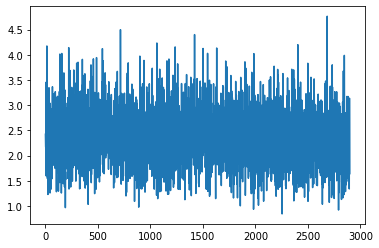

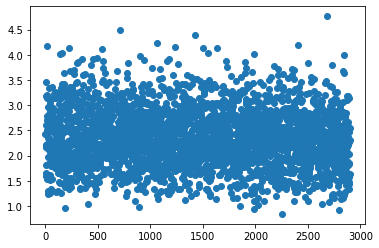

Iteration:  47%|██████████████████████████████████████████████████▊                                                        | 3000/6317 [1:01:23<58:45,  1.06s/it]

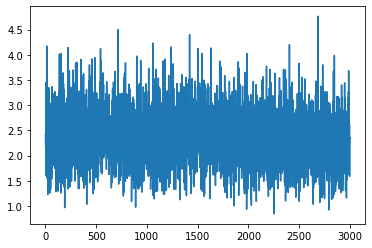

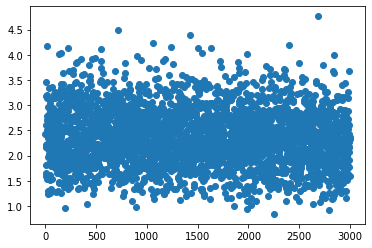

Iteration:  49%|███████████████████████████████████████████████████▌                                                     | 3100/6317 [1:03:29<1:14:57,  1.40s/it]

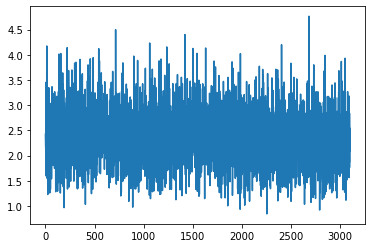

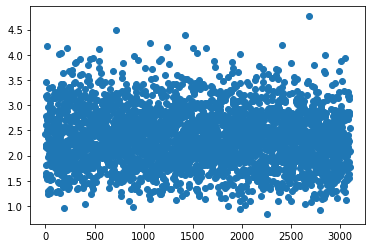

Iteration:  51%|█████████████████████████████████████████████████████▏                                                   | 3200/6317 [1:05:30<1:04:26,  1.24s/it]

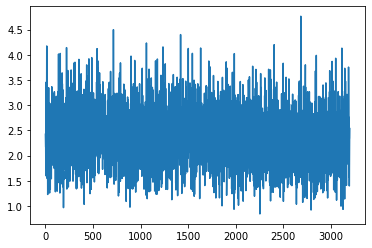

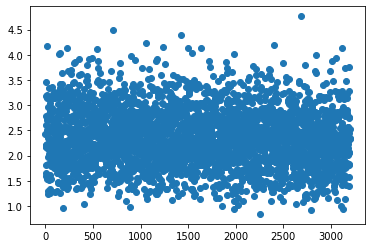

Iteration:  52%|██████████████████████████████████████████████████████▊                                                  | 3300/6317 [1:07:44<1:12:14,  1.44s/it]

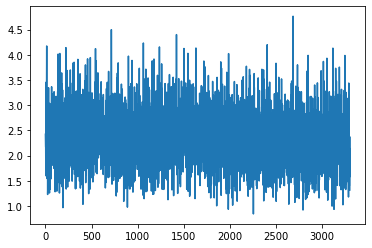

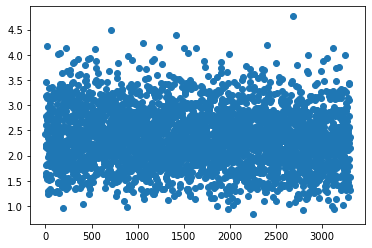

Iteration:  54%|████████████████████████████████████████████████████████▌                                                | 3400/6317 [1:09:43<1:00:22,  1.24s/it]

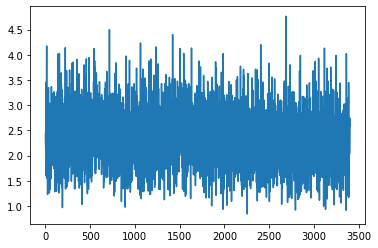

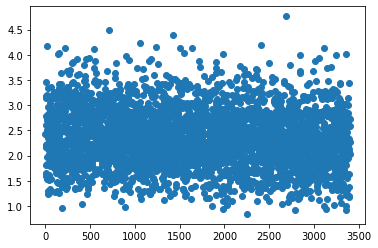

Iteration:  55%|██████████████████████████████████████████████████████████▏                                              | 3500/6317 [1:11:49<1:09:52,  1.49s/it]

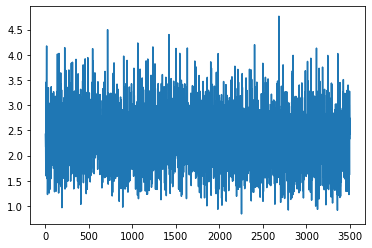

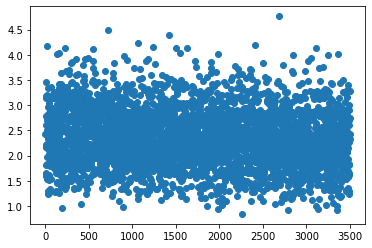

Iteration:  57%|███████████████████████████████████████████████████████████▊                                             | 3600/6317 [1:13:56<1:04:24,  1.42s/it]

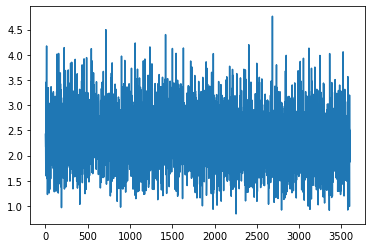

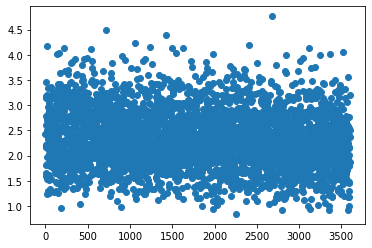

Iteration:  59%|█████████████████████████████████████████████████████████████▌                                           | 3700/6317 [1:16:04<1:02:45,  1.44s/it]

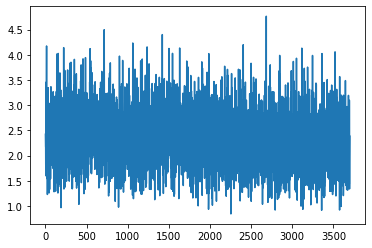

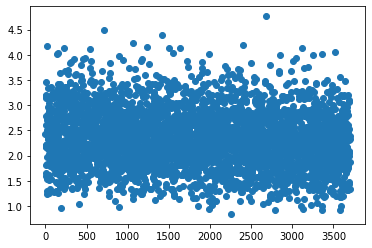

Iteration:  60%|████████████████████████████████████████████████████████████████▎                                          | 3800/6317 [1:18:11<58:45,  1.40s/it]

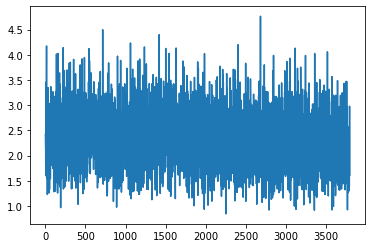

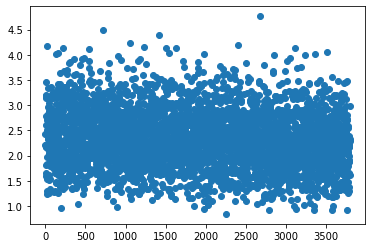

Iteration:  62%|██████████████████████████████████████████████████████████████████                                         | 3900/6317 [1:20:19<52:57,  1.31s/it]

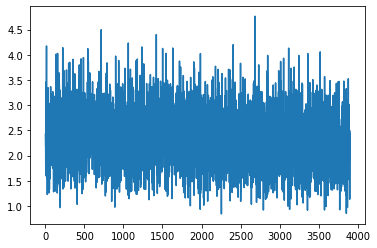

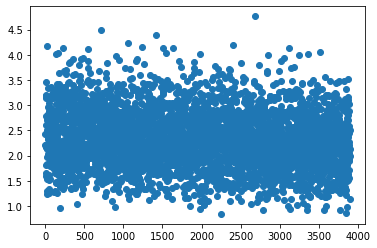

Iteration:  63%|███████████████████████████████████████████████████████████████████▊                                       | 4000/6317 [1:22:31<47:39,  1.23s/it]

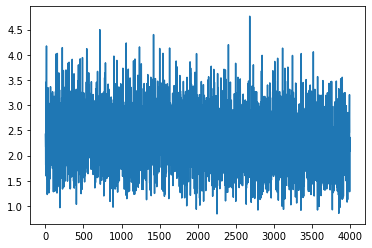

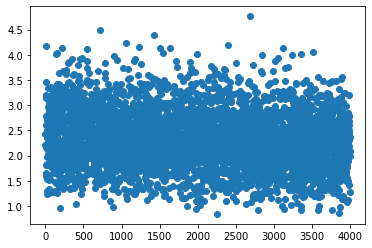

Iteration:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 4100/6317 [1:24:36<45:01,  1.22s/it]

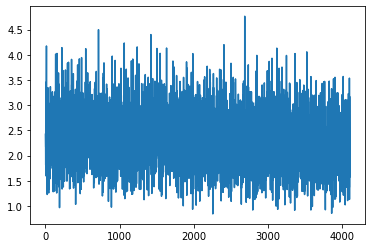

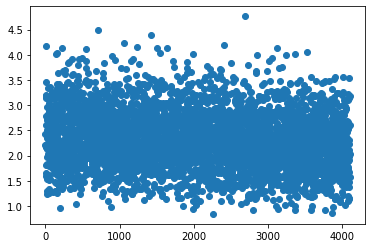

Iteration:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 4200/6317 [1:26:47<39:08,  1.11s/it]

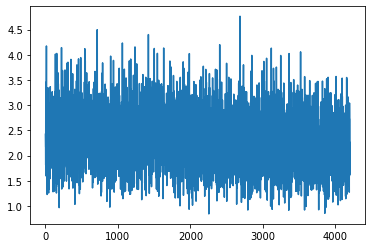

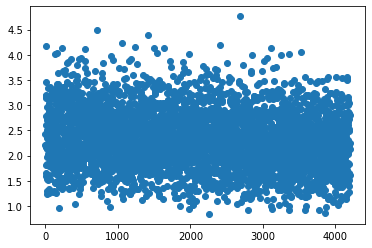

Iteration:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 4300/6317 [1:28:55<35:22,  1.05s/it]

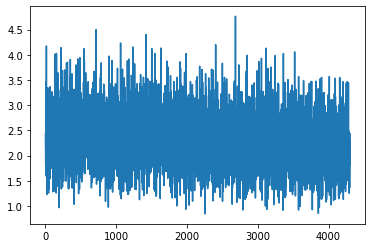

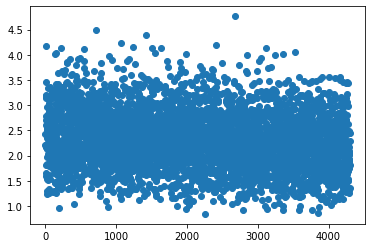

Iteration:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 4400/6317 [1:31:07<44:48,  1.40s/it]

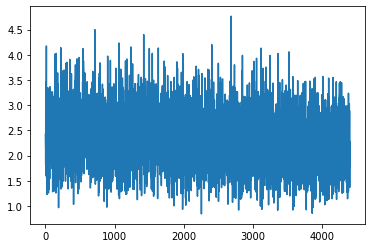

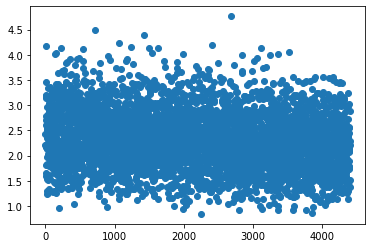

Iteration:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 4500/6317 [1:33:06<37:24,  1.24s/it]

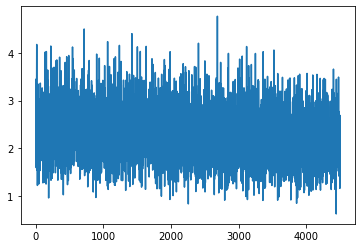

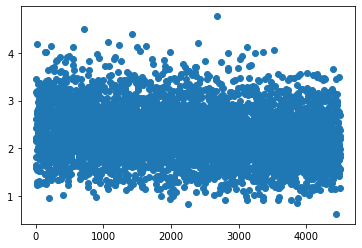

Iteration:  73%|█████████████████████████████████████████████████████████████████████████████▉                             | 4600/6317 [1:35:18<38:00,  1.33s/it]

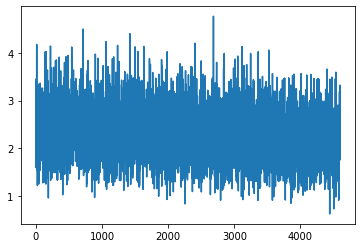

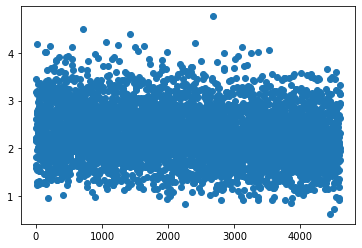

Iteration:  74%|███████████████████████████████████████████████████████████████████████████████▌                           | 4700/6317 [1:37:24<41:43,  1.55s/it]

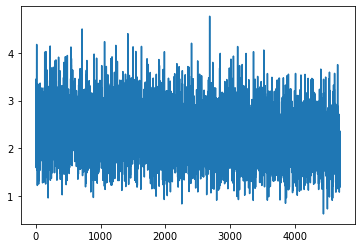

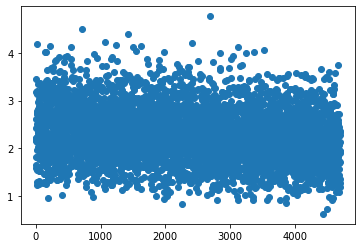

Iteration:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 4800/6317 [1:39:24<37:57,  1.50s/it]

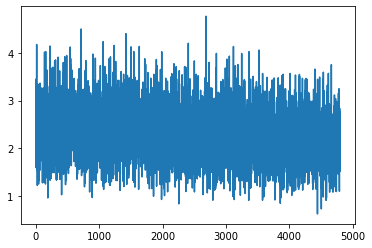

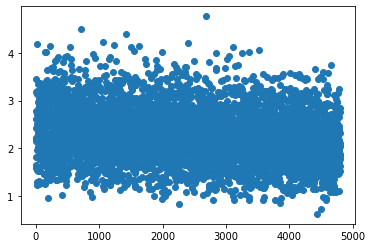

Iteration:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 4900/6317 [1:41:32<32:04,  1.36s/it]

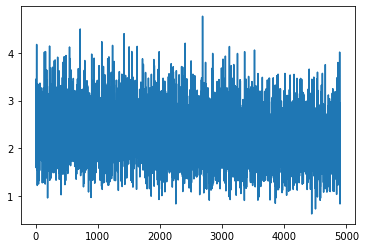

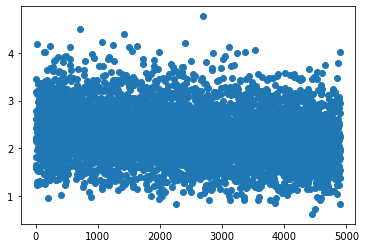

Iteration:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 5000/6317 [1:43:32<23:36,  1.08s/it]

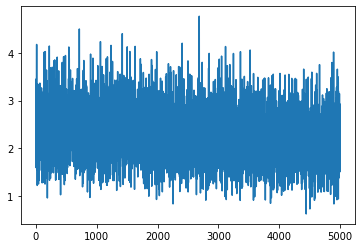

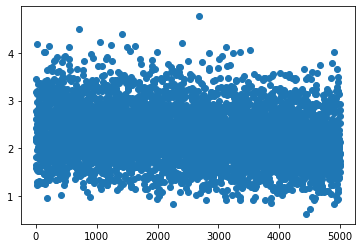

Iteration:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 5100/6317 [1:45:46<30:34,  1.51s/it]

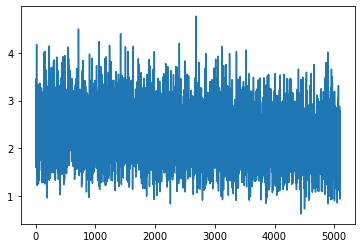

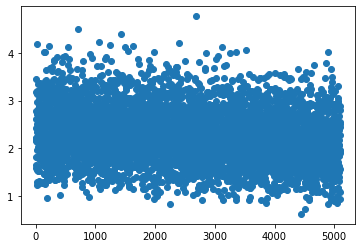

Iteration:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 5200/6317 [1:47:55<21:15,  1.14s/it]

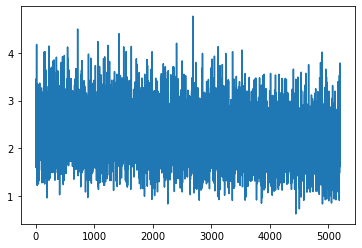

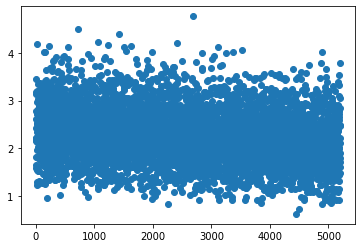

Iteration:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 5300/6317 [1:50:10<25:20,  1.50s/it]

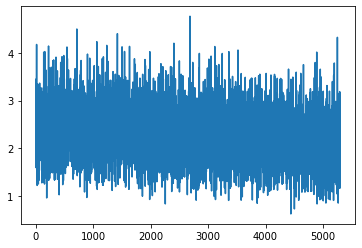

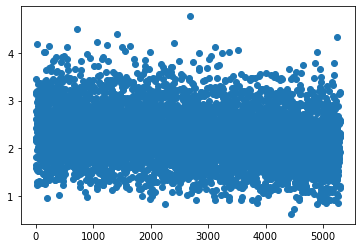

Iteration:  85%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 5400/6317 [1:52:12<20:17,  1.33s/it]

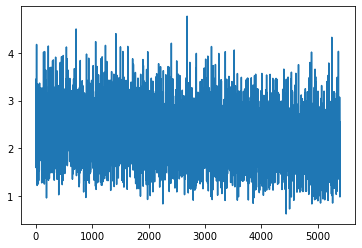

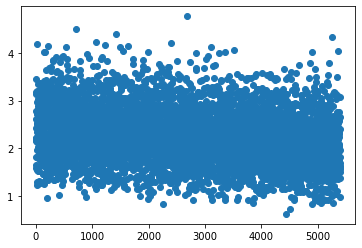

Iteration:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▏             | 5500/6317 [1:54:20<18:53,  1.39s/it]

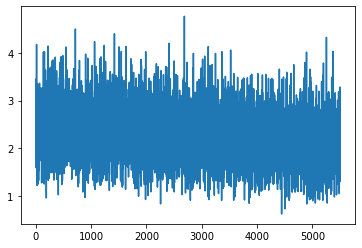

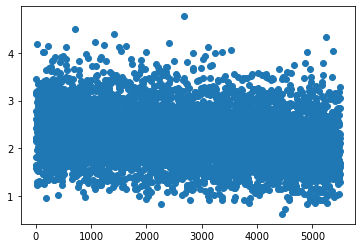

Iteration:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 5600/6317 [1:56:29<16:38,  1.39s/it]

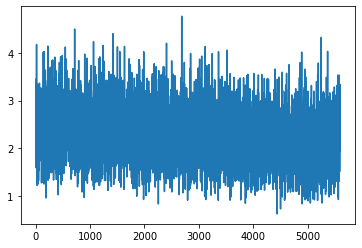

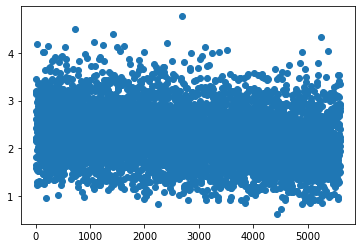

Iteration:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5700/6317 [1:58:44<14:25,  1.40s/it]

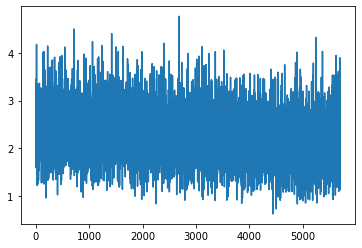

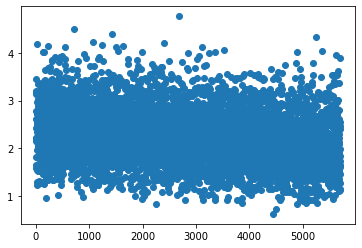

Iteration:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▏        | 5800/6317 [2:00:55<11:38,  1.35s/it]

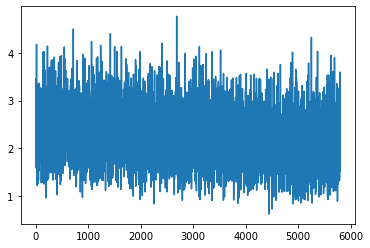

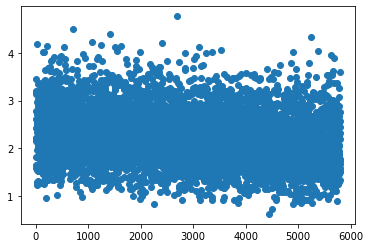

Iteration:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉       | 5900/6317 [2:03:00<07:37,  1.10s/it]

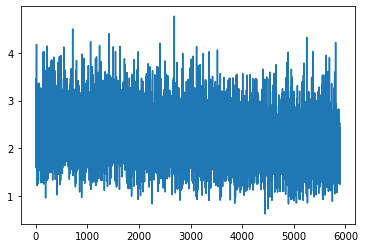

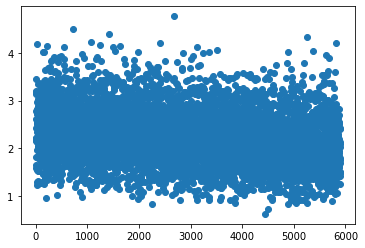

Iteration:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6000/6317 [2:05:09<07:32,  1.43s/it]

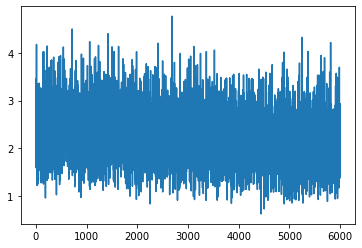

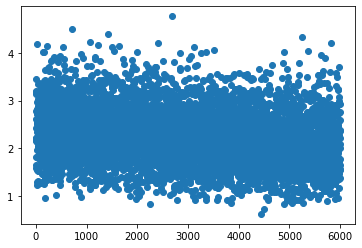

Iteration:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6100/6317 [2:07:20<04:44,  1.31s/it]

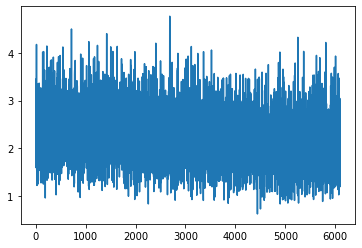

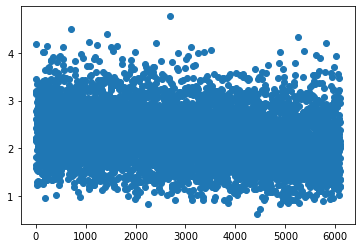

Iteration:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6200/6317 [2:09:34<02:48,  1.44s/it]

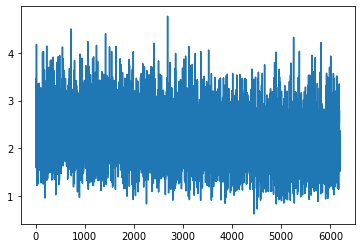

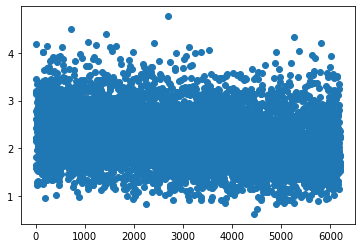

Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6300/6317 [2:11:35<00:21,  1.26s/it]

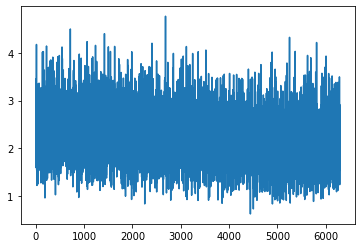

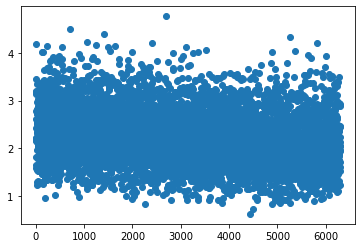

Iteration:   0%|                                                                                                                        | 0/6317 [00:00<?, ?it/s]

Epoch loss 14133.62822085619
Epoch 2 complete, saving probes
Training epoch: 3


Iteration:   2%|█▋                                                                                                          | 100/6317 [02:06<2:09:46,  1.25s/it]

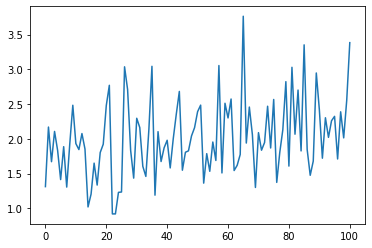

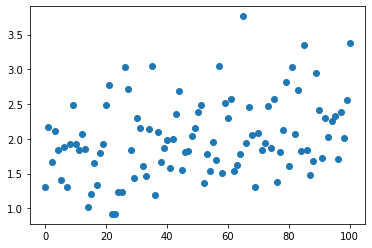

Iteration:   3%|███▍                                                                                                        | 200/6317 [04:18<1:48:27,  1.06s/it]

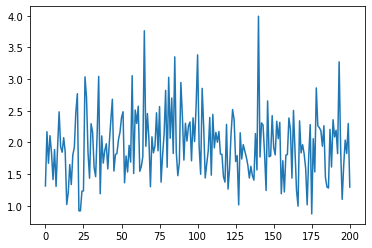

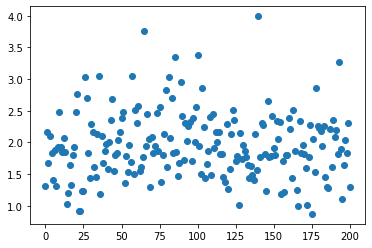

Iteration:   5%|█████▏                                                                                                      | 300/6317 [06:24<1:48:26,  1.08s/it]

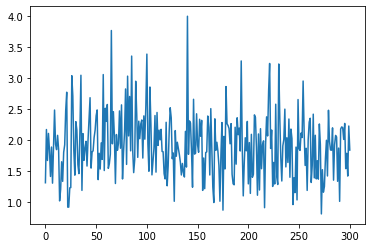

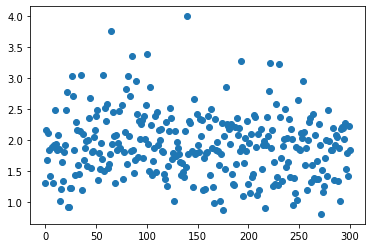

Iteration:   6%|██████▊                                                                                                     | 400/6317 [08:29<1:44:03,  1.06s/it]

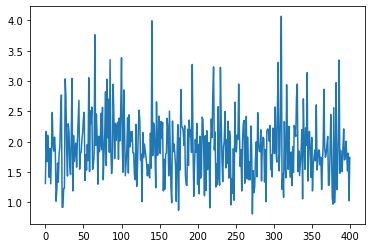

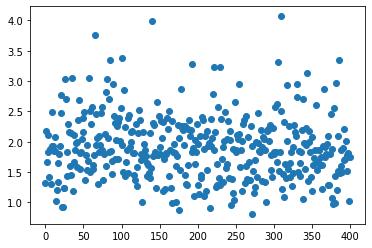

Iteration:   8%|████████▌                                                                                                   | 500/6317 [10:39<2:14:19,  1.39s/it]

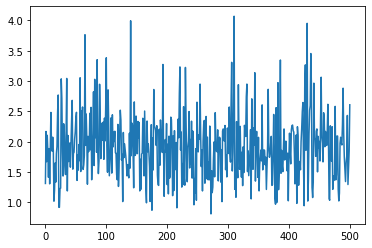

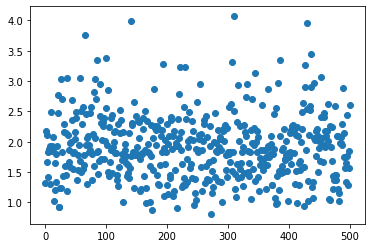

Iteration:   9%|██████████▎                                                                                                 | 600/6317 [12:42<1:45:57,  1.11s/it]

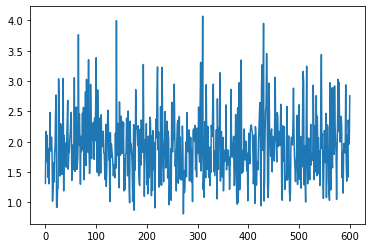

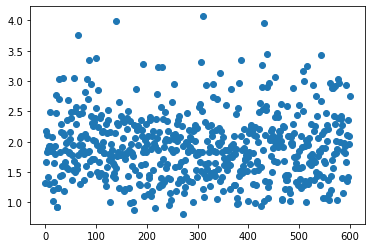

Iteration:  11%|███████████▉                                                                                                | 700/6317 [14:51<1:59:14,  1.27s/it]

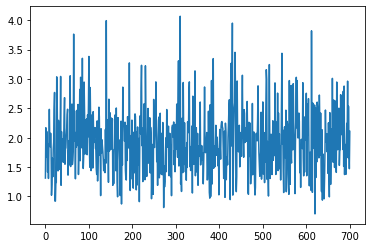

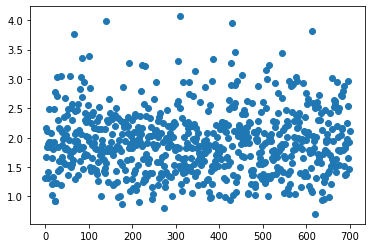

Iteration:  13%|█████████████▋                                                                                              | 800/6317 [17:01<2:17:36,  1.50s/it]

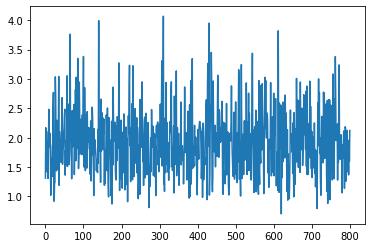

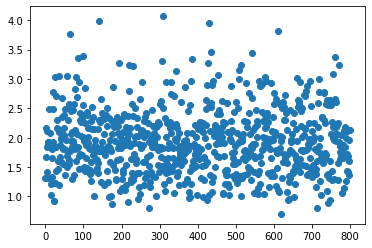

Iteration:  14%|███████████████▍                                                                                            | 900/6317 [19:12<2:17:15,  1.52s/it]

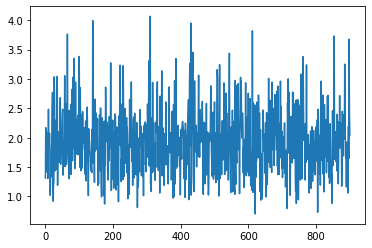

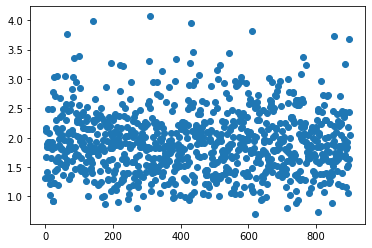

Iteration:  16%|████████████████▉                                                                                          | 1000/6317 [21:24<1:34:56,  1.07s/it]

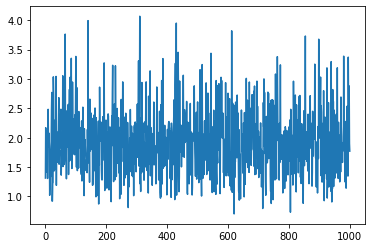

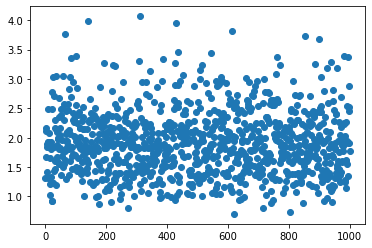

Iteration:  17%|██████████████████▋                                                                                        | 1100/6317 [23:34<1:45:39,  1.22s/it]

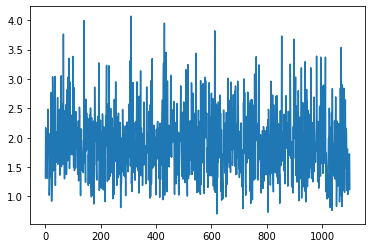

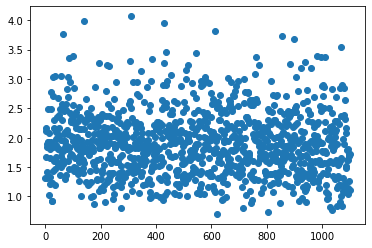

Iteration:  19%|████████████████████▎                                                                                      | 1200/6317 [25:39<1:33:01,  1.09s/it]

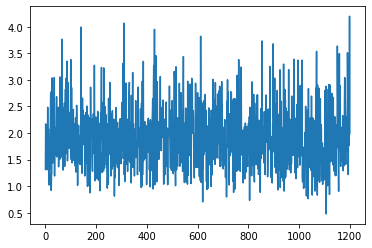

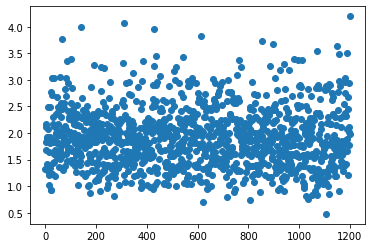

Iteration:  21%|██████████████████████                                                                                     | 1300/6317 [27:44<1:56:16,  1.39s/it]

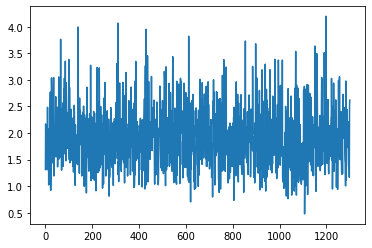

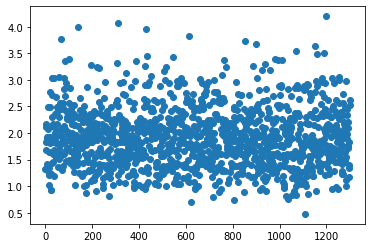

Iteration:  22%|███████████████████████▋                                                                                   | 1400/6317 [29:51<1:37:56,  1.20s/it]

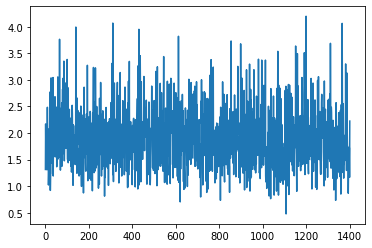

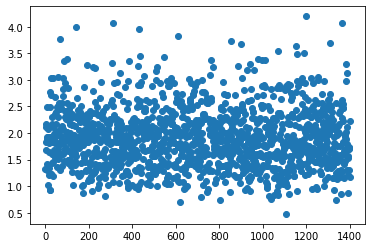

Iteration:  24%|█████████████████████████▍                                                                                 | 1500/6317 [32:03<1:35:55,  1.19s/it]

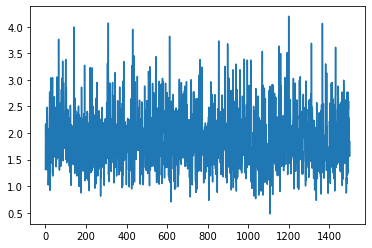

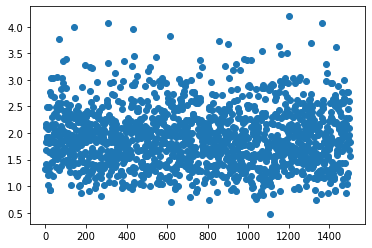

Iteration:  25%|███████████████████████████                                                                                | 1600/6317 [34:14<1:57:55,  1.50s/it]

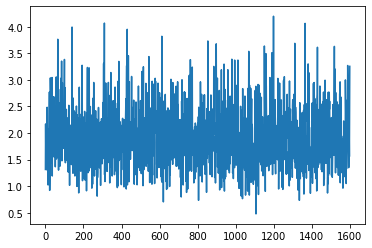

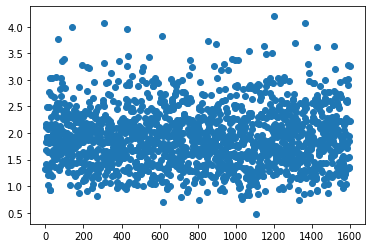

Iteration:  27%|████████████████████████████▊                                                                              | 1700/6317 [36:16<1:40:26,  1.31s/it]

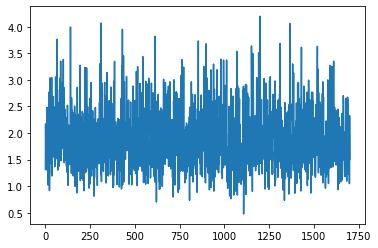

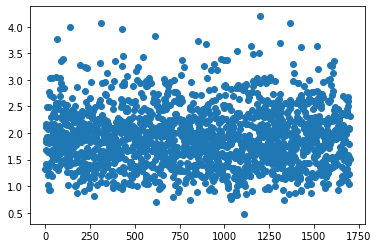

Iteration:  28%|██████████████████████████████▍                                                                            | 1800/6317 [38:34<1:50:56,  1.47s/it]

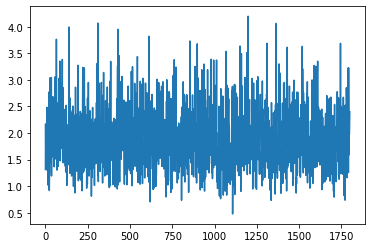

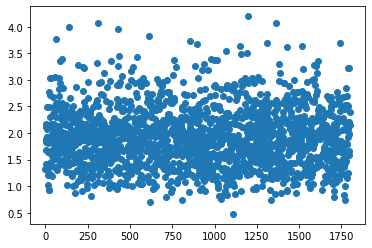

Iteration:  30%|████████████████████████████████▏                                                                          | 1900/6317 [40:43<1:43:19,  1.40s/it]

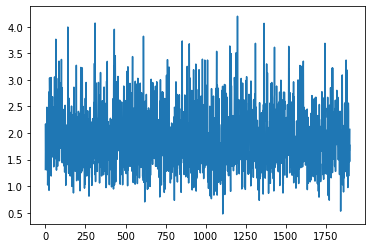

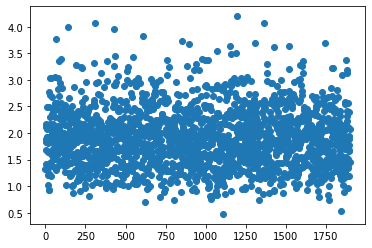

Iteration:  32%|█████████████████████████████████▉                                                                         | 2000/6317 [42:51<1:45:31,  1.47s/it]

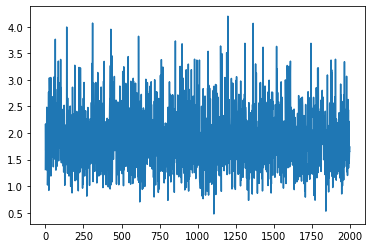

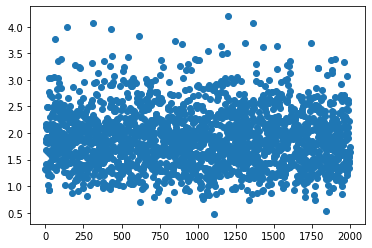

Iteration:  33%|███████████████████████████████████▌                                                                       | 2100/6317 [45:03<1:14:42,  1.06s/it]

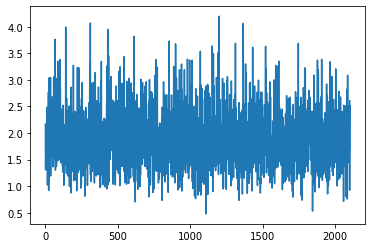

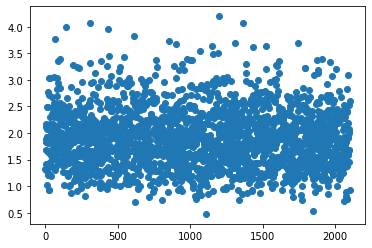

Iteration:  35%|█████████████████████████████████████▎                                                                     | 2200/6317 [47:09<1:53:12,  1.65s/it]

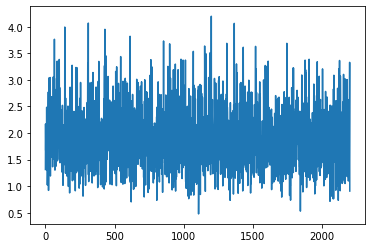

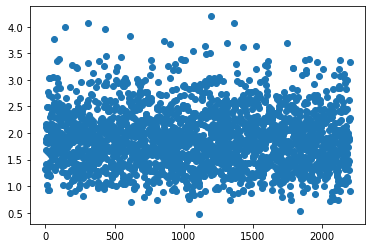

Iteration:  36%|██████████████████████████████████████▉                                                                    | 2300/6317 [49:16<1:38:57,  1.48s/it]

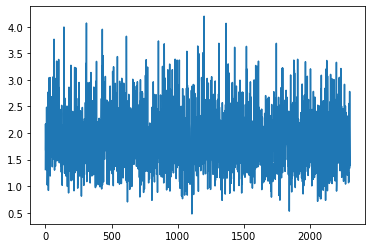

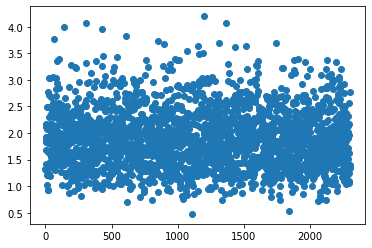

Iteration:  38%|████████████████████████████████████████▋                                                                  | 2400/6317 [51:30<1:34:23,  1.45s/it]

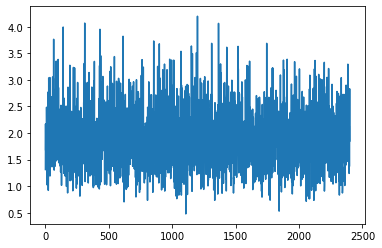

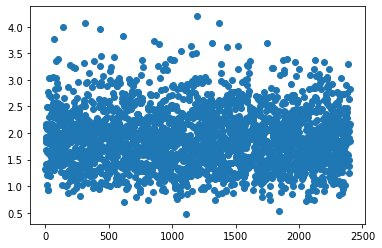

Iteration:  40%|██████████████████████████████████████████▎                                                                | 2500/6317 [53:33<1:32:41,  1.46s/it]

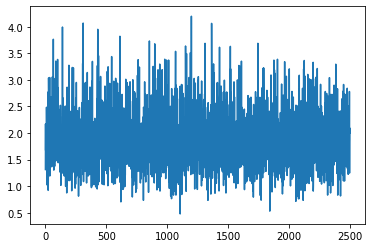

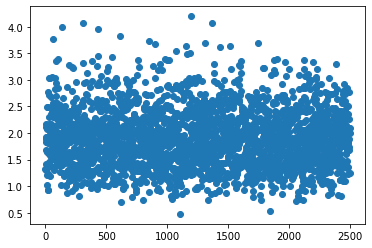

Iteration:  41%|████████████████████████████████████████████                                                               | 2600/6317 [55:50<1:32:30,  1.49s/it]

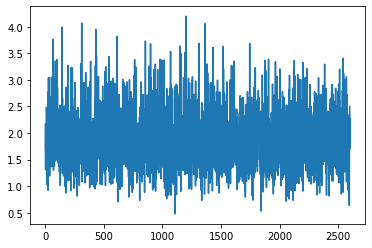

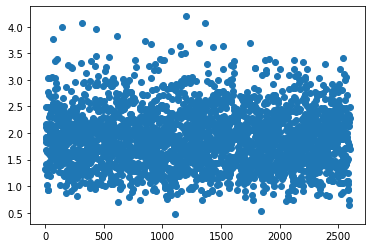

Iteration:  43%|█████████████████████████████████████████████▋                                                             | 2700/6317 [58:04<1:28:54,  1.47s/it]

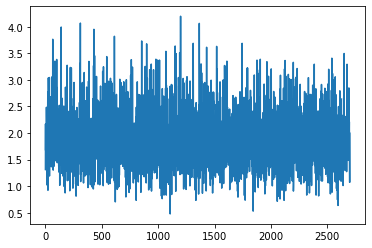

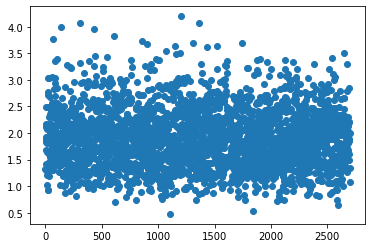

Iteration:  44%|██████████████████████████████████████████████▌                                                          | 2800/6317 [1:00:11<1:24:47,  1.45s/it]

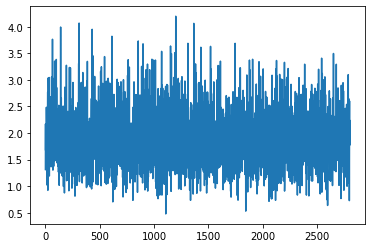

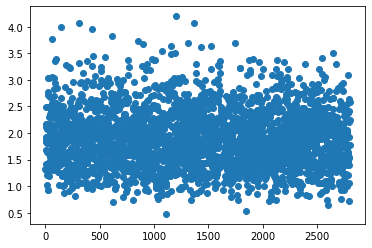

Iteration:  46%|████████████████████████████████████████████████▏                                                        | 2900/6317 [1:02:18<1:06:20,  1.17s/it]

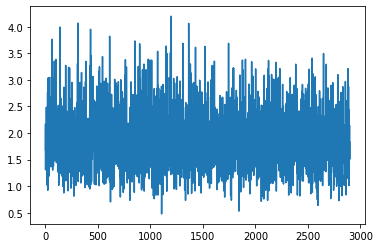

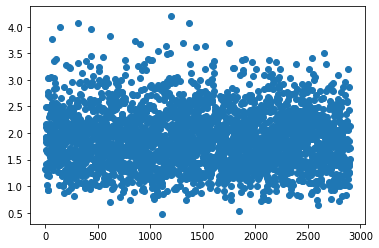

Iteration:  47%|█████████████████████████████████████████████████▊                                                       | 3000/6317 [1:04:22<1:04:53,  1.17s/it]

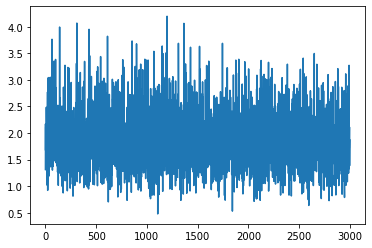

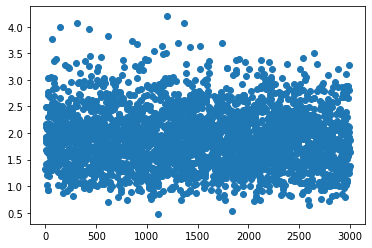

Iteration:  49%|███████████████████████████████████████████████████▌                                                     | 3100/6317 [1:06:26<1:19:47,  1.49s/it]

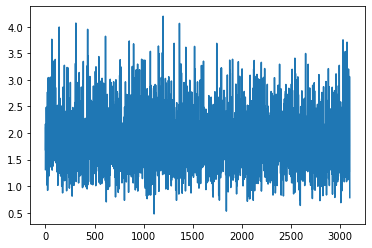

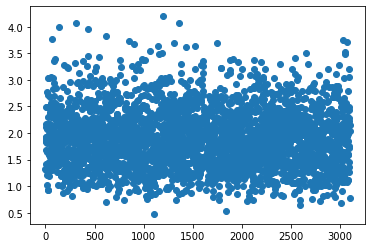

Iteration:  51%|██████████████████████████████████████████████████████▏                                                    | 3200/6317 [1:08:39<54:53,  1.06s/it]

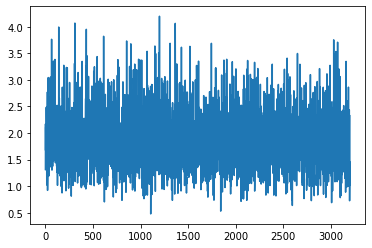

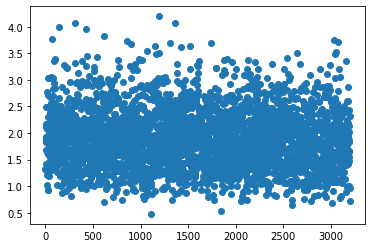

Iteration:  52%|██████████████████████████████████████████████████████▊                                                  | 3300/6317 [1:10:49<1:07:04,  1.33s/it]

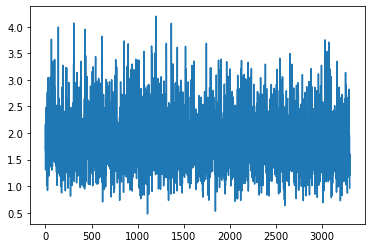

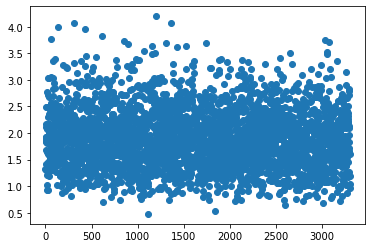

Iteration:  54%|█████████████████████████████████████████████████████████▌                                                 | 3400/6317 [1:12:57<53:14,  1.10s/it]

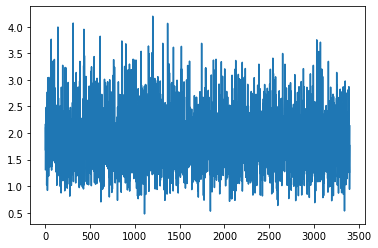

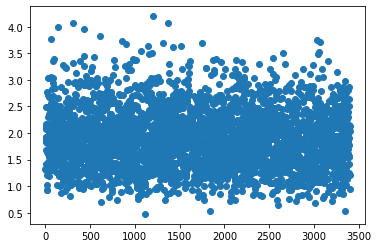

Iteration:  55%|██████████████████████████████████████████████████████████▏                                              | 3500/6317 [1:15:04<1:12:15,  1.54s/it]

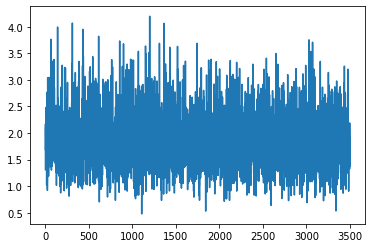

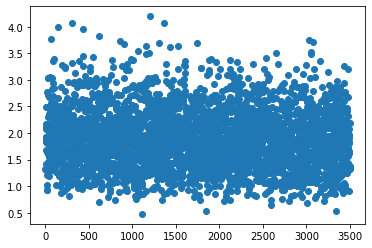

Iteration:  57%|███████████████████████████████████████████████████████████▊                                             | 3600/6317 [1:17:17<1:06:44,  1.47s/it]

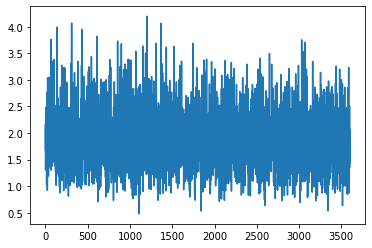

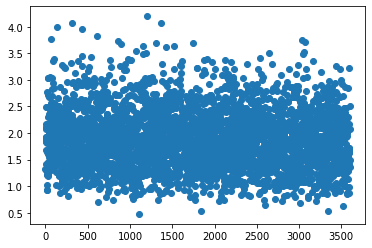

Iteration:  59%|██████████████████████████████████████████████████████████████▋                                            | 3700/6317 [1:19:18<48:35,  1.11s/it]

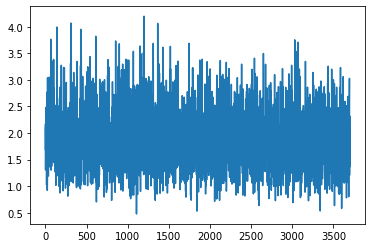

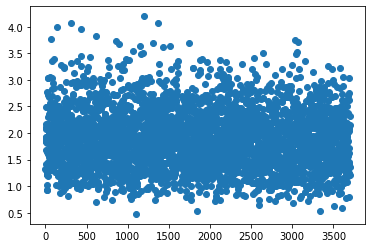

Iteration:  60%|████████████████████████████████████████████████████████████████▎                                          | 3800/6317 [1:21:29<44:15,  1.05s/it]

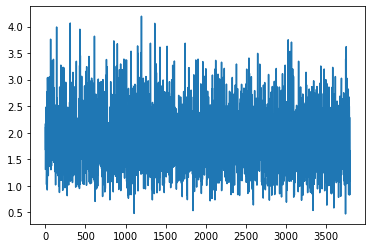

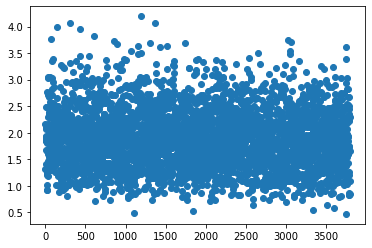

Iteration:  62%|██████████████████████████████████████████████████████████████████                                         | 3900/6317 [1:23:32<53:23,  1.33s/it]

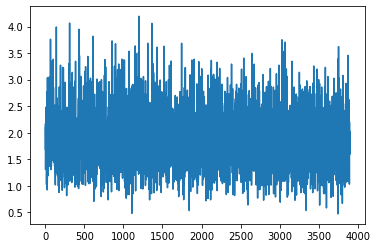

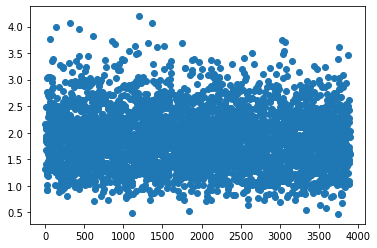

Iteration:  63%|███████████████████████████████████████████████████████████████████▊                                       | 4000/6317 [1:25:41<58:38,  1.52s/it]

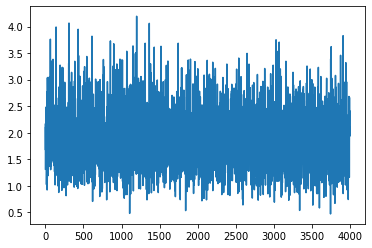

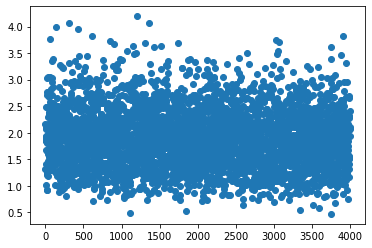

Iteration:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 4100/6317 [1:27:48<55:48,  1.51s/it]

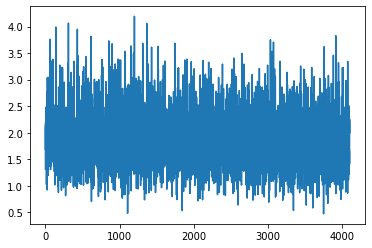

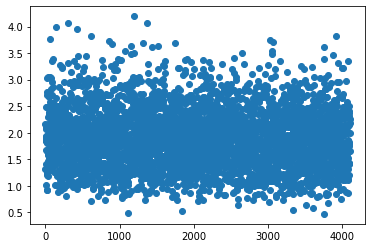

Iteration:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 4200/6317 [1:29:50<52:55,  1.50s/it]

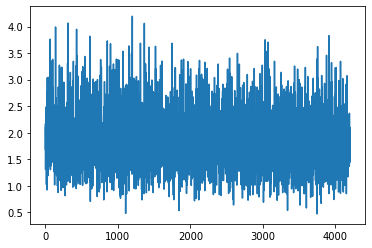

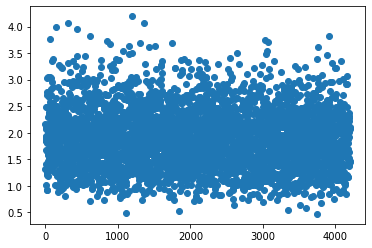

Iteration:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 4300/6317 [1:32:03<47:15,  1.41s/it]

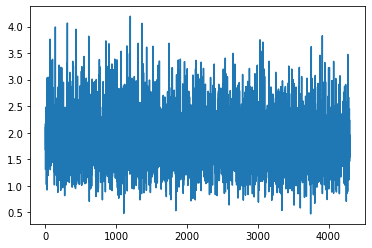

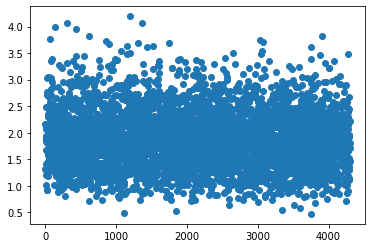

Iteration:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 4400/6317 [1:34:12<45:05,  1.41s/it]

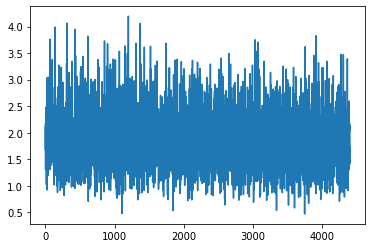

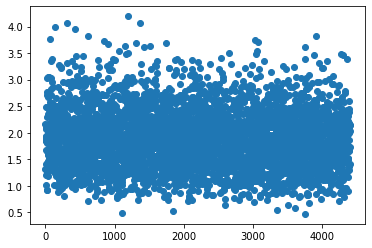

Iteration:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 4500/6317 [1:36:24<45:30,  1.50s/it]

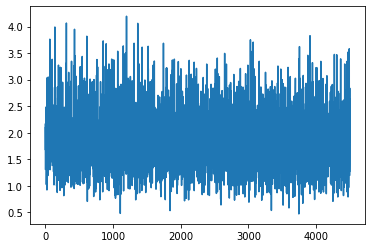

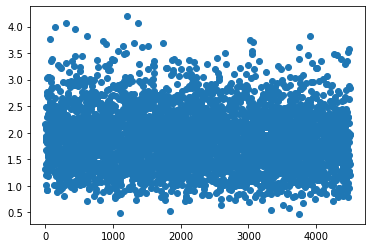

Iteration:  73%|█████████████████████████████████████████████████████████████████████████████▉                             | 4600/6317 [1:38:29<31:11,  1.09s/it]

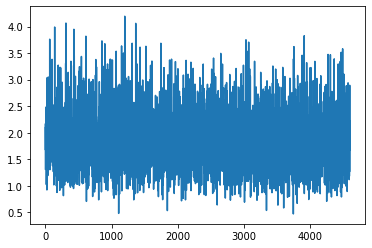

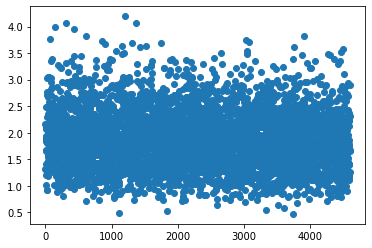

Iteration:  74%|███████████████████████████████████████████████████████████████████████████████▌                           | 4700/6317 [1:40:41<34:41,  1.29s/it]

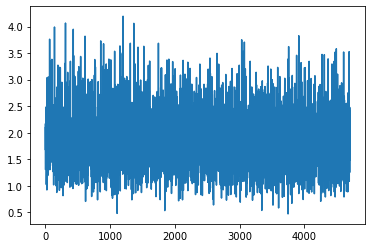

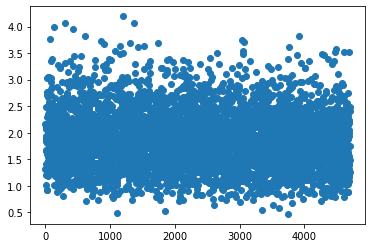

Iteration:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 4800/6317 [1:42:52<36:37,  1.45s/it]

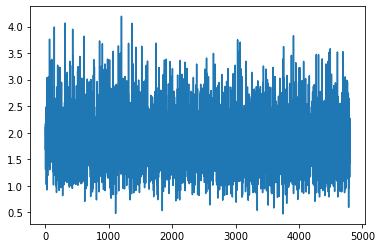

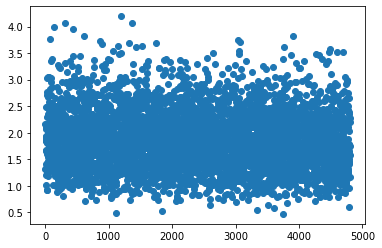

Iteration:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 4900/6317 [1:45:00<35:25,  1.50s/it]

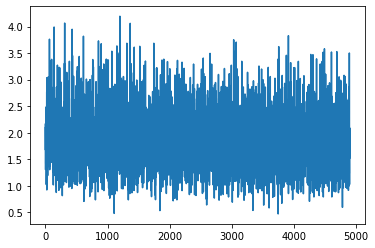

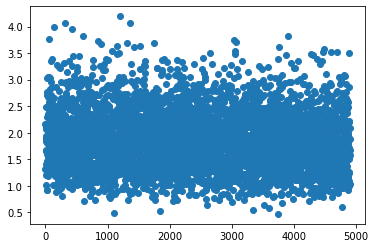

Iteration:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 5000/6317 [1:47:10<30:19,  1.38s/it]

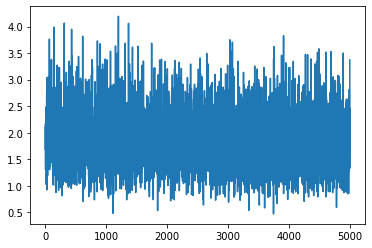

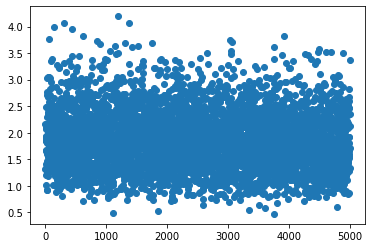

Iteration:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 5100/6317 [1:49:20<27:22,  1.35s/it]

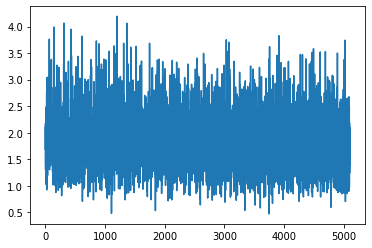

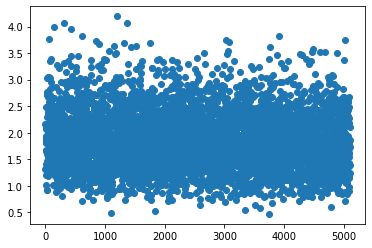

Iteration:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 5200/6317 [1:51:33<28:14,  1.52s/it]

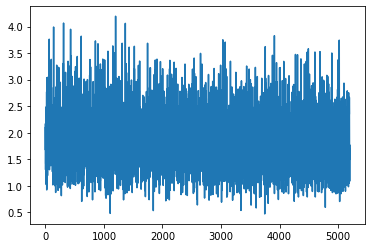

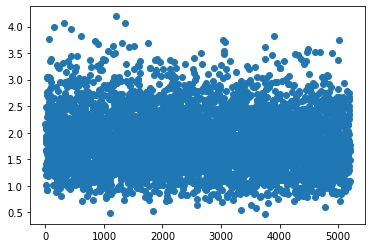

Iteration:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 5300/6317 [1:53:41<18:59,  1.12s/it]

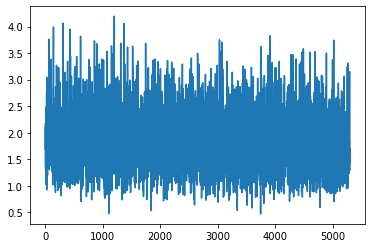

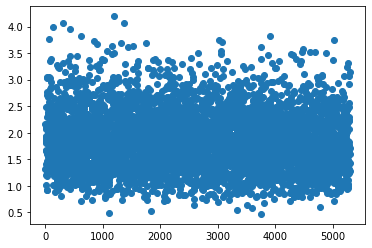

Iteration:  85%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 5400/6317 [1:55:49<17:33,  1.15s/it]

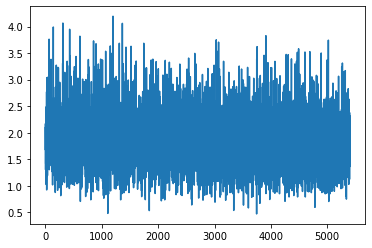

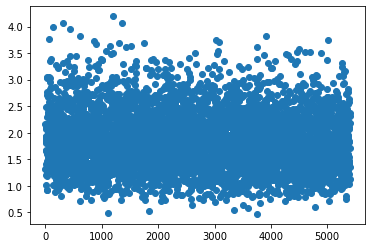

Iteration:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▏             | 5500/6317 [1:57:58<19:11,  1.41s/it]

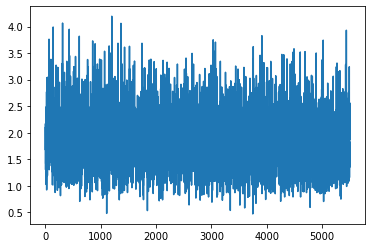

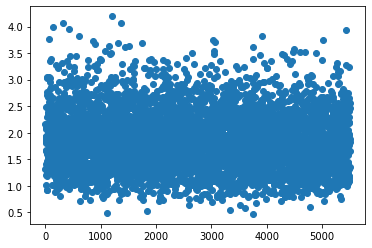

Iteration:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 5600/6317 [2:00:09<13:58,  1.17s/it]

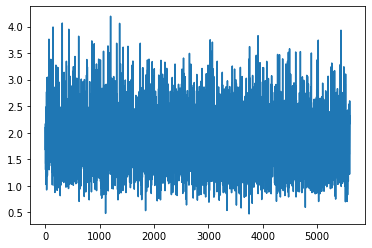

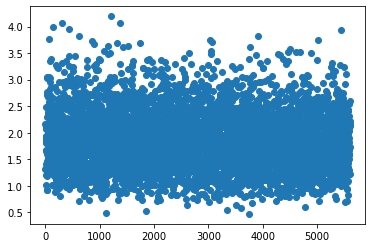

Iteration:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5700/6317 [2:02:12<15:25,  1.50s/it]

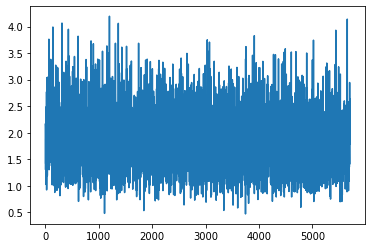

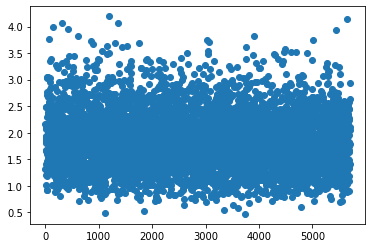

Iteration:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▏        | 5800/6317 [2:04:16<09:31,  1.11s/it]

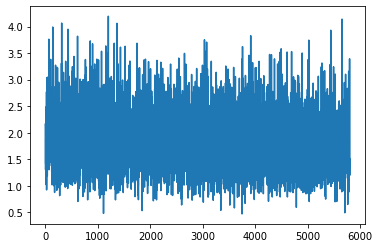

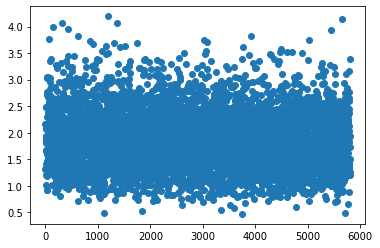

Iteration:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉       | 5900/6317 [2:06:28<08:46,  1.26s/it]

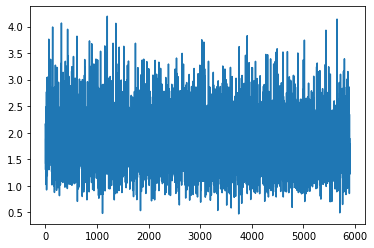

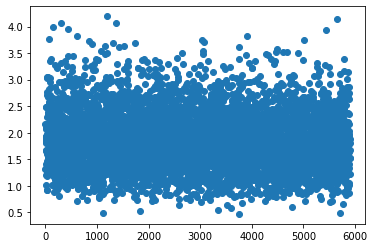

Iteration:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6000/6317 [2:08:33<07:09,  1.35s/it]

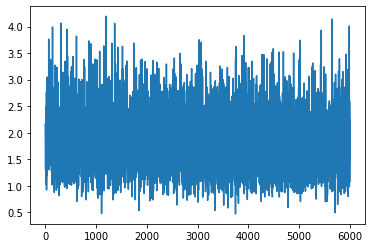

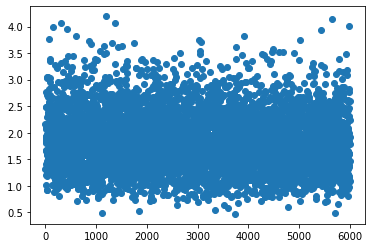

Iteration:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6100/6317 [2:10:42<05:20,  1.48s/it]

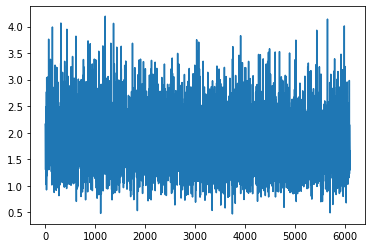

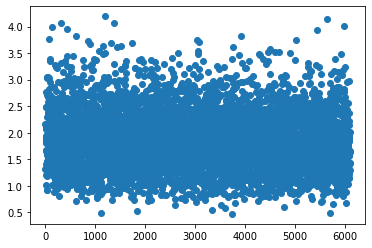

Iteration:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6200/6317 [2:12:48<02:50,  1.46s/it]

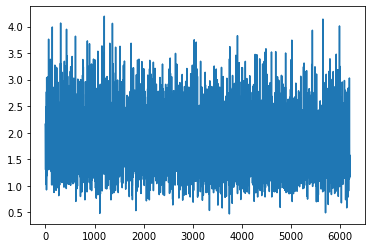

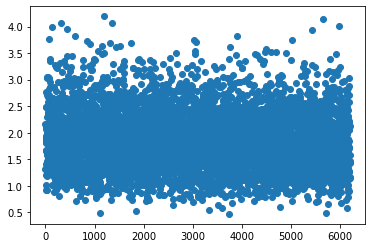

Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6300/6317 [2:14:59<00:20,  1.19s/it]

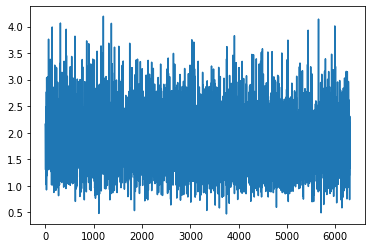

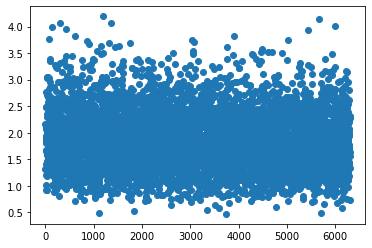

Iteration:   0%|                                                                                                                        | 0/6317 [00:00<?, ?it/s]

Epoch loss 11680.05253520608
Epoch 3 complete, saving probes
Training epoch: 4


Iteration:   2%|█▋                                                                                                          | 100/6317 [02:09<2:01:48,  1.18s/it]

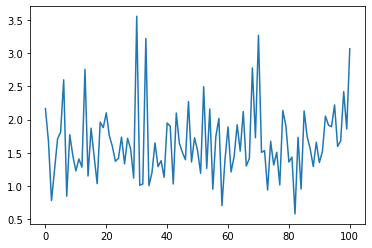

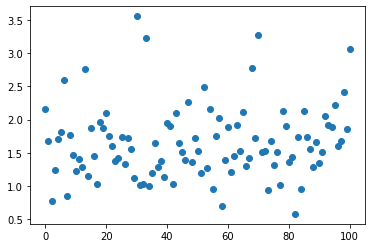

Iteration:   3%|███▍                                                                                                        | 200/6317 [04:12<1:51:35,  1.09s/it]

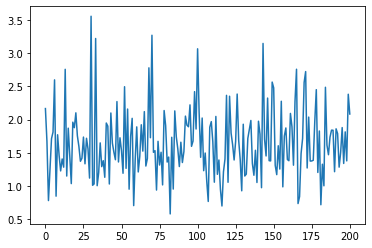

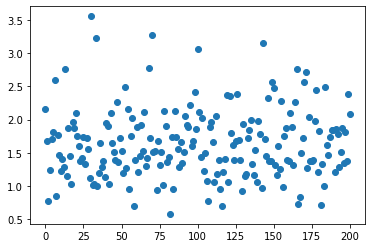

Iteration:   5%|█████▏                                                                                                      | 300/6317 [06:22<2:31:09,  1.51s/it]

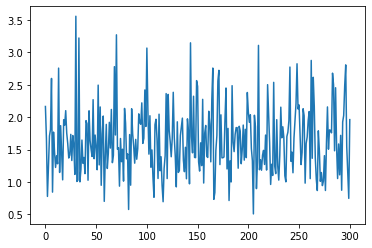

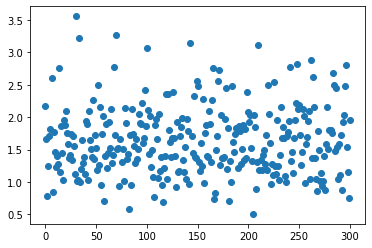

Iteration:   6%|██████▊                                                                                                     | 400/6317 [08:30<1:44:37,  1.06s/it]

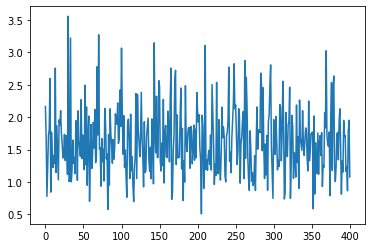

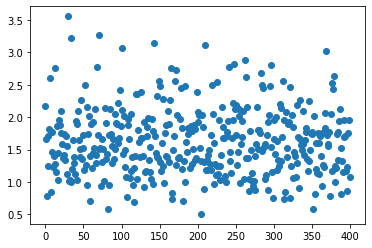

Iteration:   8%|████████▌                                                                                                   | 500/6317 [10:42<2:11:55,  1.36s/it]

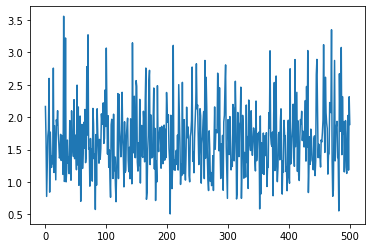

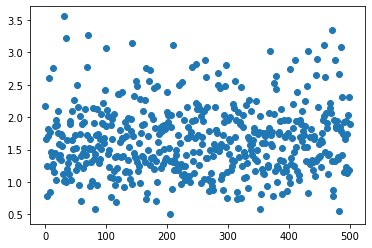

Iteration:   9%|██████████▎                                                                                                 | 600/6317 [12:57<2:17:10,  1.44s/it]

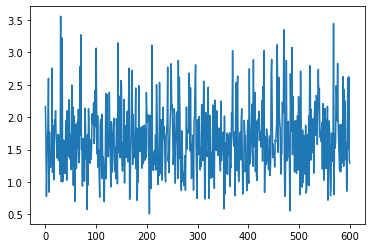

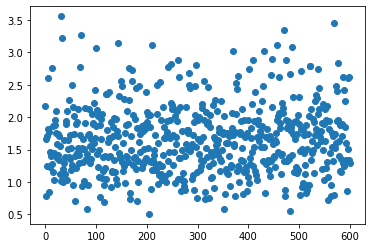

Iteration:  11%|███████████▉                                                                                                | 700/6317 [15:05<2:15:40,  1.45s/it]

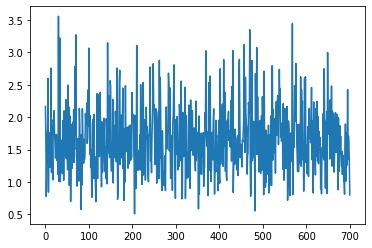

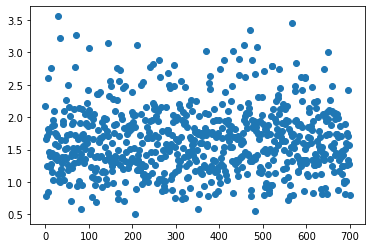

Iteration:  13%|█████████████▋                                                                                              | 800/6317 [17:15<2:18:34,  1.51s/it]

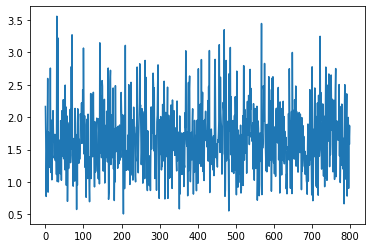

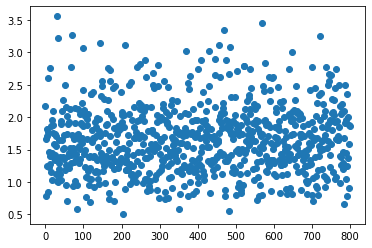

Iteration:  14%|███████████████▍                                                                                            | 900/6317 [19:30<2:14:29,  1.49s/it]

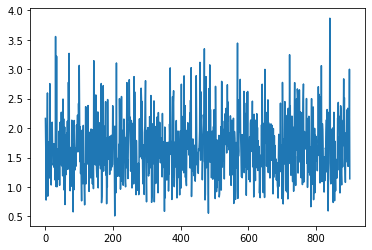

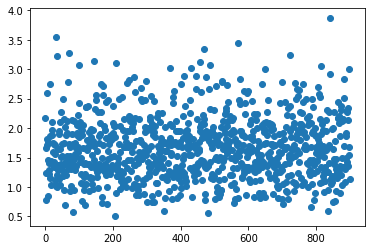

Iteration:  16%|████████████████▉                                                                                          | 1000/6317 [21:38<2:00:25,  1.36s/it]

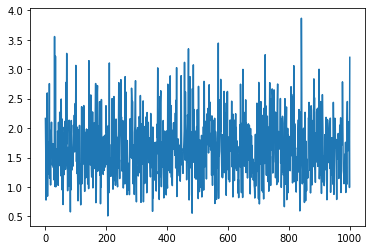

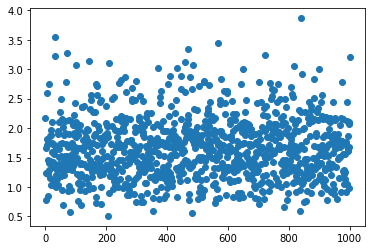

Iteration:  17%|██████████████████▋                                                                                        | 1100/6317 [23:41<1:35:03,  1.09s/it]

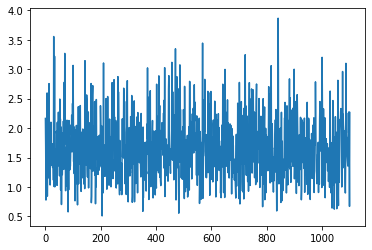

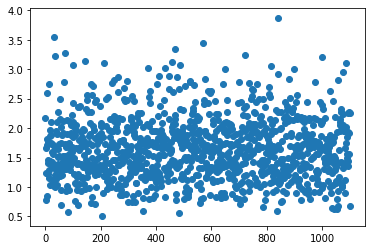

Iteration:  19%|████████████████████▎                                                                                      | 1200/6317 [25:55<2:07:40,  1.50s/it]

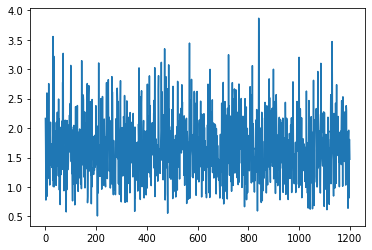

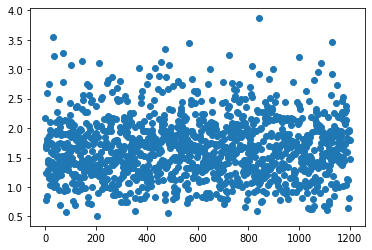

Iteration:  21%|██████████████████████                                                                                     | 1300/6317 [28:01<1:50:13,  1.32s/it]

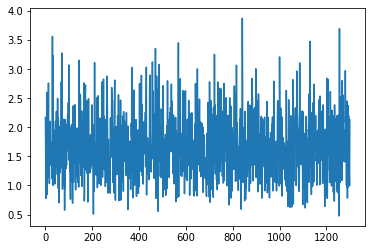

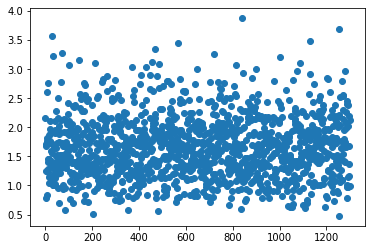

Iteration:  22%|███████████████████████▋                                                                                   | 1400/6317 [30:13<1:28:50,  1.08s/it]

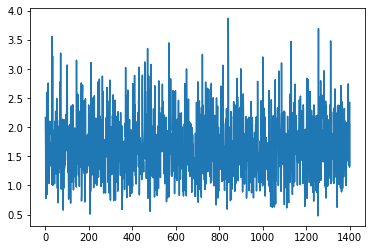

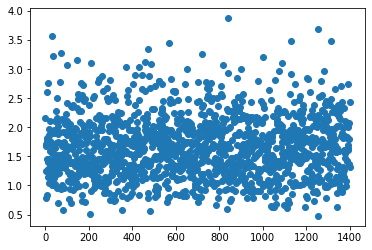

Iteration:  24%|█████████████████████████▍                                                                                 | 1500/6317 [32:22<1:39:13,  1.24s/it]

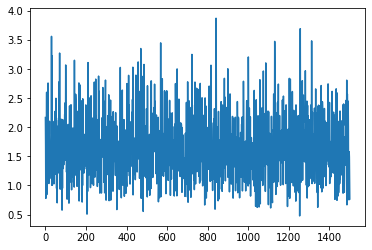

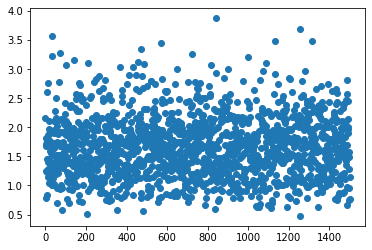

Iteration:  25%|███████████████████████████                                                                                | 1600/6317 [34:34<1:55:06,  1.46s/it]

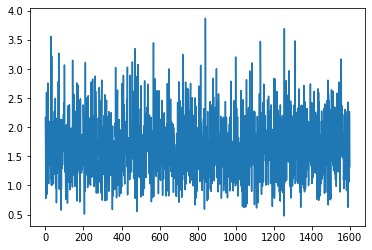

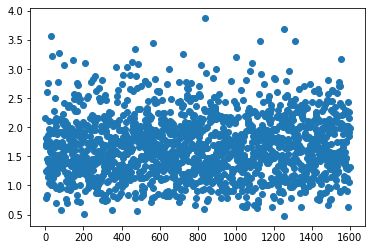

Iteration:  27%|████████████████████████████▊                                                                              | 1700/6317 [36:46<1:35:30,  1.24s/it]

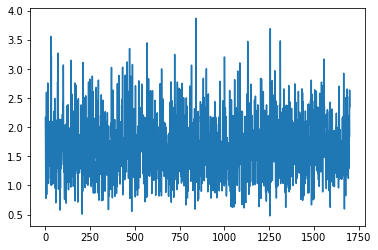

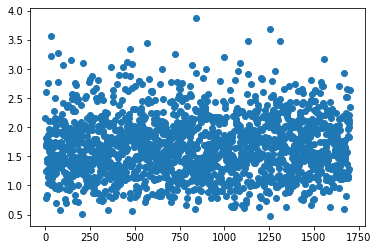

Iteration:  28%|██████████████████████████████▍                                                                            | 1800/6317 [38:51<1:19:44,  1.06s/it]

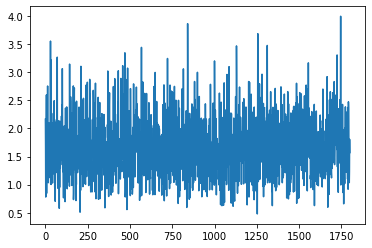

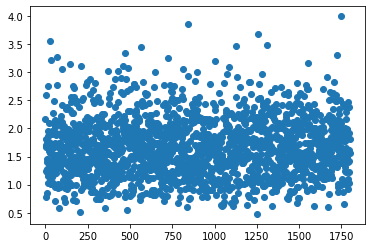

Iteration:  30%|████████████████████████████████▏                                                                          | 1900/6317 [40:58<1:35:07,  1.29s/it]

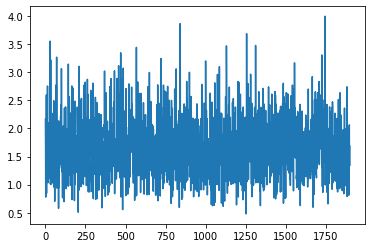

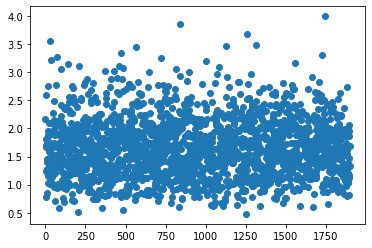

Iteration:  32%|█████████████████████████████████▉                                                                         | 2000/6317 [43:02<1:18:47,  1.09s/it]

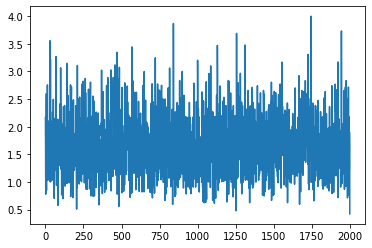

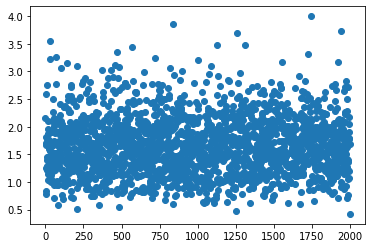

Iteration:  33%|███████████████████████████████████▌                                                                       | 2100/6317 [45:12<1:46:33,  1.52s/it]

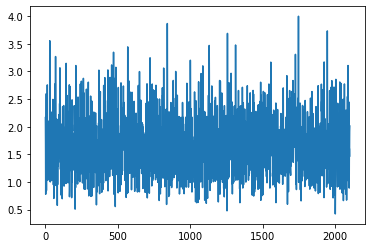

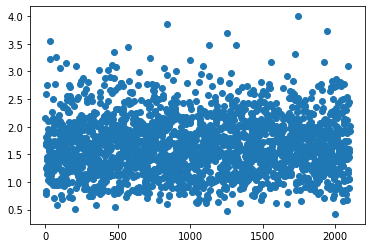

Iteration:  35%|█████████████████████████████████████▎                                                                     | 2200/6317 [47:16<1:44:21,  1.52s/it]

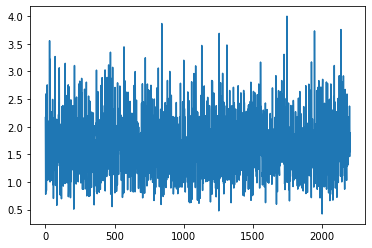

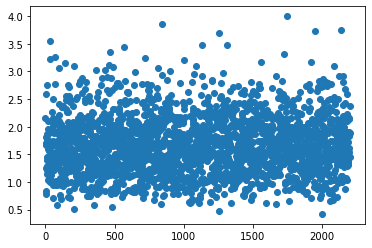

Iteration:  36%|██████████████████████████████████████▉                                                                    | 2300/6317 [49:26<1:41:21,  1.51s/it]

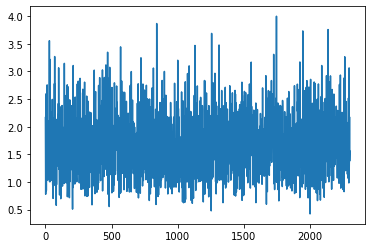

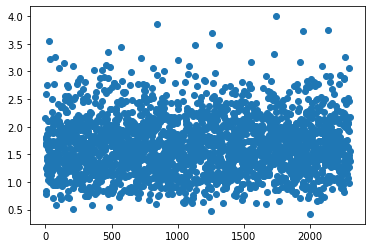

Iteration:  38%|████████████████████████████████████████▋                                                                  | 2400/6317 [51:41<1:08:17,  1.05s/it]

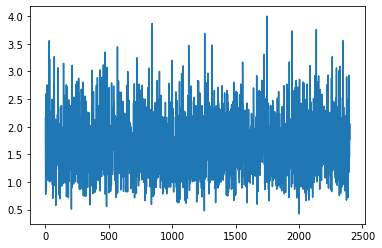

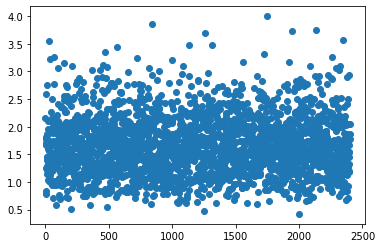

Iteration:  40%|██████████████████████████████████████████▎                                                                | 2500/6317 [53:47<1:29:04,  1.40s/it]

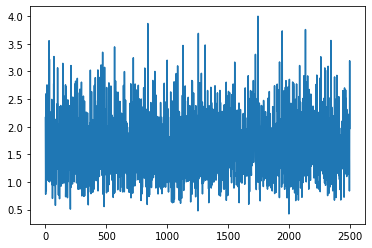

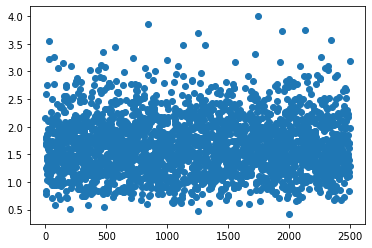

Iteration:  41%|████████████████████████████████████████████                                                               | 2600/6317 [55:57<1:26:34,  1.40s/it]

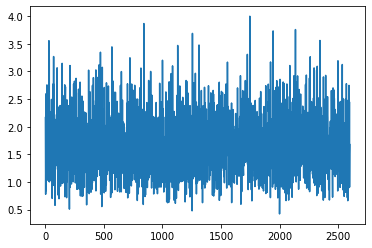

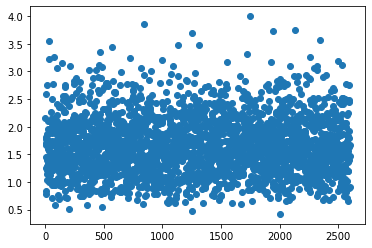

Iteration:  43%|█████████████████████████████████████████████▋                                                             | 2700/6317 [58:03<1:27:13,  1.45s/it]

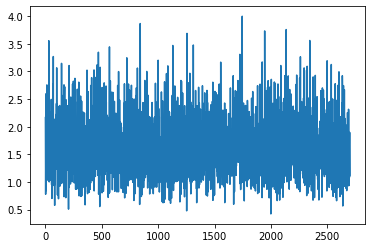

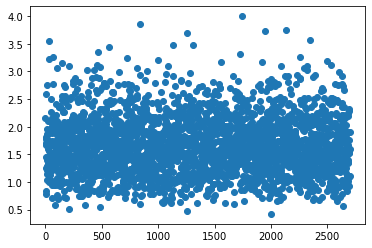

Iteration:  44%|██████████████████████████████████████████████▌                                                          | 2800/6317 [1:00:09<1:29:23,  1.53s/it]

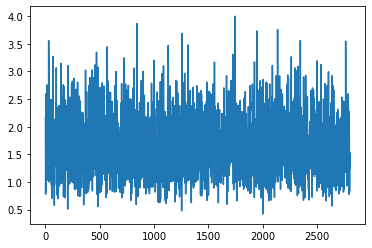

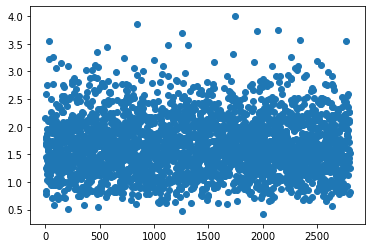

Iteration:  46%|████████████████████████████████████████████████▏                                                        | 2900/6317 [1:02:14<1:20:55,  1.42s/it]

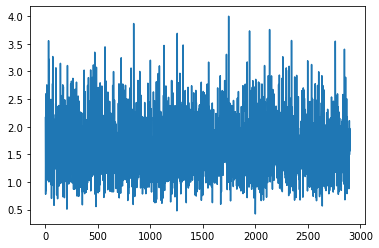

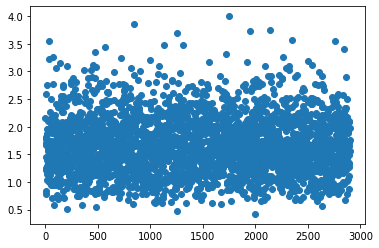

Iteration:  47%|█████████████████████████████████████████████████▊                                                       | 3000/6317 [1:04:21<1:13:10,  1.32s/it]

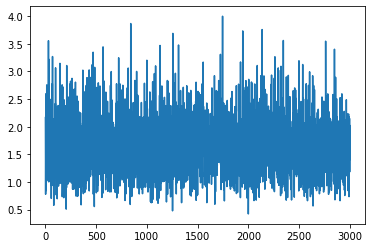

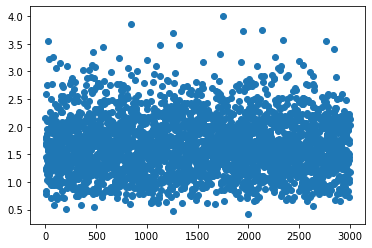

Iteration:  49%|███████████████████████████████████████████████████▌                                                     | 3100/6317 [1:06:33<1:07:31,  1.26s/it]

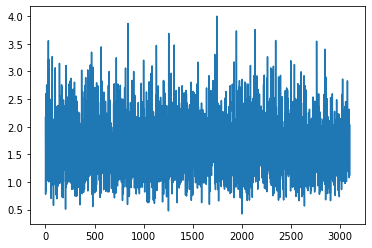

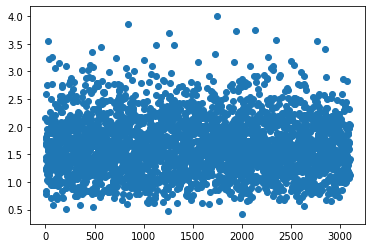

Iteration:  51%|█████████████████████████████████████████████████████▏                                                   | 3200/6317 [1:08:41<1:00:35,  1.17s/it]

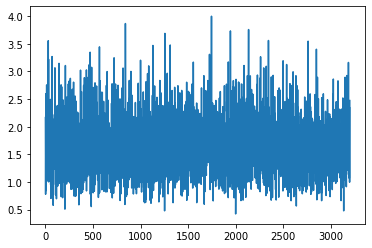

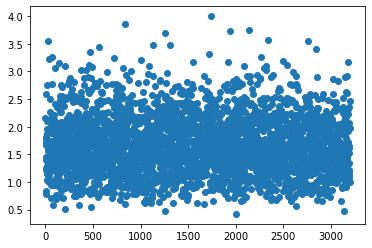

Iteration:  52%|██████████████████████████████████████████████████████▊                                                  | 3300/6317 [1:10:49<1:10:04,  1.39s/it]

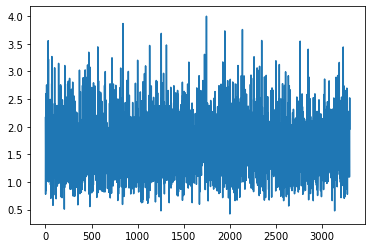

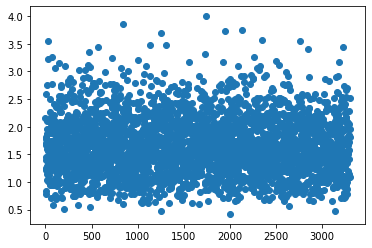

Iteration:  54%|████████████████████████████████████████████████████████▌                                                | 3400/6317 [1:12:53<1:10:28,  1.45s/it]

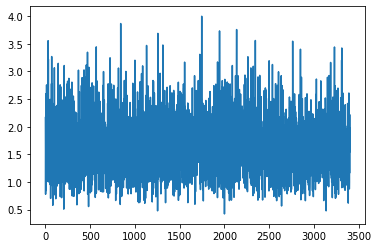

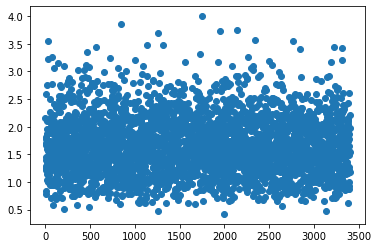

Iteration:  55%|██████████████████████████████████████████████████████████▏                                              | 3500/6317 [1:14:57<1:03:18,  1.35s/it]

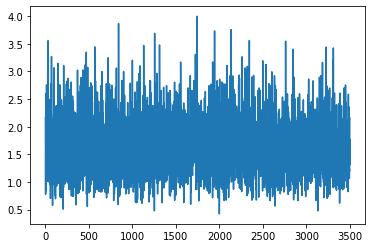

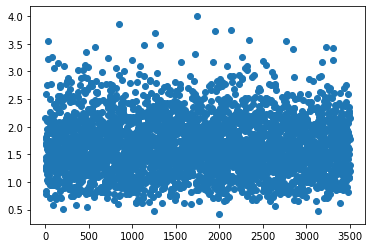

Iteration:  57%|████████████████████████████████████████████████████████████▉                                              | 3600/6317 [1:17:11<53:25,  1.18s/it]

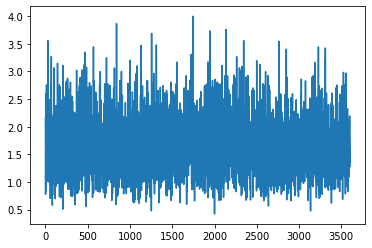

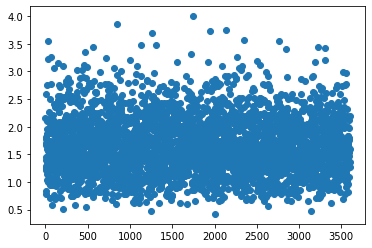

Iteration:  59%|█████████████████████████████████████████████████████████████▌                                           | 3700/6317 [1:19:25<1:03:21,  1.45s/it]

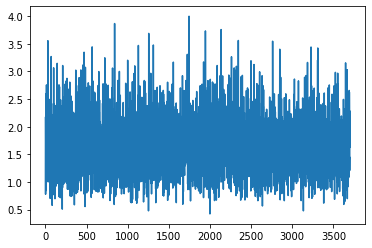

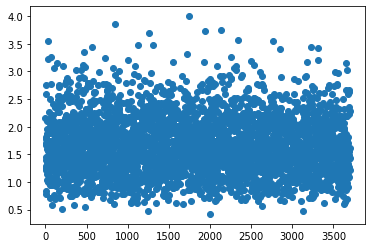

Iteration:  60%|████████████████████████████████████████████████████████████████▎                                          | 3800/6317 [1:21:34<54:35,  1.30s/it]

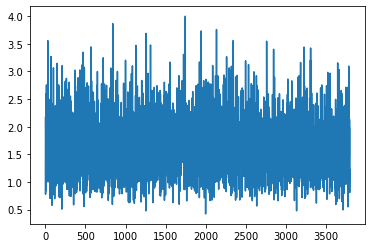

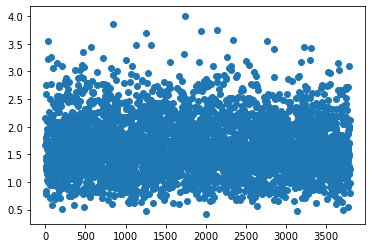

Iteration:  62%|████████████████████████████████████████████████████████████████▊                                        | 3900/6317 [1:23:44<1:00:58,  1.51s/it]

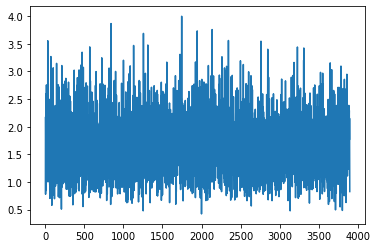

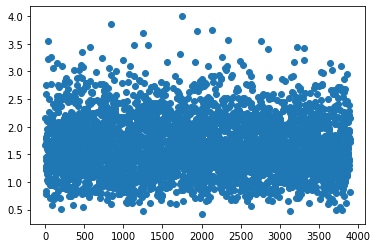

Iteration:  63%|███████████████████████████████████████████████████████████████████▊                                       | 4000/6317 [1:25:53<54:50,  1.42s/it]

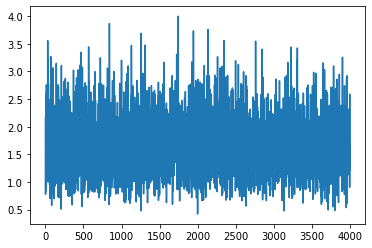

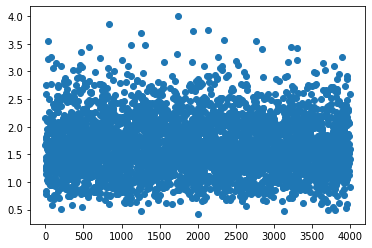

Iteration:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 4100/6317 [1:28:00<46:21,  1.25s/it]

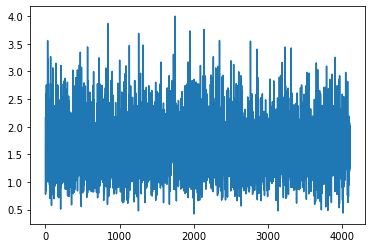

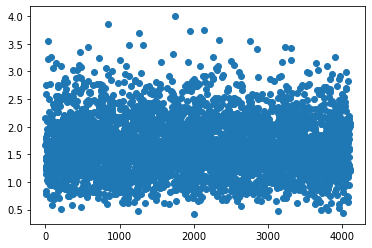

Iteration:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 4200/6317 [1:30:12<48:12,  1.37s/it]

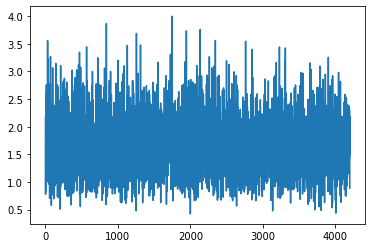

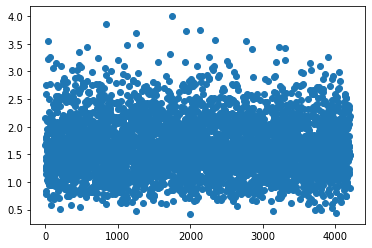

Iteration:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 4300/6317 [1:32:21<49:05,  1.46s/it]

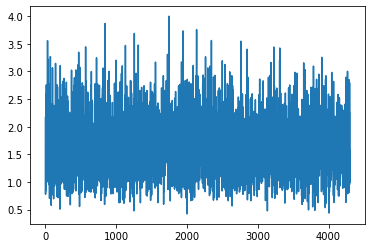

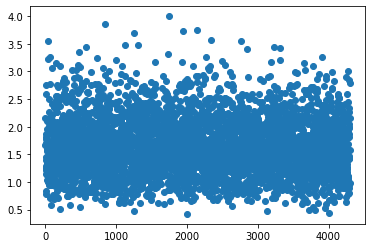

Iteration:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 4400/6317 [1:34:24<41:12,  1.29s/it]

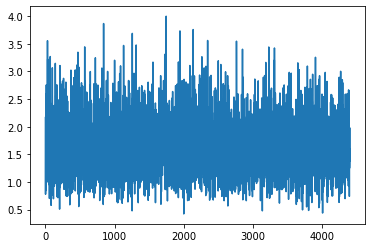

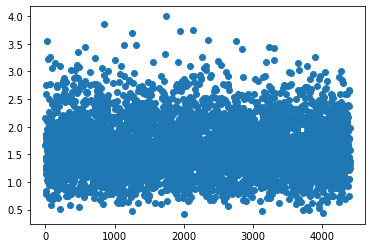

Iteration:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 4500/6317 [1:36:32<39:10,  1.29s/it]

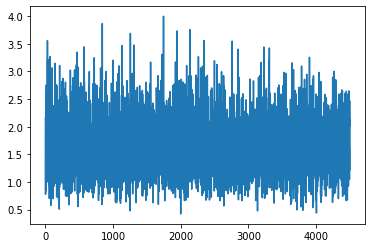

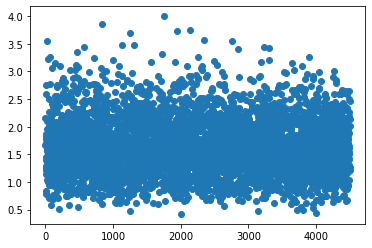

Iteration:  73%|█████████████████████████████████████████████████████████████████████████████▉                             | 4600/6317 [1:38:42<37:15,  1.30s/it]

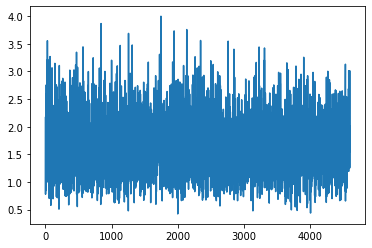

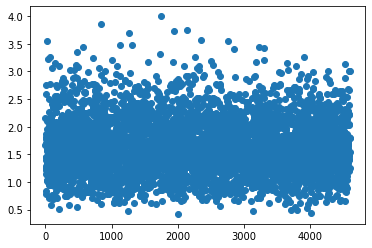

Iteration:  74%|███████████████████████████████████████████████████████████████████████████████▌                           | 4700/6317 [1:40:53<37:38,  1.40s/it]

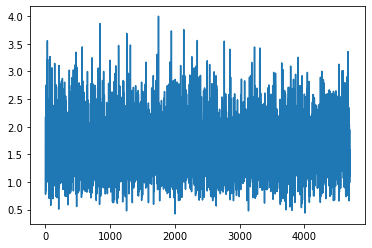

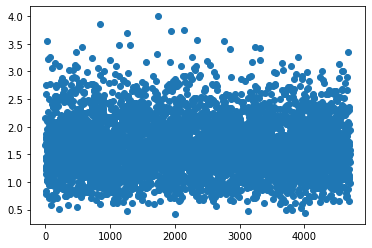

Iteration:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 4800/6317 [1:43:04<29:39,  1.17s/it]

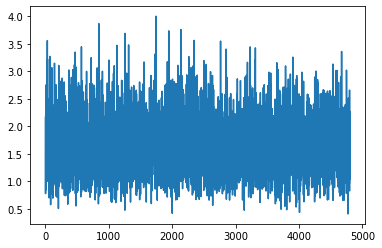

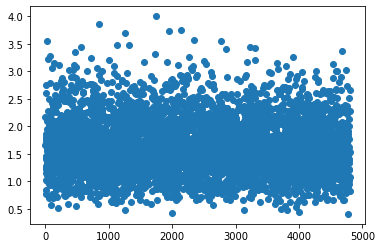

Iteration:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 4900/6317 [1:45:11<32:39,  1.38s/it]

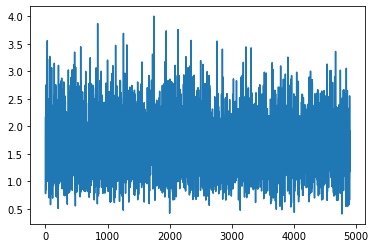

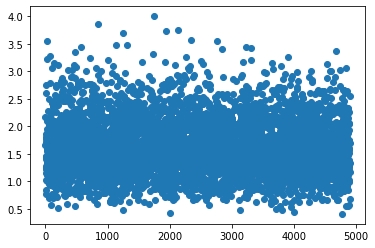

Iteration:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 5000/6317 [1:47:19<33:09,  1.51s/it]

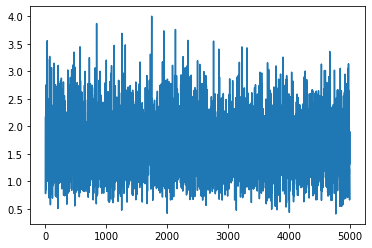

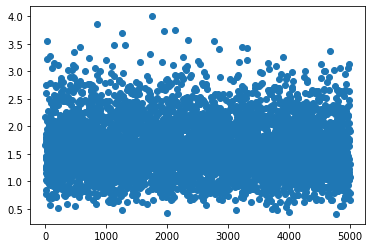

Iteration:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 5100/6317 [1:49:32<26:39,  1.31s/it]

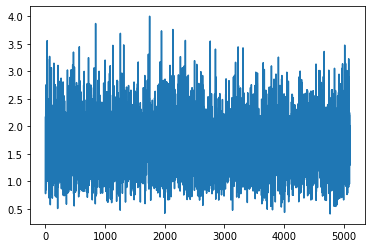

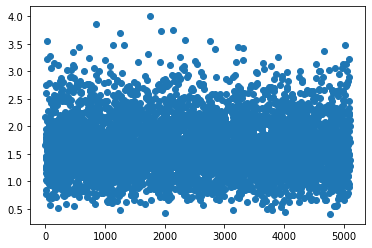

Iteration:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 5200/6317 [1:51:34<24:20,  1.31s/it]

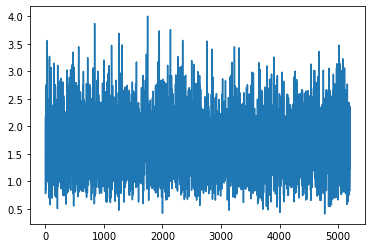

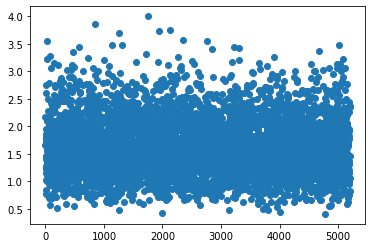

Iteration:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 5300/6317 [1:53:48<19:43,  1.16s/it]

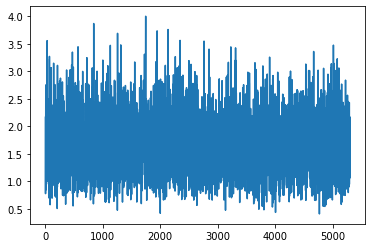

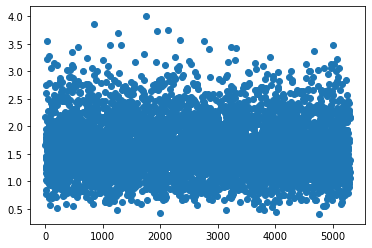

Iteration:  85%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 5400/6317 [1:55:51<16:54,  1.11s/it]

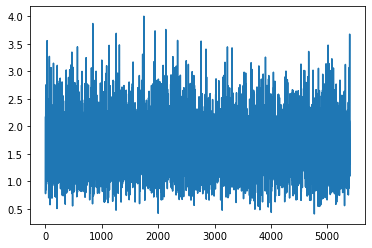

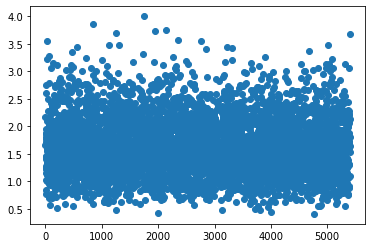

Iteration:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▏             | 5500/6317 [1:58:05<20:12,  1.48s/it]

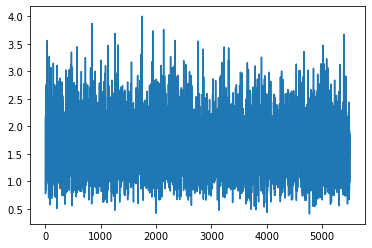

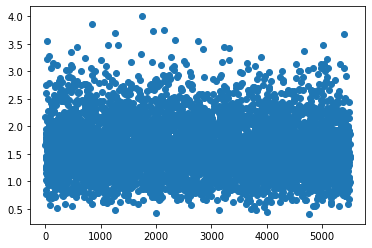

Iteration:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 5600/6317 [2:00:11<16:29,  1.38s/it]

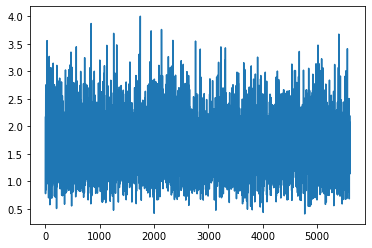

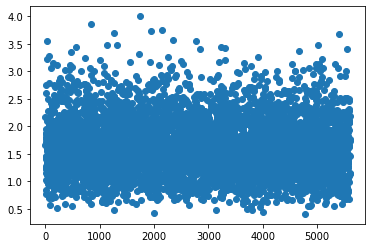

Iteration:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5700/6317 [2:02:24<11:18,  1.10s/it]

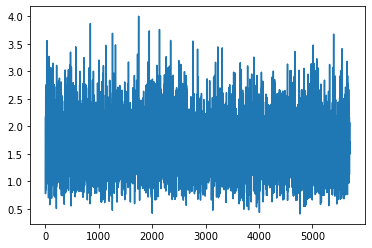

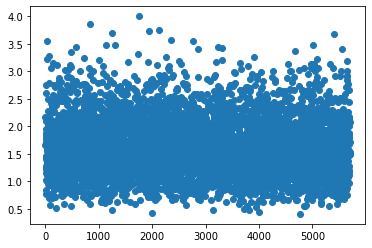

Iteration:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▏        | 5800/6317 [2:04:30<09:20,  1.08s/it]

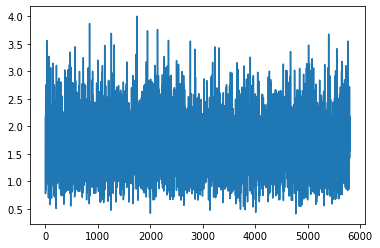

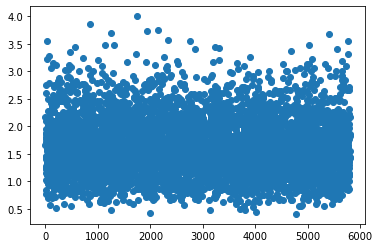

Iteration:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉       | 5900/6317 [2:06:43<07:22,  1.06s/it]

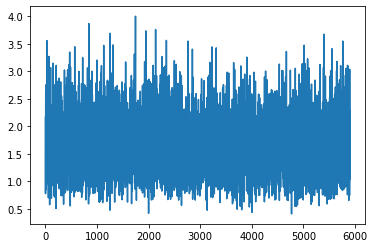

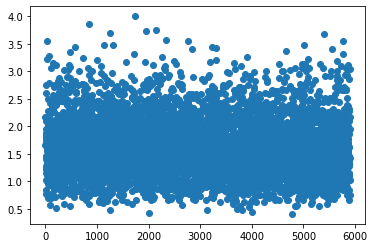

Iteration:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6000/6317 [2:08:50<05:58,  1.13s/it]

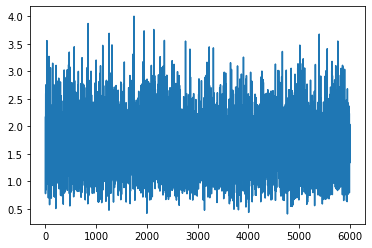

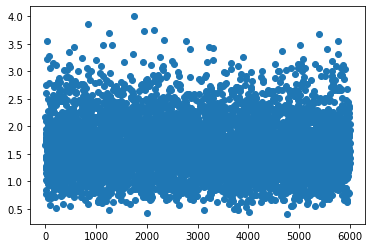

Iteration:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6100/6317 [2:10:56<05:08,  1.42s/it]

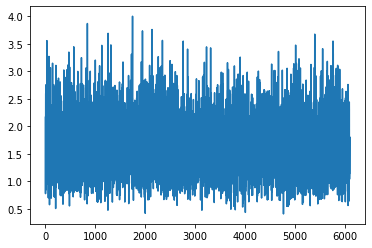

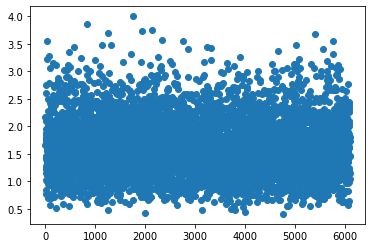

Iteration:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6200/6317 [2:13:03<02:54,  1.50s/it]

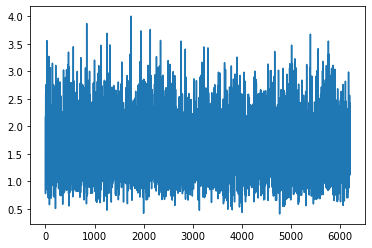

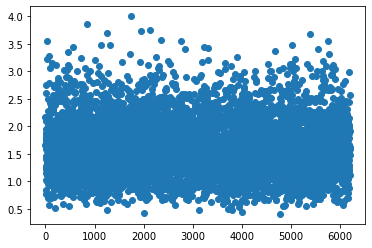

Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6300/6317 [2:15:14<00:20,  1.19s/it]

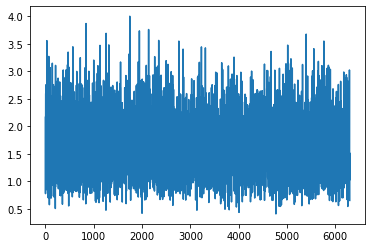

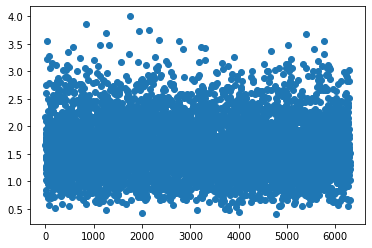

Iteration:   0%|                                                                                                                        | 0/6317 [00:00<?, ?it/s]

Epoch loss 10336.657815724611
Epoch 4 complete, saving probes
Training epoch: 5


Iteration:   2%|█▋                                                                                                          | 100/6317 [02:08<1:49:54,  1.06s/it]

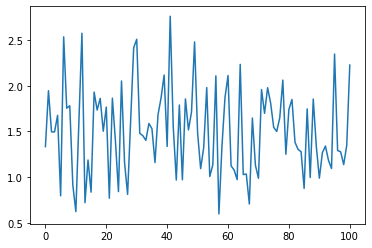

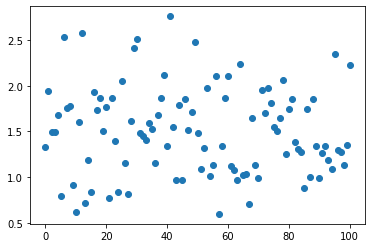

Iteration:   3%|███▍                                                                                                        | 200/6317 [04:15<2:14:04,  1.32s/it]

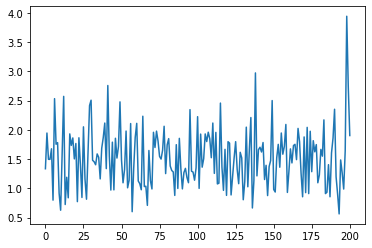

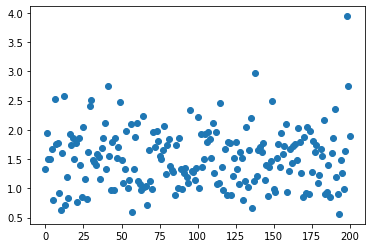

Iteration:   5%|█████▏                                                                                                      | 300/6317 [06:20<2:23:41,  1.43s/it]

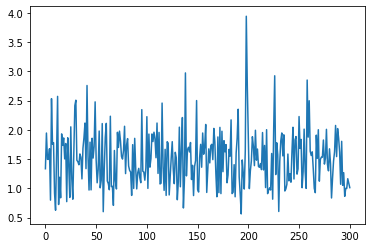

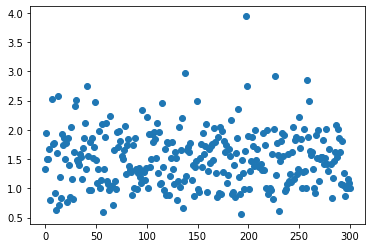

Iteration:   6%|██████▊                                                                                                     | 400/6317 [08:23<1:44:12,  1.06s/it]

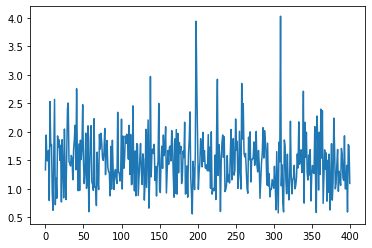

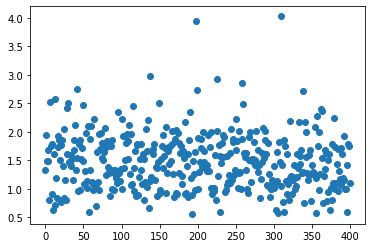

Iteration:   8%|████████▌                                                                                                   | 500/6317 [10:26<2:07:27,  1.31s/it]

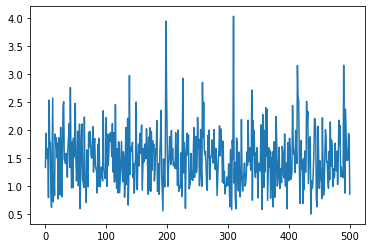

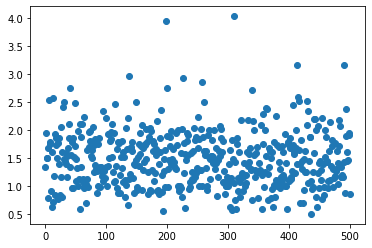

Iteration:   9%|██████████▎                                                                                                 | 600/6317 [12:27<2:08:35,  1.35s/it]

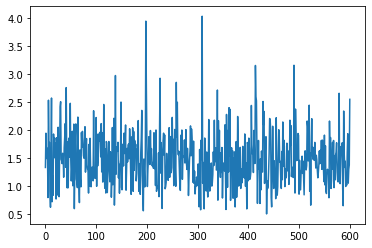

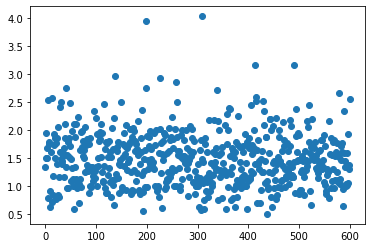

Iteration:  11%|███████████▉                                                                                                | 700/6317 [14:22<1:48:20,  1.16s/it]

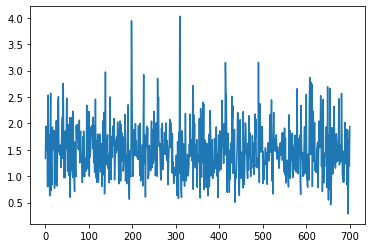

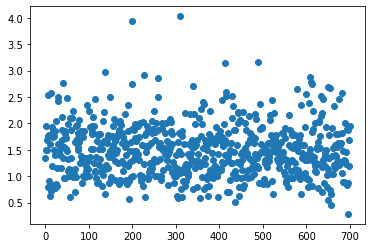

Iteration:  13%|█████████████▋                                                                                              | 800/6317 [16:18<1:42:11,  1.11s/it]

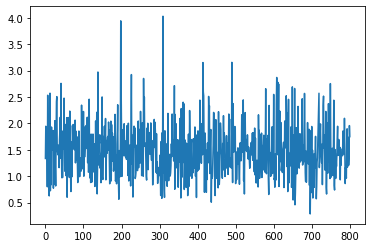

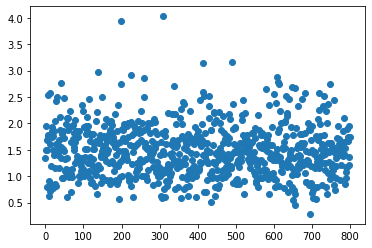

Iteration:  14%|███████████████▍                                                                                            | 900/6317 [18:21<1:48:23,  1.20s/it]

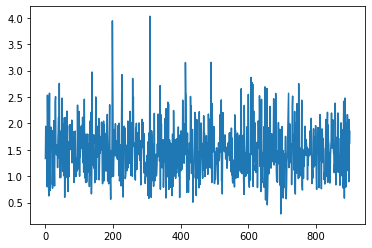

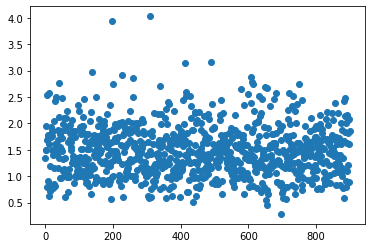

Iteration:  16%|████████████████▉                                                                                          | 1000/6317 [20:30<1:47:29,  1.21s/it]

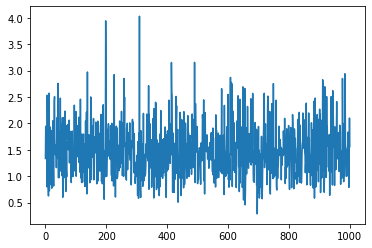

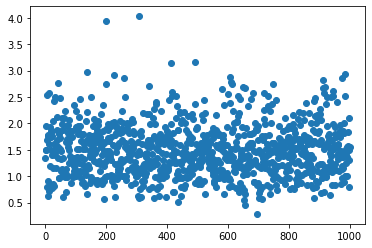

Iteration:  17%|██████████████████▋                                                                                        | 1100/6317 [22:37<2:12:35,  1.52s/it]

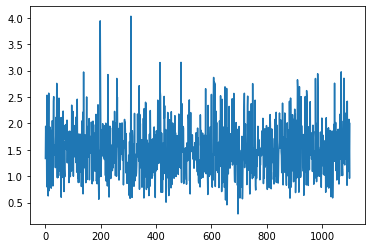

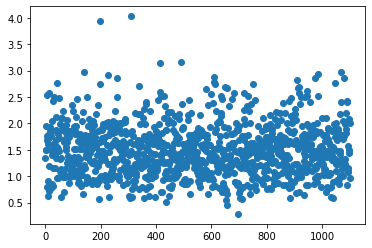

Iteration:  19%|████████████████████▎                                                                                      | 1200/6317 [24:40<1:31:59,  1.08s/it]

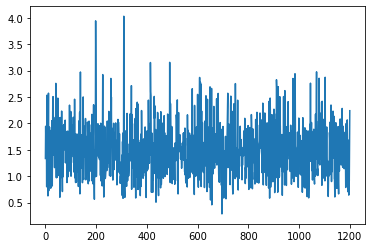

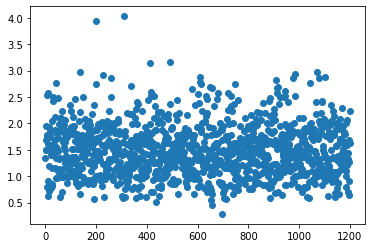

Iteration:  21%|██████████████████████                                                                                     | 1300/6317 [26:53<1:34:21,  1.13s/it]

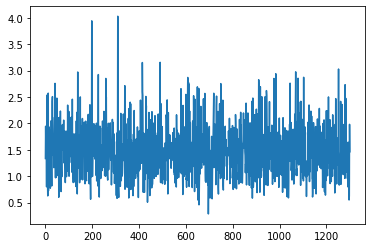

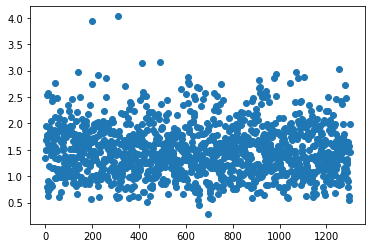

Iteration:  22%|███████████████████████▋                                                                                   | 1400/6317 [29:04<1:34:04,  1.15s/it]

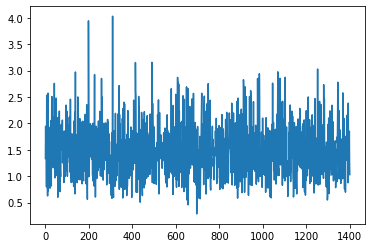

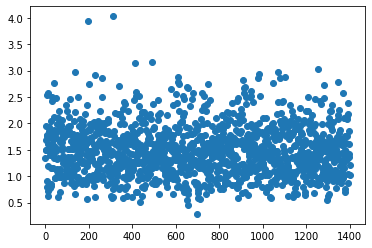

Iteration:  24%|█████████████████████████▍                                                                                 | 1500/6317 [31:08<1:48:09,  1.35s/it]

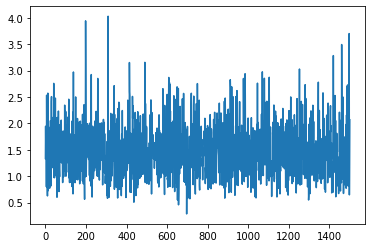

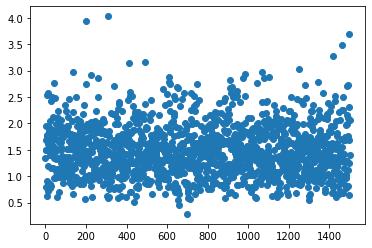

Iteration:  25%|███████████████████████████                                                                                | 1600/6317 [33:21<1:55:23,  1.47s/it]

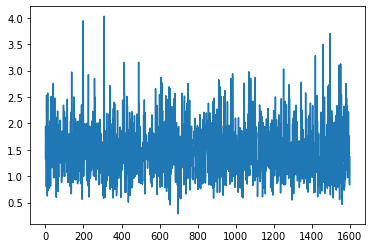

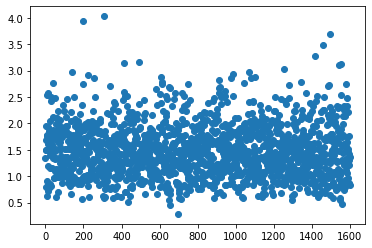

Iteration:  27%|████████████████████████████▊                                                                              | 1700/6317 [35:33<1:55:30,  1.50s/it]

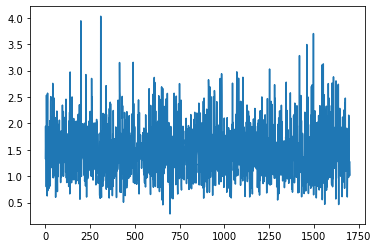

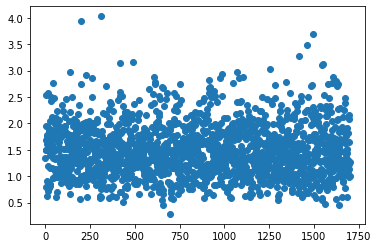

Iteration:  28%|██████████████████████████████▍                                                                            | 1800/6317 [37:45<1:26:12,  1.15s/it]

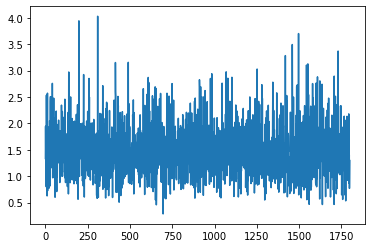

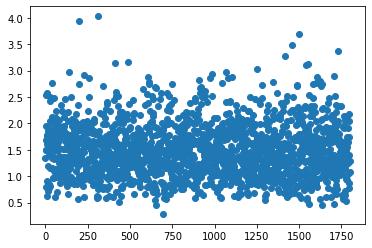

Iteration:  30%|████████████████████████████████▏                                                                          | 1900/6317 [39:45<1:20:24,  1.09s/it]

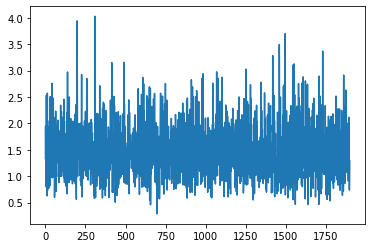

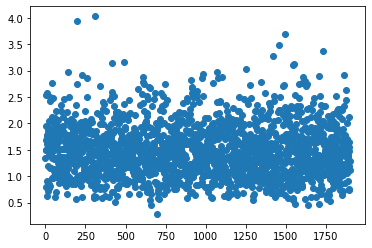

Iteration:  32%|█████████████████████████████████▉                                                                         | 2000/6317 [41:55<1:22:42,  1.15s/it]

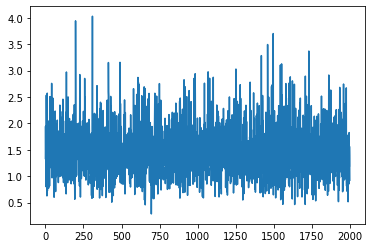

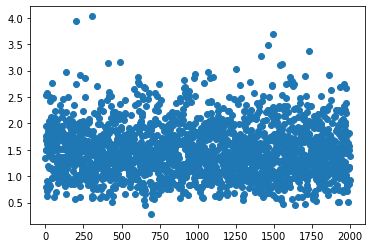

Iteration:  33%|███████████████████████████████████▌                                                                       | 2100/6317 [44:02<1:35:55,  1.36s/it]

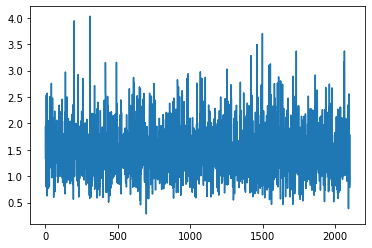

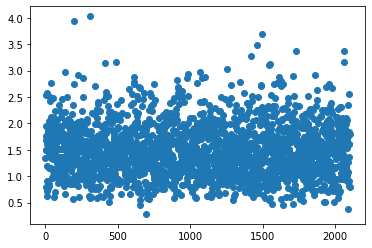

Iteration:  35%|█████████████████████████████████████▎                                                                     | 2200/6317 [46:17<1:29:20,  1.30s/it]

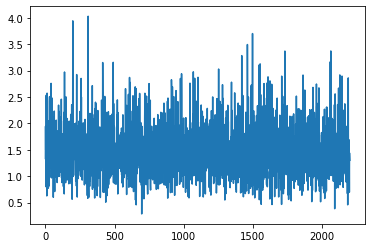

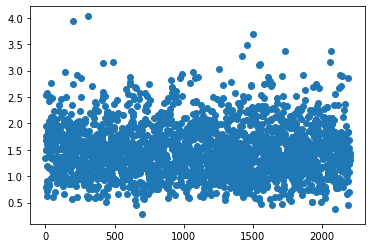

Iteration:  36%|██████████████████████████████████████▉                                                                    | 2300/6317 [48:24<1:27:29,  1.31s/it]

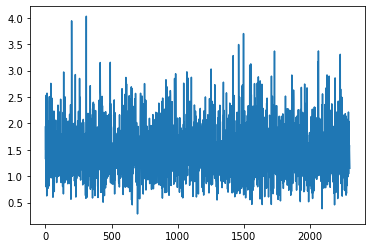

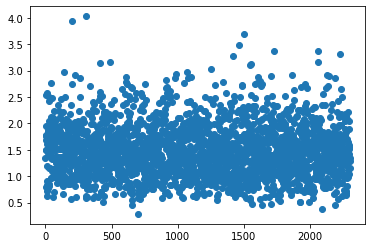

Iteration:  38%|████████████████████████████████████████▋                                                                  | 2400/6317 [50:29<1:37:32,  1.49s/it]

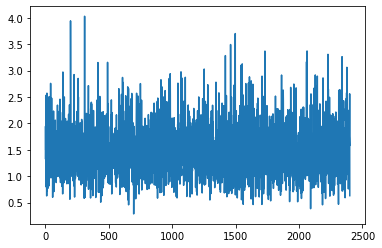

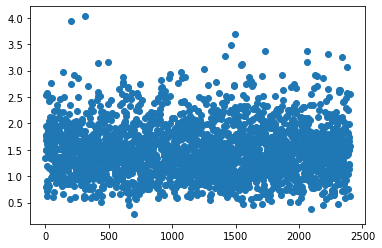

Iteration:  40%|██████████████████████████████████████████▎                                                                | 2500/6317 [52:34<1:11:55,  1.13s/it]

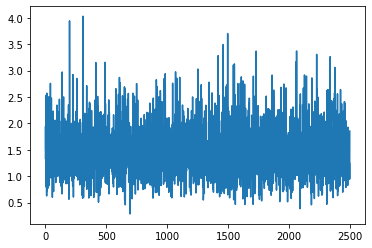

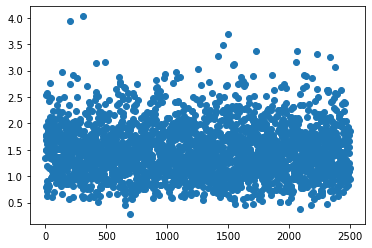

Iteration:  41%|████████████████████████████████████████████                                                               | 2600/6317 [54:40<1:34:58,  1.53s/it]

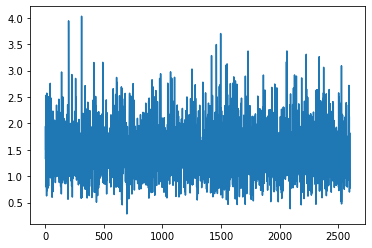

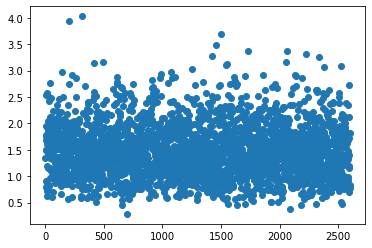

Iteration:  43%|█████████████████████████████████████████████▋                                                             | 2700/6317 [56:46<1:31:34,  1.52s/it]

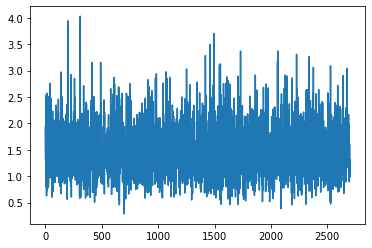

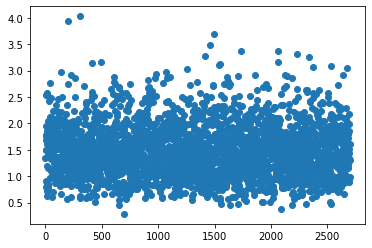

Iteration:  44%|███████████████████████████████████████████████▍                                                           | 2800/6317 [58:55<1:24:52,  1.45s/it]

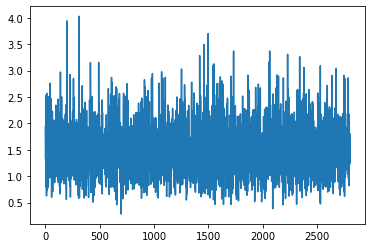

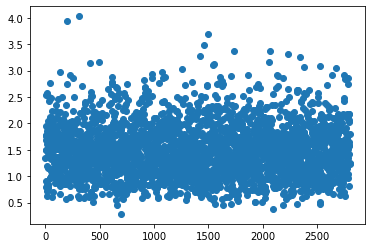

Iteration:  46%|████████████████████████████████████████████████▏                                                        | 2900/6317 [1:01:06<1:16:09,  1.34s/it]

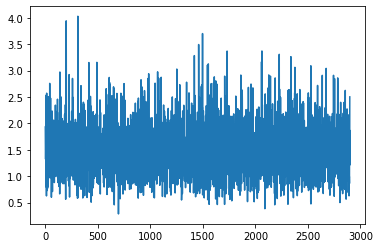

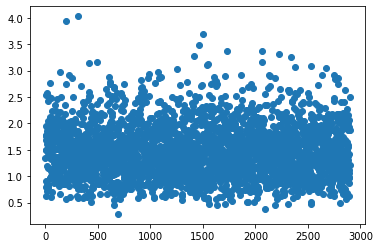

Iteration:  47%|█████████████████████████████████████████████████▊                                                       | 3000/6317 [1:03:17<1:23:28,  1.51s/it]

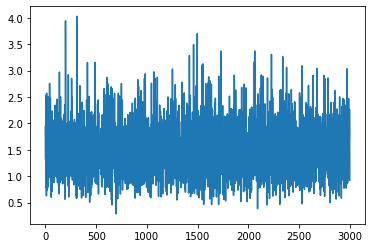

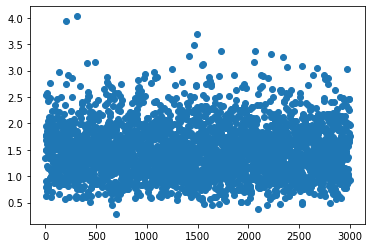

Iteration:  49%|███████████████████████████████████████████████████▌                                                     | 3100/6317 [1:05:20<1:11:06,  1.33s/it]

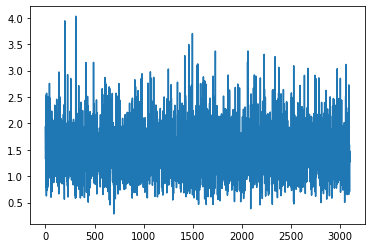

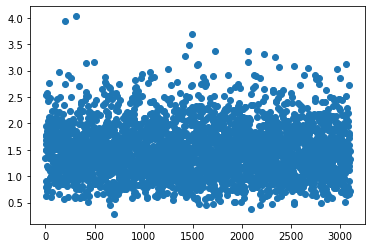

Iteration:  51%|█████████████████████████████████████████████████████▏                                                   | 3200/6317 [1:07:28<1:10:45,  1.36s/it]

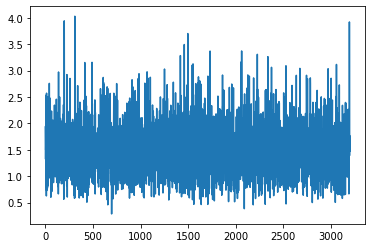

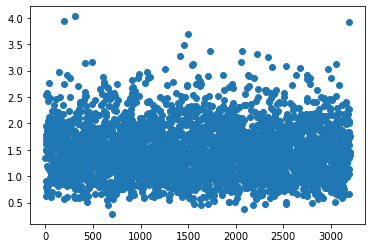

Iteration:  52%|███████████████████████████████████████████████████████▉                                                   | 3300/6317 [1:09:30<57:50,  1.15s/it]

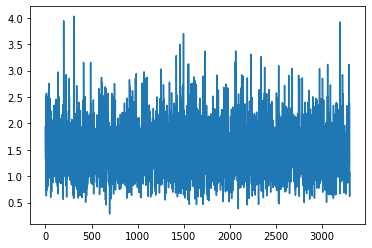

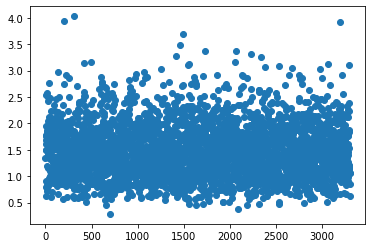

Iteration:  54%|████████████████████████████████████████████████████████▌                                                | 3400/6317 [1:11:38<1:13:53,  1.52s/it]

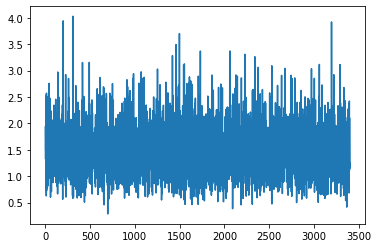

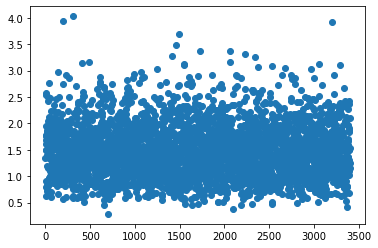

Iteration:  55%|███████████████████████████████████████████████████████████▎                                               | 3500/6317 [1:13:49<56:56,  1.21s/it]

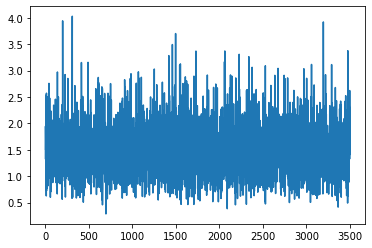

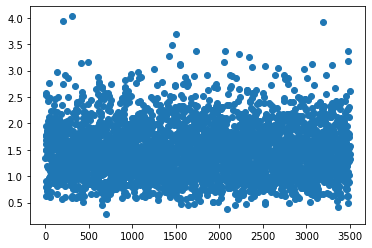

Iteration:  57%|████████████████████████████████████████████████████████████▉                                              | 3600/6317 [1:15:57<49:07,  1.08s/it]

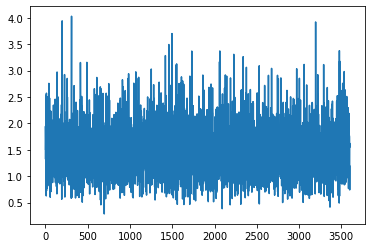

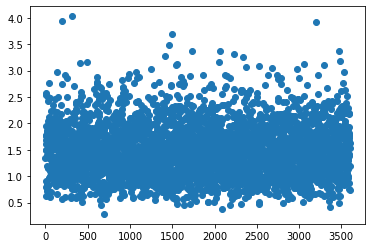

Iteration:  59%|██████████████████████████████████████████████████████████████▋                                            | 3700/6317 [1:18:03<45:49,  1.05s/it]

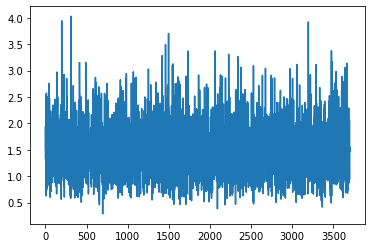

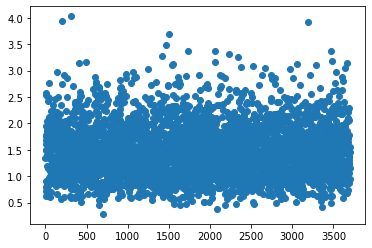

Iteration:  60%|████████████████████████████████████████████████████████████████▎                                          | 3800/6317 [1:20:16<50:07,  1.19s/it]

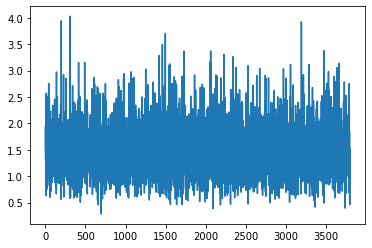

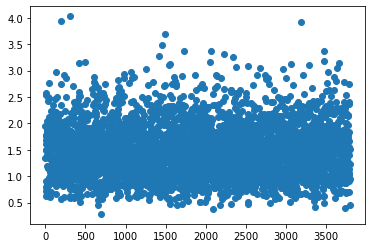

Iteration:  62%|██████████████████████████████████████████████████████████████████                                         | 3900/6317 [1:22:15<44:41,  1.11s/it]

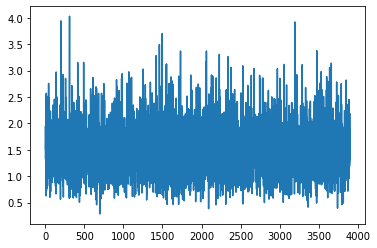

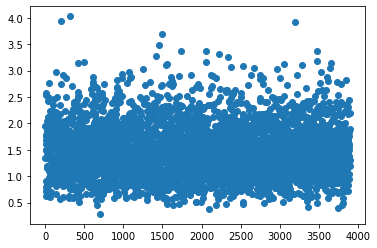

Iteration:  63%|███████████████████████████████████████████████████████████████████▊                                       | 4000/6317 [1:24:29<58:07,  1.51s/it]

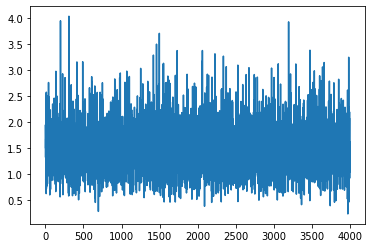

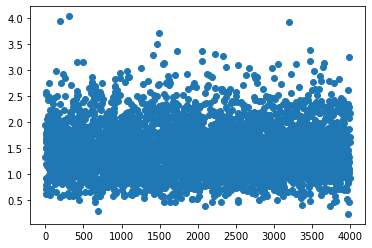

Iteration:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 4100/6317 [1:26:36<56:18,  1.52s/it]

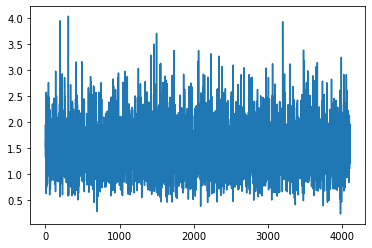

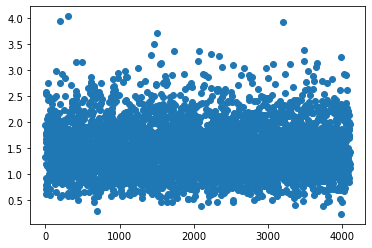

Iteration:  66%|███████████████████████████████████████████████████████████████████████▏                                   | 4200/6317 [1:28:42<49:32,  1.40s/it]

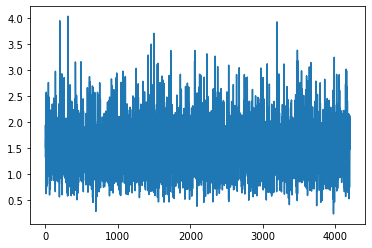

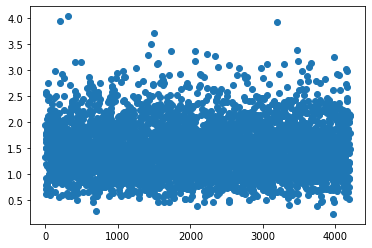

Iteration:  68%|████████████████████████████████████████████████████████████████████████▊                                  | 4300/6317 [1:30:54<44:34,  1.33s/it]

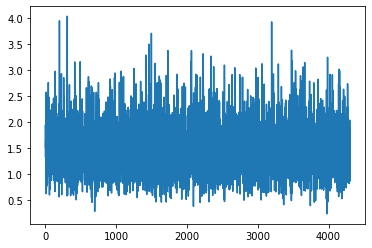

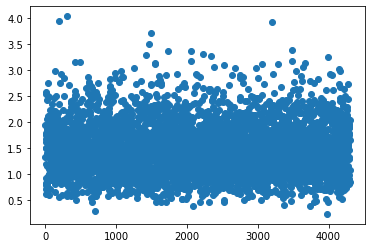

Iteration:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 4400/6317 [1:32:59<33:16,  1.04s/it]

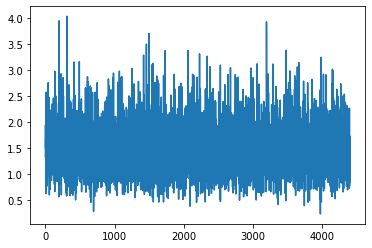

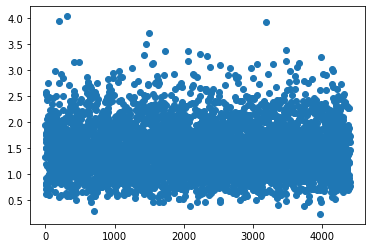

Iteration:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 4500/6317 [1:35:03<43:02,  1.42s/it]

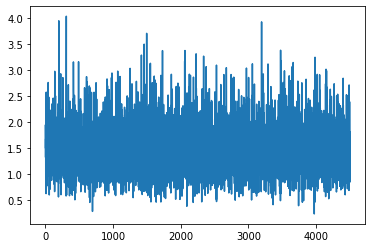

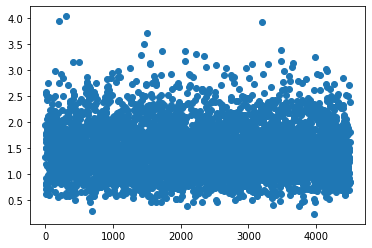

Iteration:  73%|█████████████████████████████████████████████████████████████████████████████▉                             | 4600/6317 [1:37:13<35:41,  1.25s/it]

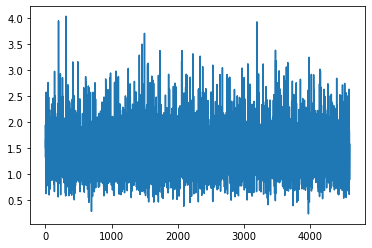

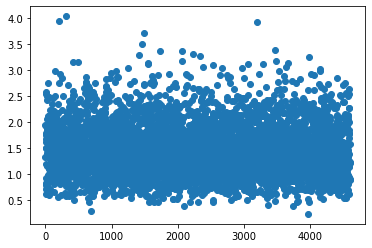

Iteration:  74%|███████████████████████████████████████████████████████████████████████████████▌                           | 4700/6317 [1:39:19<40:48,  1.51s/it]

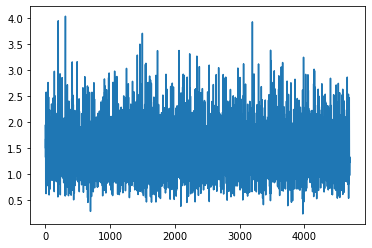

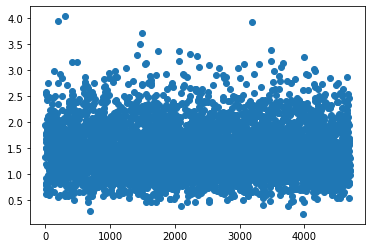

Iteration:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 4800/6317 [1:41:24<38:17,  1.51s/it]

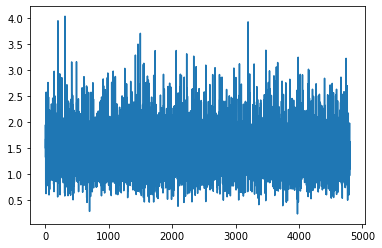

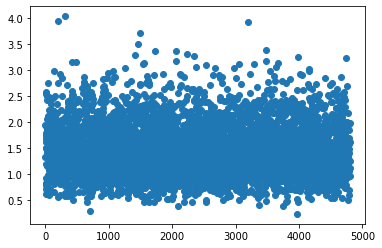

Iteration:  78%|██████████████████████████████████████████████████████████████████████████████████▉                        | 4900/6317 [1:43:28<28:43,  1.22s/it]

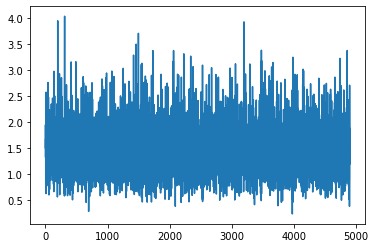

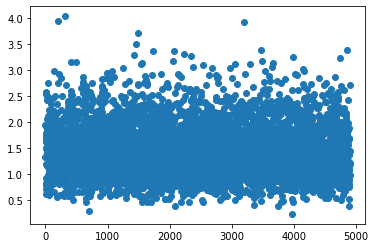

Iteration:  79%|████████████████████████████████████████████████████████████████████████████████████▋                      | 5000/6317 [1:45:38<25:00,  1.14s/it]

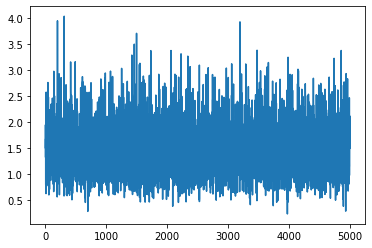

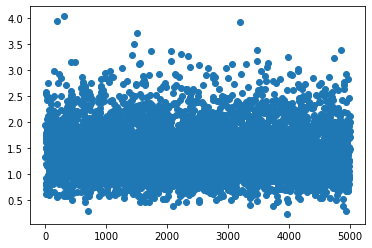

Iteration:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 5100/6317 [1:47:45<28:34,  1.41s/it]

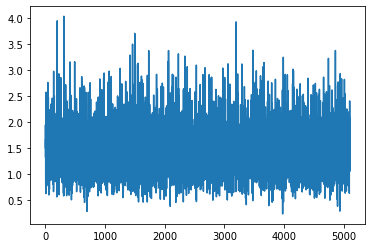

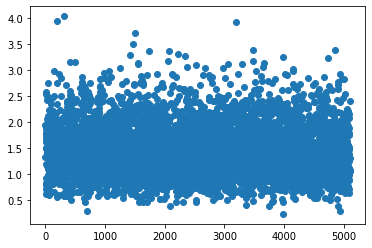

Iteration:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 5200/6317 [1:49:50<21:46,  1.17s/it]

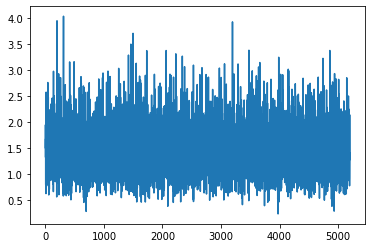

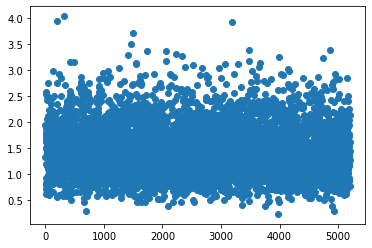

Iteration:  84%|█████████████████████████████████████████████████████████████████████████████████████████▊                 | 5300/6317 [1:52:05<25:36,  1.51s/it]

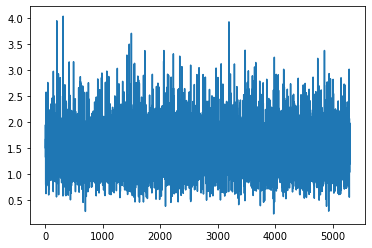

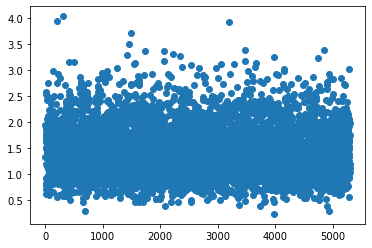

Iteration:  85%|███████████████████████████████████████████████████████████████████████████████████████████▍               | 5400/6317 [1:54:08<17:17,  1.13s/it]

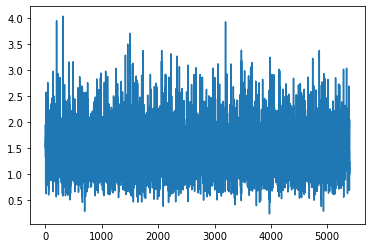

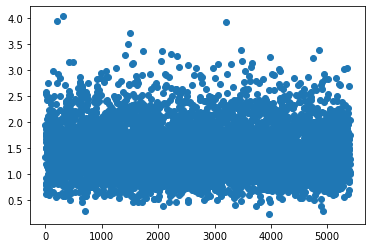

Iteration:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▏             | 5500/6317 [1:56:19<18:51,  1.38s/it]

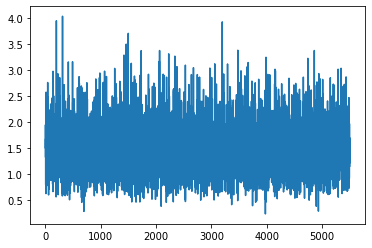

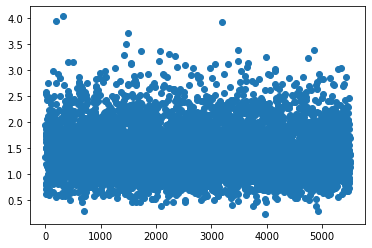

Iteration:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 5600/6317 [1:58:25<13:06,  1.10s/it]

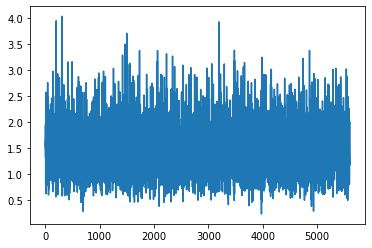

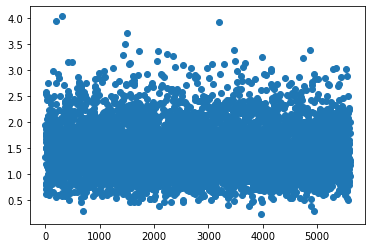

Iteration:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5700/6317 [2:00:33<15:14,  1.48s/it]

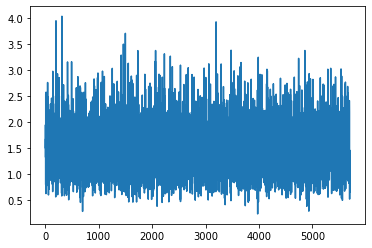

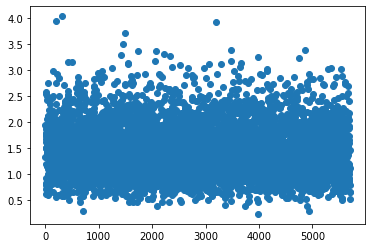

Iteration:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▏        | 5800/6317 [2:02:47<12:49,  1.49s/it]

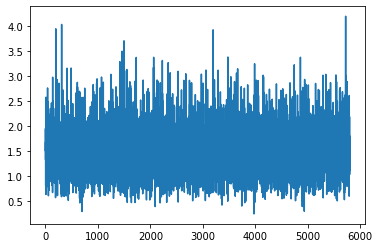

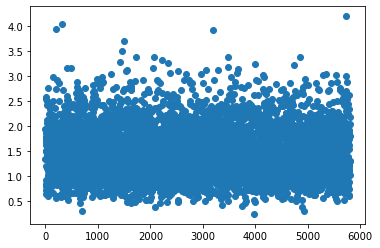

Iteration:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉       | 5900/6317 [2:04:53<10:12,  1.47s/it]

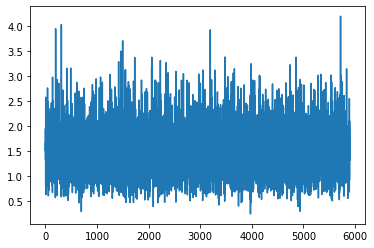

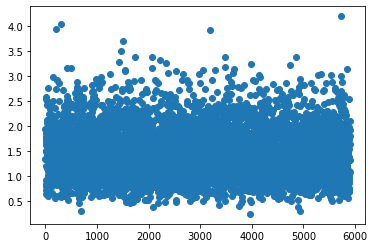

Iteration:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6000/6317 [2:07:02<07:16,  1.38s/it]

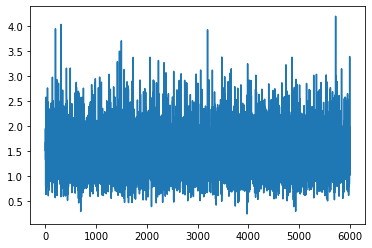

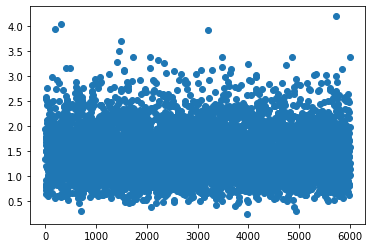

Iteration:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6100/6317 [2:09:16<05:06,  1.41s/it]

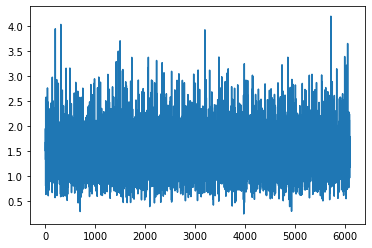

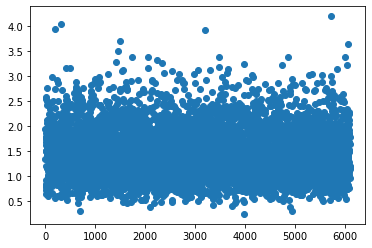

Iteration:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6200/6317 [2:11:27<02:49,  1.45s/it]

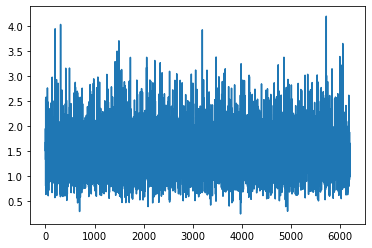

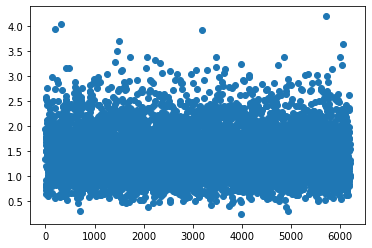

Iteration: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6300/6317 [2:13:32<00:25,  1.51s/it]

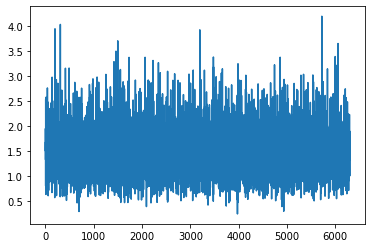

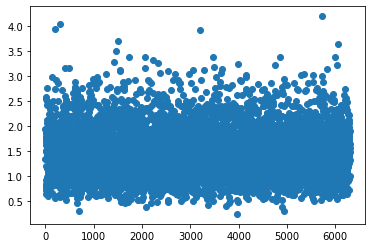

Iteration: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 6317/6317 [2:13:55<00:00,  1.27s/it]

Epoch loss 9273.107559606433
Epoch 5 complete, saving probes


In [9]:
# Training epochs
for epoch in range(epochs):
    
    # create each epochs folder    
    epoch_dir = "results"+"/"+ model_prefix + "/"+"epoch_" + str(epoch + 1)
    if not os.path.exists(epoch_dir):
        os.mkdir(epoch_dir)
    
    print("Training epoch: {}".format(epoch+1))
    adaptor_s.train()
    adaptor_e.train()

    # Track epoch loss
    epoch_loss = 0

    # Initialize train data loader
    train_sampler = RandomSampler(train_dataset)
    train_dataloader = DataLoader(train_dataset, sampler = train_sampler, batch_size = batch_size)
    loss_list = []
    
    iter=0
    for batch in tqdm(train_dataloader, desc = "Iteration"):
        
        # Get batch on the right device and prepare input dict
        batch = tuple(t.to(device) for t in batch)

        inputs = {
            "input_ids": batch[0],
            "attention_mask": batch[1],
            "token_type_ids": batch[2],
            "start_positions": batch[3],
            "end_positions": batch[4],
        }

        # BERT forward pass
        model.eval()
        with torch.no_grad():
            outputs = model(**inputs)

        # Extract hiddent states
        all_layer_hidden_states = outputs[3][1:] # (layers, batch_size, max_seq_len, hidden_size)
        # Get labels, and update probes for batch
        start_targets = batch[3] # (batch_size)
        end_targets  = batch[4] # (batch_size)
        
        # in: (layers, batch_size, max_seq_len, hidden_size)
        # out: (layers, batch_size, max_seq_len, 1)
#         print(torch.stack(list(all_layer_hidden_states)).size())# ->　torch.Size([12, 8, 384, 768])
        s_scores = adaptor_s(list(all_layer_hidden_states)).squeeze() 
#         print(s_scores.size())
        e_scores = adaptor_e(list(all_layer_hidden_states)).squeeze()      
        
        ignored_index = s_scores.size(1)
        size_of_batch = s_scores.size(0)
        # print(ignored_index) 384
        s_scores.clamp_(0, ignored_index) # (8, 384)
        e_scores.clamp_(0, ignored_index) # (8, 384)
        
        start_loss = nn.CrossEntropyLoss(
            weight   = None, ignore_index=ignored_index)(s_scores, start_targets)
        end_loss = nn.CrossEntropyLoss(
            weight = None, ignore_index=ignored_index)(e_scores, end_targets)

        loss = (1.5*start_loss+end_loss)/2.5
        
        loss.backward()
        
        torch.nn.utils.clip_grad_norm_min(
            adaptor_s.parameters(), max_grad_norm)
        torch.nn.utils.clip_grad_norm_(
            adaptor_e.parameters(), max_grad_norm)

        start_optimizer.step()
        end_optimizer.step()

        adaptor_s.zero_grad()
        adaptor_e.zero_grad()
        
        batch_loss = float(loss)
        loss_list.append(batch_loss)
        
        if (iter != 0 and iter%100==0):
            plt.plot(loss_list)
            plt.show()
            plt.plot(loss_list,'o')
            plt.show()
        
        epoch_loss+=batch_loss
        iter+=1
        
        # store min loss's hidden state
        if iter % 100 == 0:
            torch.save(adaptor_s.state_dict(), epoch_dir + "/" + "_start_idx_per100")
            torch.save(adaptor_e.state_dict(), epoch_dir + "/" + "_end_idx_per100")
        if batch_loss < min_loss:
            torch.save(adaptor_s.state_dict(), epoch_dir + "/" + "_start_idx")
            torch.save(adaptor_e.state_dict(), epoch_dir + "/" + "_end_idx")
            min_loss = batch_loss        

    print("Epoch loss {}".format(epoch_loss))
    print("Epoch {} complete, saving probes".format(epoch+1))